In [1]:
# what are the steps taht we perform here

# [x] grab the data 
# [] run multiple gauss fits over the date with multiple initialization points 
# [] check what is the result for each run and which one gives the least error
# [] take only 70% of the points 
# [] write the result to the csv

# [] final consolidated table -> made per channel per type of gene

In [2]:
# want to see the images inline
%matplotlib inline

# imports
# general 
import os
import glob
from functools import reduce
import re
import csv as csv
# scientific 
import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model, datasets
from scipy.stats import norm, gamma
from scipy.optimize import curve_fit
from scipy import special

import pandas as pd

from sklearn.metrics import mean_squared_error, mean_absolute_error

In [3]:
# simple gamma function
def g_x(x, a, c):
    return x**(a - 1)*np.exp(-x)/special.gamma(a) + c

In [4]:
# function for loading one data-set
def load_data(file_path, skiprows_=1):
    data = np.loadtxt(file_path, delimiter = '\t', skiprows=skiprows_)
    # print(data.shape) 
    # handles some weird cases, e.g. when there is no data in the file
    if (len(data.shape) < 2):
        data = data[None, :]
    if (data.shape[1] == 0):
        I = np.array([0])
    else:
        I = data[:, -1]
    return I

In [9]:
# some folder magic 
# folder = '/Volumes/1TB/2018-05-15-12-30-27-SEA12-full-stack/' # folder contains z-corrected spots 
folder = '/Volumes/MILKYKLIM/super full n2/'

In [10]:
# some const params for all graphs
num_bins = 100; 
# graph [xmin, xmax]
xmin = 0
xmax = 3

binwidth = (xmax - xmin)/(num_bins - 1)

In [11]:
bins = np.arange(xmin, xmax + binwidth, binwidth)
print ('bins: ', bins.shape)

bins:  (100,)


I_min: -0.11 I_max: 2.68
30.00174967866202 -0.9867696774228302 0.06932721403955963
peak center: 1.024024024024024


/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


(0, 3)

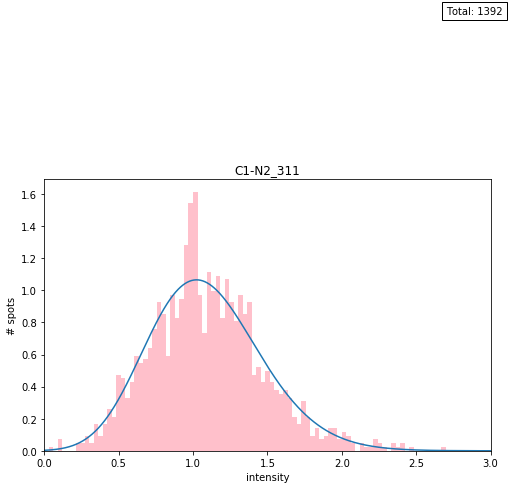

In [12]:
# for testing 
filename = 'C1-N2_311'
filepath =  folder + "csv-2/" + filename + '.csv'
I = load_data(filepath)

fig = plt.figure(figsize=(8,5))
title = 'C1-N2_311'
plt.title(title)
    
plt.xlabel('intensity')
plt.ylabel('# spots')

print("I_min:", min(I), "I_max:", max(I))

I_res = I
fit_alpha, fit_loc, fit_beta = gamma.fit(I_res)
print(fit_alpha, fit_loc, fit_beta)

plt.hist(I, bins=bins, color='pink', normed=True); # 
# plt.text(0.9*xmax, 0.1, "Total: " + str(I.shape[0]), color='black', bbox=dict(facecolor='white', alpha=1))

info_text = "Total: " + str(I.shape[0])

x_limits = [xmin, xmax]
ymax = np.max(np.histogram(I, bins)[0])
y_limits = [0, ymax]

plt.text(x_limits[1] - (x_limits[1] - x_limits[0])*0.1, y_limits[0] + (y_limits[1] - y_limits[0])*0.04, info_text, color='black', bbox=dict(facecolor='white', alpha=1))
   

x = np.linspace(xmin, xmax, 1000)
y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)
plt.plot(x,y)

print("peak center:", x[np.argmax(y)])

plt.xlim([xmin, xmax])

# plt.legend(loc = 'upper right')

In [13]:
# possible labels 
stain = ['DPY-23_EX', 'WDR-5.2', 'MDH-1']
stage = 'E' # only embryos
comment = '' # only empty ones

In [14]:
# important indices
stain_columns = ['C0_stain', 'C1_stain', 'C2_stain', 'C3_stain', 'C4_stain']
type_columns = ['C0_type', 'C1_type', 'C2_type', 'C3_type', 'C4_type']
stain_prefix = np.array([['C1-', 'C2-', 'C3-', 'C4-', 'C5-']])
ext = '.csv'
filename_column = 'new filename'

In [15]:
# read the db and parse images that we want to process
df = pd.read_csv(folder + "smFISH-database/N2-Table 1.csv", sep=',', na_values=['']);
df.head()

,Line,ID,C0_lambda,C0_stain,C0_type,C1_lambda,C1_stain,C1_type,C2_lambda,C2_stain,...,comment,date,original filename,new filename,#nuclei,#C0_smfish,#C1_smfish,#C2_smfish,#C3_smfish,#C4_smfish
0,N2,1.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,not complete,11/17/2016,2016-11-17_N2-DPY-23-001.nd2,N2_1,NaN,NaN,NaN,NaN,NaN,NaN
1,N2,2.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,dirt,11/17/2016,2016-11-17_N2-DPY-23-002.nd2,N2_2,NaN,NaN,NaN,NaN,NaN,NaN
2,N2,3.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,"dirt, not complete",11/17/2016,2016-11-17_N2-DPY-23-003.nd2,N2_3,NaN,NaN,NaN,NaN,NaN,NaN
3,N2,4.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,NaN,11/17/2016,2016-11-17_N2-DPY-23-004.nd2,N2_4,NaN,NaN,NaN,NaN,NaN,NaN
4,N2,5.0,670.0,FISH,DPY-23_EX,488.0,AF,NaN,405.0,NUCLEAR,...,not complete,11/17/2016,2016-11-17_N2-DPY-23-005.nd2,N2_5,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# this is general
# filter to have only *good* and *embryo* files
good_indices = np.logical_and((df['stage'] == stage).tolist() , (df['comment'].isnull()).tolist())
good_indices.shape[0]


print(np.sum(good_indices == True))

596


In [21]:
# choose necessary stains
dataset1 = []
df_good = (df[type_columns].astype(np.object) == stain[0]).loc[good_indices, :]
row, col = np.where(df_good)
n_samples = df.shape[0]
new_prefix = np.repeat(stain_prefix, n_samples, axis=0)[row, col]
new_filename = df[filename_column].loc[good_indices].as_matrix()[row]
dataset1 = ["{}{}".format(a_, b_) for a_, b_ in zip(new_prefix, new_filename)]

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


In [22]:
# choose necessary stains
dataset2 = []
df_good = (df[type_columns].astype(np.object) == stain[1]).loc[good_indices, :]
row, col = np.where(df_good)
n_samples = df.shape[0]
new_prefix = np.repeat(stain_prefix, n_samples, axis=0)[row, col]
new_filename = df[filename_column].loc[good_indices].as_matrix()[row]
dataset2 = ["{}{}".format(a_, b_) for a_, b_ in zip(new_prefix, new_filename)]

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


In [23]:
# choose necessary stains
dataset3 = []
df_good = (df[type_columns].astype(np.object) == stain[2]).loc[good_indices, :]
row, col = np.where(df_good)
n_samples = df.shape[0]
new_prefix = np.repeat(stain_prefix, n_samples, axis=0)[row, col]
new_filename = df[filename_column].loc[good_indices].as_matrix()[row]
dataset3 = ["{}{}".format(a_, b_) for a_, b_ in zip(new_prefix, new_filename)]

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


In [24]:
print(len(dataset1) + len(dataset2) + len(dataset3))

1146


In [25]:
def create_title(path, name_id=-1):
    # get the name of the initial image
    image_name = path.split("/")[name_id] # was 8
    # print(path.split("/"))
    # create the full title 
    title = image_name[:-4]
    return title
# create_title("/Users/kkolyva/Desktop/n2/N2-results/all/C1-N2_9.csv")

In [47]:
labels = ['DPY-23_EX'] # ['DPY-23_EX', 'WDR-5.2', 'MDH-1']
color = '#00A79D' # '#BA5536'
if labels[0] == 'MDH-1':
    color = '#FF9300' # "#693D3D"

In [48]:
# actual plotting 

dataset_to_use = dataset1
if labels[0] == 'MDH-1':
    dataset_to_use = dataset3
    
dataset = []
p_dataset = []
for j in range(0, len(dataset_to_use)):
    tmp = folder + "csv-2/" + dataset_to_use[j] + ".csv"
    dataset.append(tmp)
    print(tmp)

/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_9.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_16.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_17.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_23.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_25.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_27.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_29.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_51.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_62.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_63.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_64.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_65.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_69.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_72.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_75.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_80.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_81.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_82.csv
/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_84.csv
/Volumes/MILK

In [49]:
# how good is fitter-meter?
def fitter_meter(y, y_hat):
    return [mean_absolute_error(y,y_hat), np.sqrt(mean_squared_error(y,y_hat))]

error: L1, L2 [5.8137559394590355, 9.627049385500952]
peak center: 0.9696969696969697


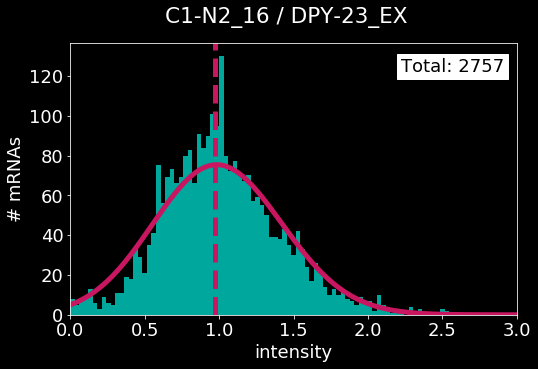

error: L1, L2 [7.326434638430533, 10.869574495343503]
peak center: 0.9696969696969697


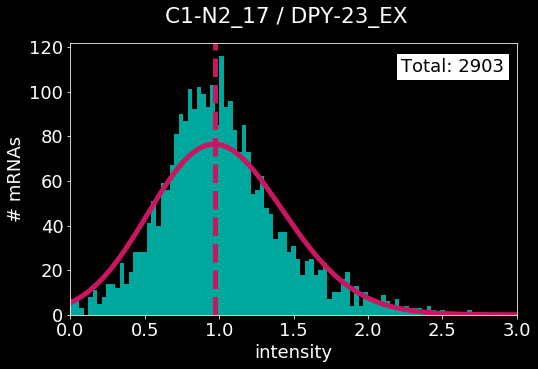

error: L1, L2 [2.4414660932230405, 4.839849202715768]
peak center: 0.9393939393939394


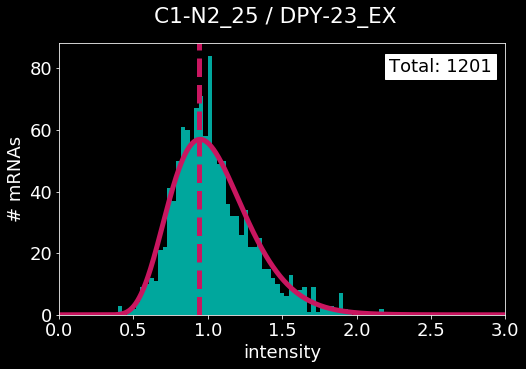

error: L1, L2 [5.46040685157553, 9.588153430774991]
peak center: 0.9696969696969697


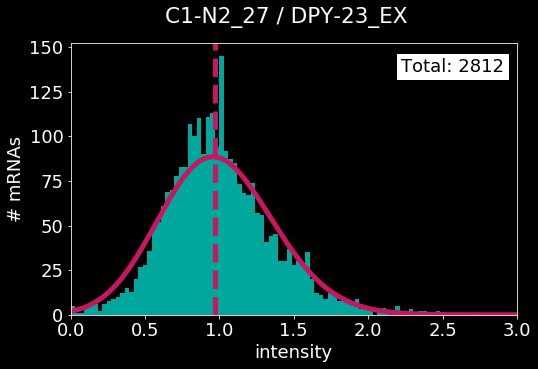

error: L1, L2 [7.037657433530207, 11.411277282849506]
peak center: 1.0


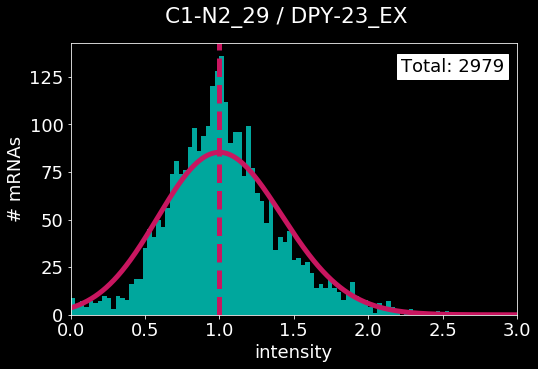

error: L1, L2 [3.89313969222973, 7.556896785975276]
peak center: 0.9696969696969697


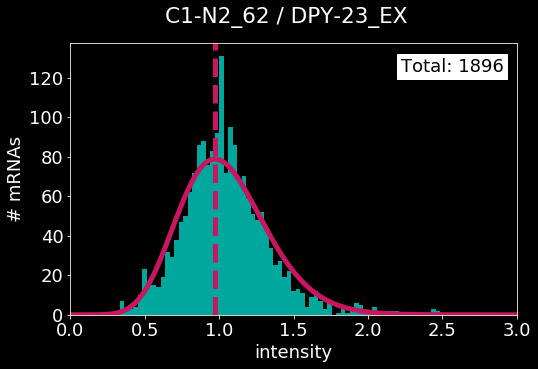

error: L1, L2 [3.136098464604302, 6.46401892347937]
peak center: 1.0


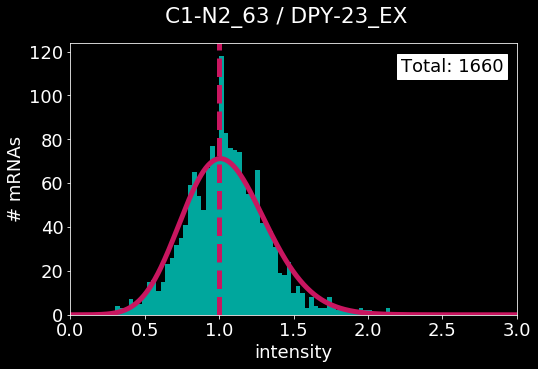

error: L1, L2 [7.965647747472112, 29.290723789473226]
peak center: 0.09090909090909091


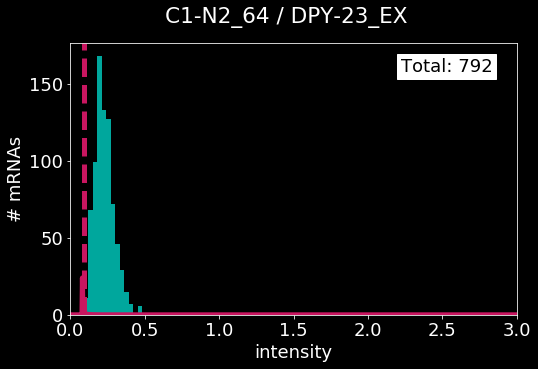

error: L1, L2 [3.7646904462371036, 7.161539480355813]
peak center: 1.0


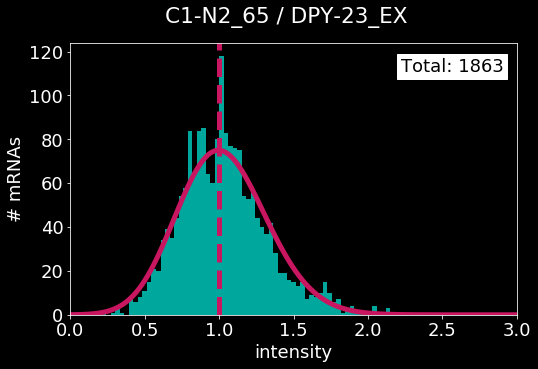

error: L1, L2 [2.9501873138602455, 4.475057879388934]
peak center: 1.0


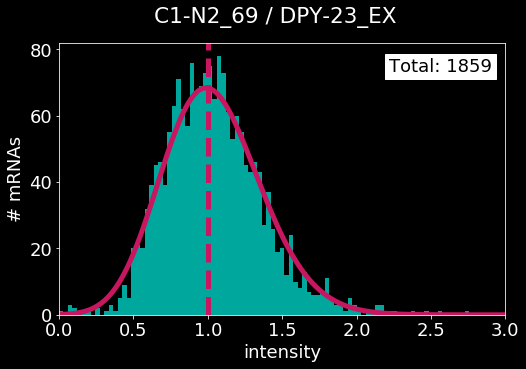

error: L1, L2 [15.159976679510418, 29.315759282425816]
peak center: 0.12121212121212122


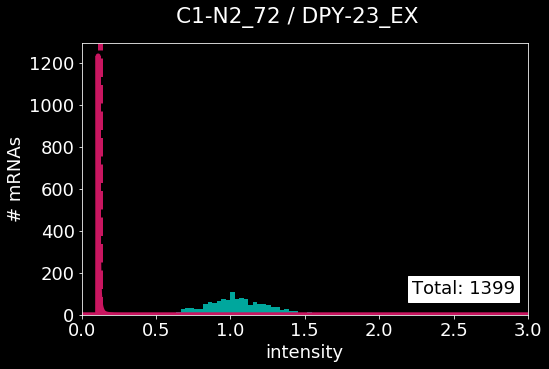

error: L1, L2 [3.1720272810618533, 5.841791236252811]
peak center: 1.0


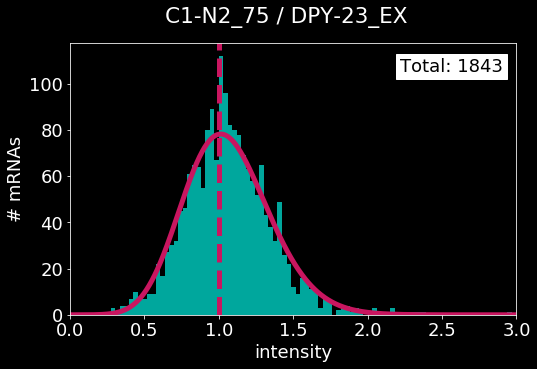

error: L1, L2 [4.655851601226733, 8.059343313199605]
peak center: 1.0


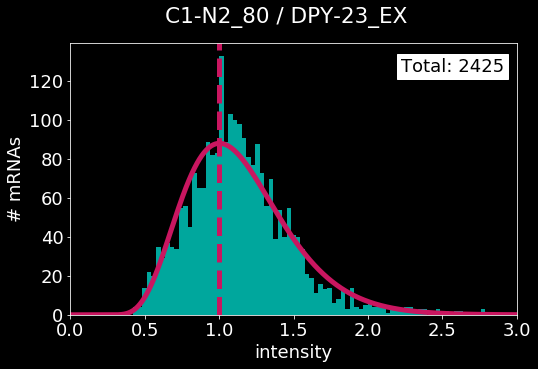

error: L1, L2 [3.228209000214643, 6.395979551944471]
peak center: 1.0


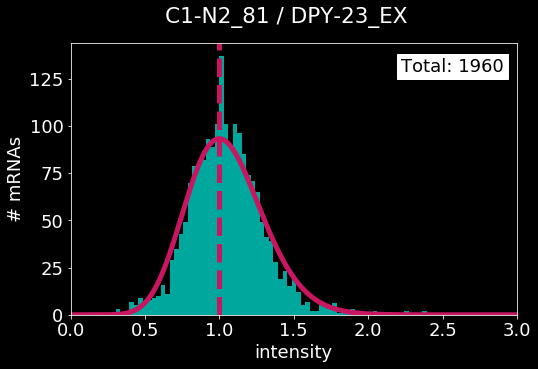

error: L1, L2 [4.20662723965584, 7.6022856171899305]
peak center: 1.0303030303030303


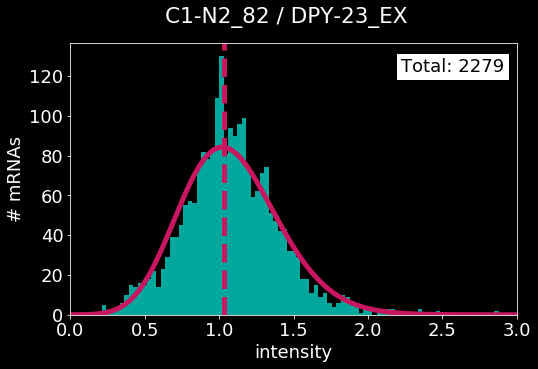

error: L1, L2 [4.1705959638696175, 8.73891492054375]
peak center: 1.0


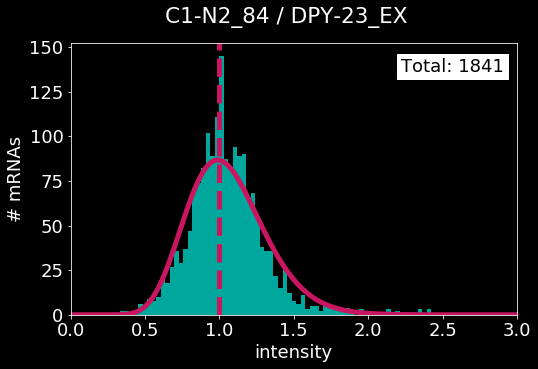

error: L1, L2 [2.9809234877335364, 6.24355947412668]
peak center: 0.9393939393939394


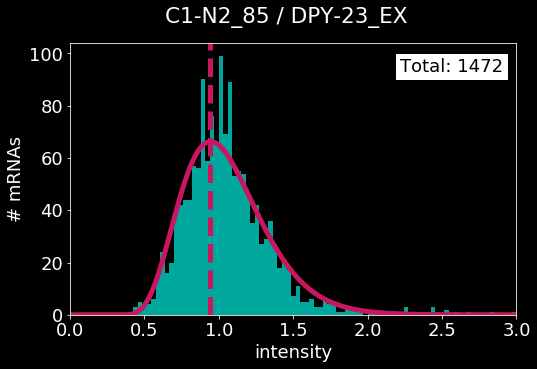

error: L1, L2 [4.913092320928467, 9.256456679974653]
peak center: 1.0


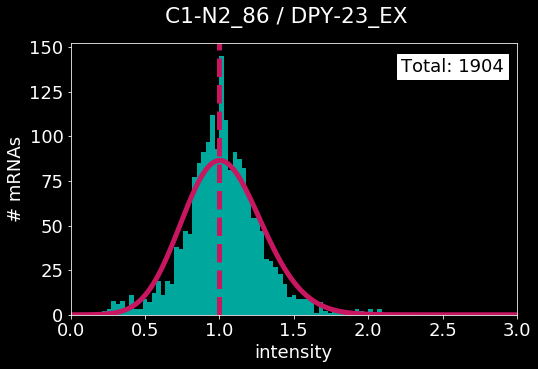

error: L1, L2 [5.307335441403202, 10.010749455922578]
peak center: 1.0


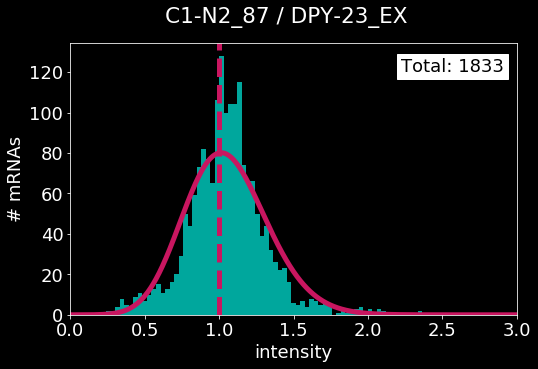

error: L1, L2 [5.080714630033659, 8.812046736958955]
peak center: 0.9696969696969697


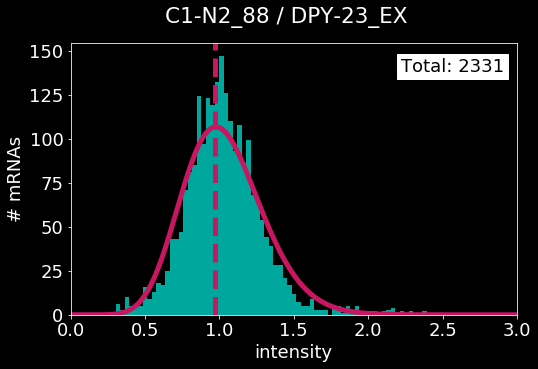

error: L1, L2 [2.8127605955218717, 5.474012201587628]
peak center: 0.9696969696969697


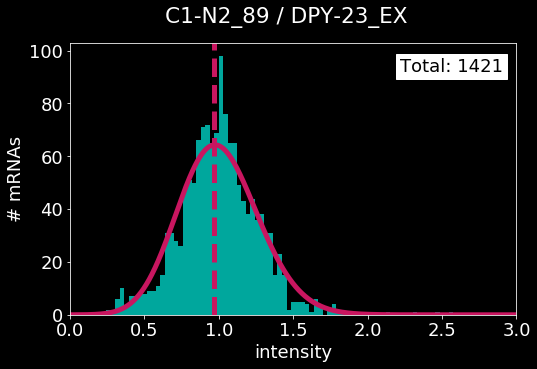

error: L1, L2 [3.972283966053478, 7.531539627039784]
peak center: 1.0


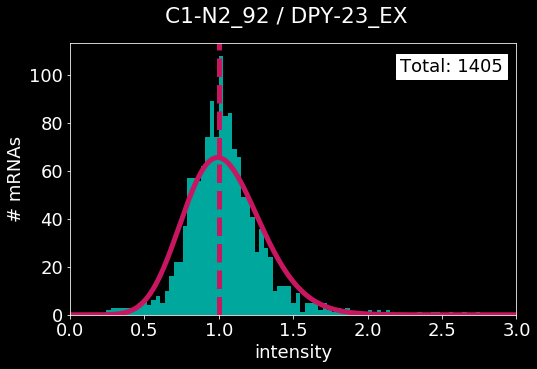

error: L1, L2 [5.900104833000548, 11.372676107856728]
peak center: 0.9696969696969697


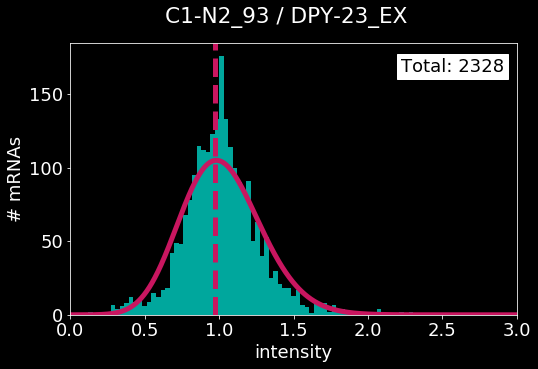

error: L1, L2 [3.177836659230899, 5.8055676414132416]
peak center: 0.9393939393939394


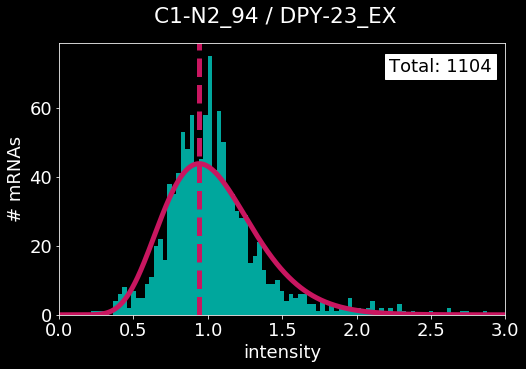

error: L1, L2 [4.105575301523041, 7.497786616562536]
peak center: 0.9696969696969697


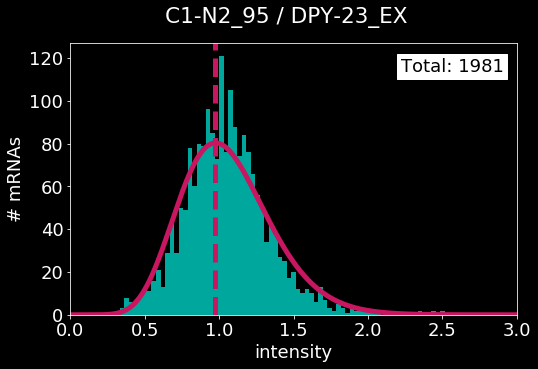

error: L1, L2 [4.083321340002606, 8.032912514875003]
peak center: 0.9696969696969697


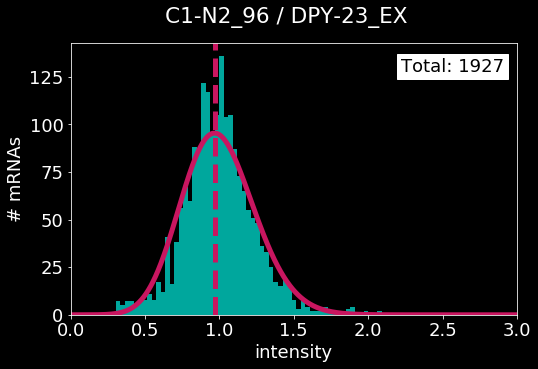

error: L1, L2 [3.966643349954576, 6.384620456253229]
peak center: 2.4545454545454546


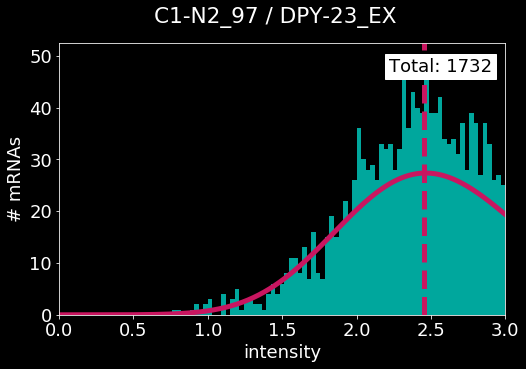

error: L1, L2 [4.181850072474091, 9.460792484168527]
peak center: 0.9393939393939394


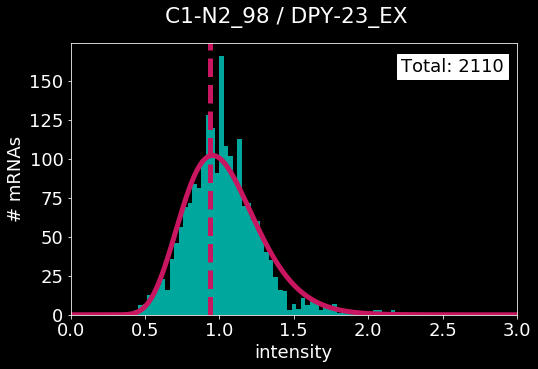

error: L1, L2 [3.575944977794442, 6.613555061841995]
peak center: 1.0


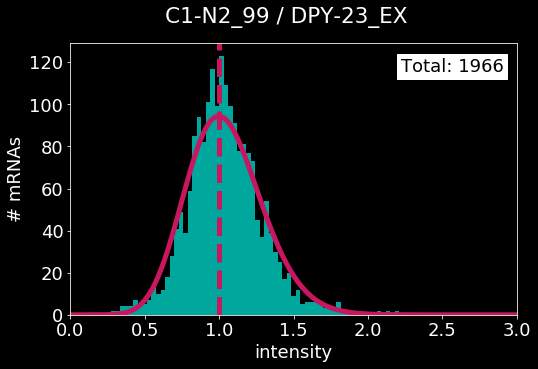

error: L1, L2 [3.2594824916081824, 6.33943441846474]
peak center: 1.0


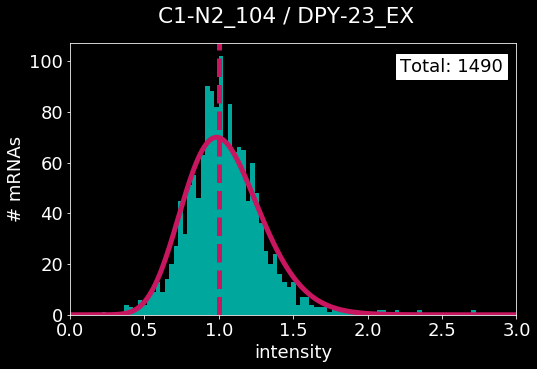

error: L1, L2 [2.9216489443193305, 5.346805201205011]
peak center: 0.9696969696969697


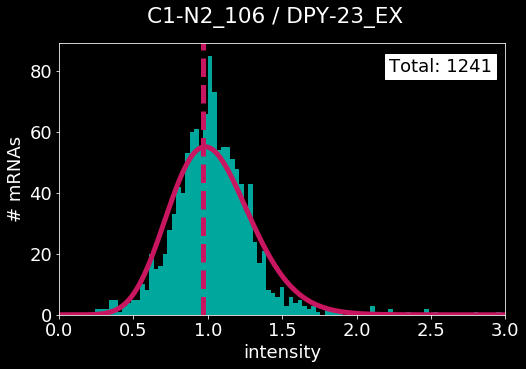

error: L1, L2 [2.7590630556945355, 4.507257155609414]
peak center: 1.0


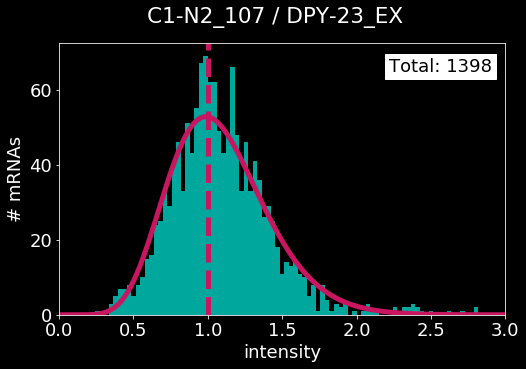

error: L1, L2 [3.527929145957707, 6.857710972019922]
peak center: 1.0303030303030303


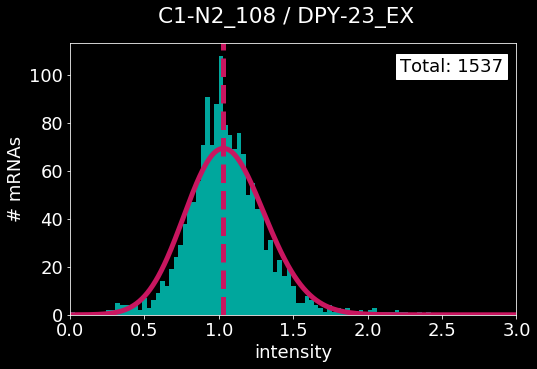

error: L1, L2 [4.131469825473125, 7.3354327411042]
peak center: 0.9696969696969697


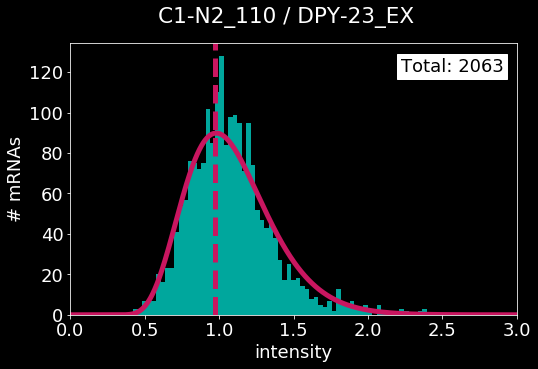

error: L1, L2 [3.6516300014261245, 7.020710908566968]
peak center: 1.0


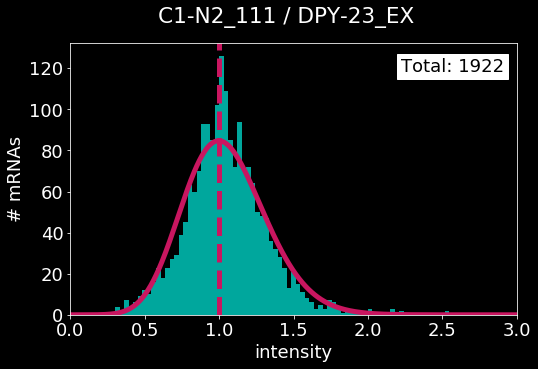

error: L1, L2 [3.8589170744081827, 6.839069962600723]
peak center: 1.0


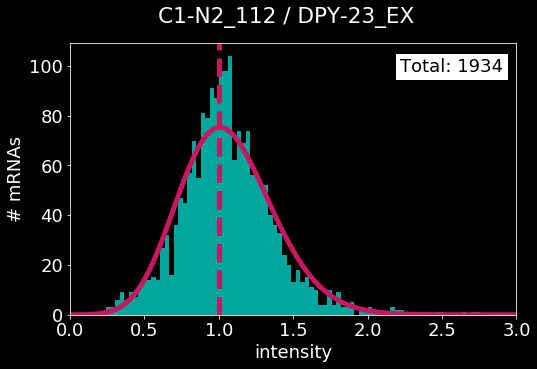

error: L1, L2 [2.39337006399972, 4.6338487059468765]
peak center: 0.9696969696969697


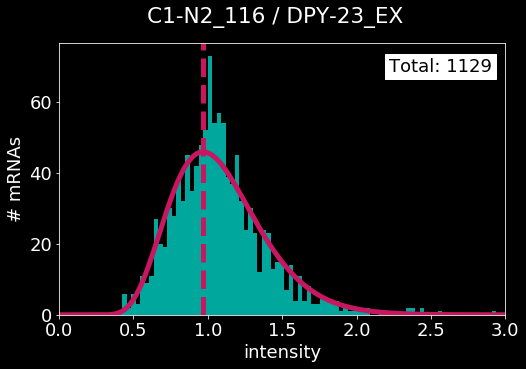

error: L1, L2 [2.512522158939276, 5.263143608721392]
peak center: 1.0


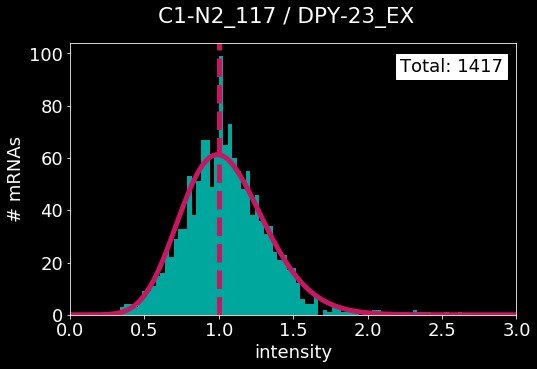

error: L1, L2 [3.825342443304356, 6.655860420758239]
peak center: 1.0


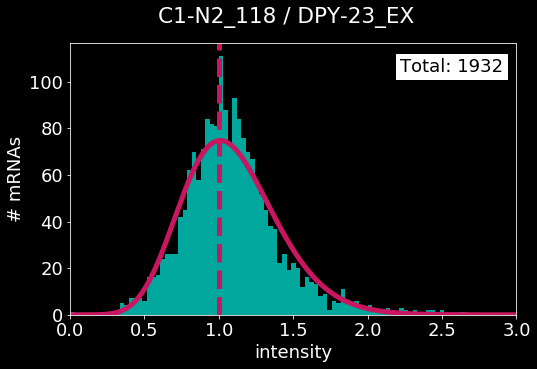

error: L1, L2 [3.7652978706947398, 8.933021061110733]
peak center: 0.9696969696969697


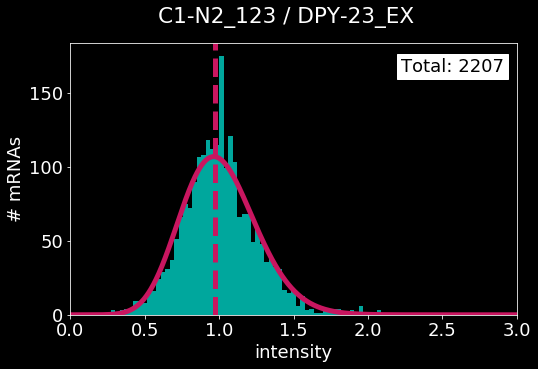

error: L1, L2 [5.393936812055702, 8.28541628231279]
peak center: 1.0


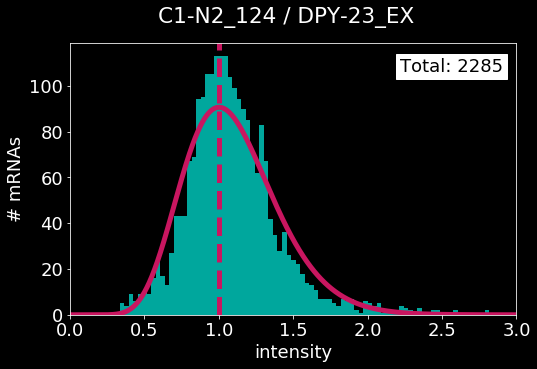

error: L1, L2 [1.3298610810162454, 2.8956204706239914]
peak center: 0.5757575757575758


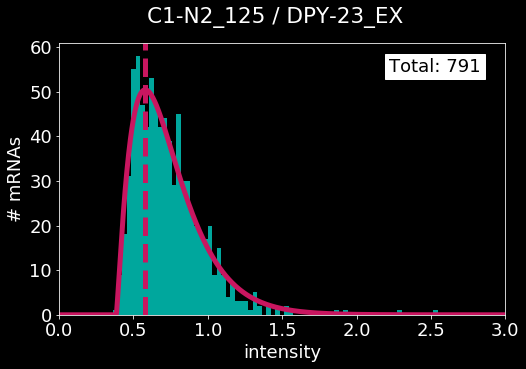

error: L1, L2 [5.1659321020957085, 9.284876535828989]
peak center: 1.0


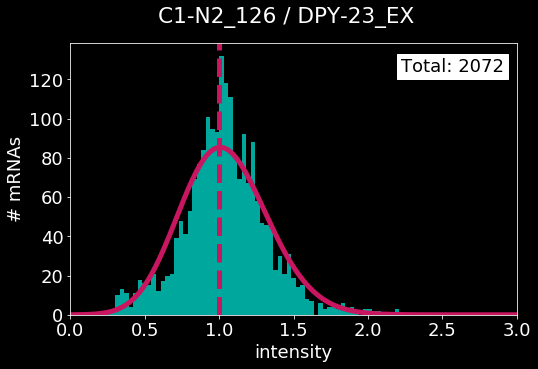

error: L1, L2 [2.4726049266987458, 4.038706460280702]
peak center: 0.9393939393939394


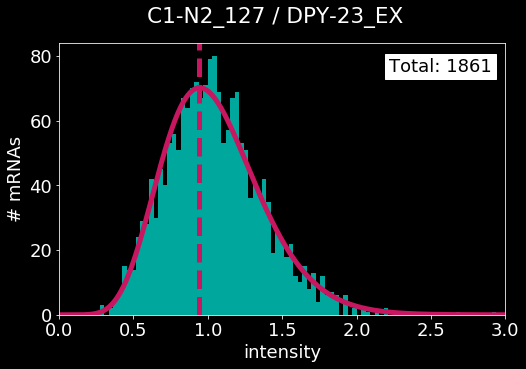

error: L1, L2 [3.1833780413419377, 6.070649643656899]
peak center: 0.9696969696969697


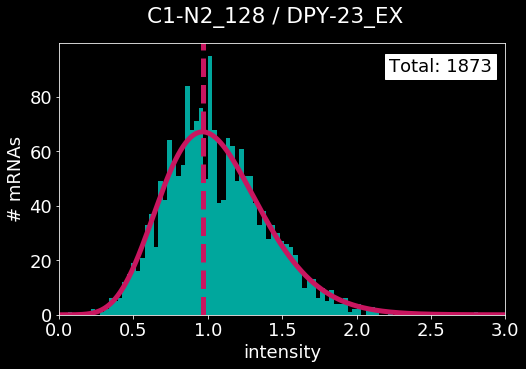

error: L1, L2 [2.088362865761436, 4.689674255671641]
peak center: 0.9696969696969697


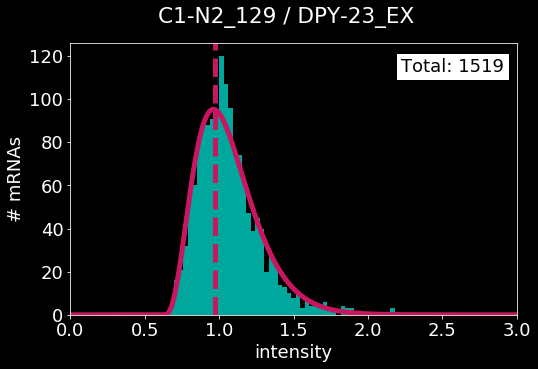

error: L1, L2 [3.5968144516005647, 7.009021578587729]
peak center: 1.0


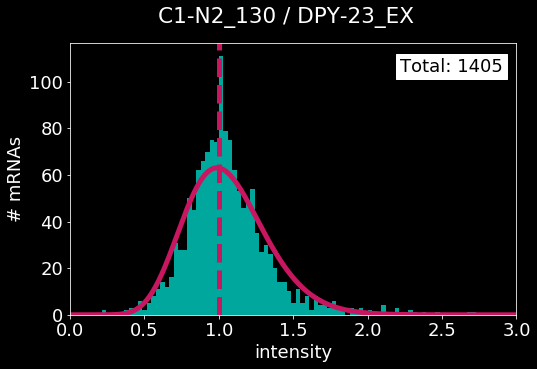

error: L1, L2 [4.62213650489721, 7.87999966581058]
peak center: 0.9696969696969697


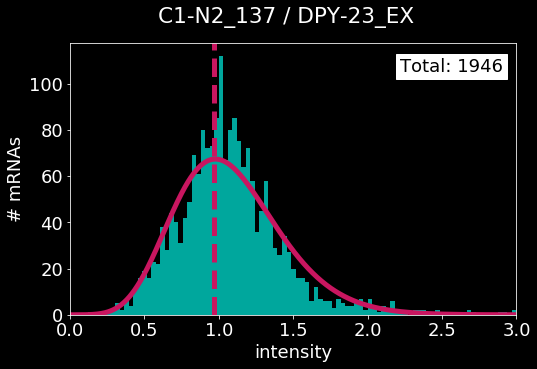

error: L1, L2 [3.36055383691266, 6.350610246027509]
peak center: 1.0


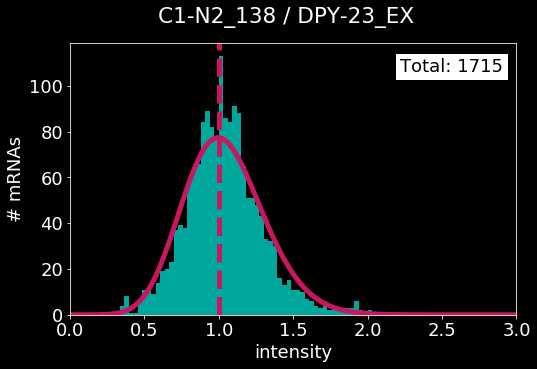

error: L1, L2 [2.418333086042641, 4.381222521514281]
peak center: 0.9696969696969697


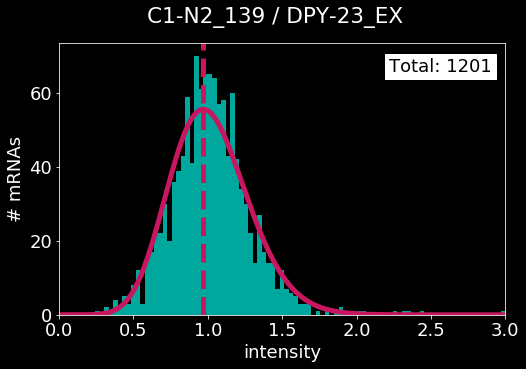

error: L1, L2 [3.653835339360299, 6.761691781752681]
peak center: 1.0


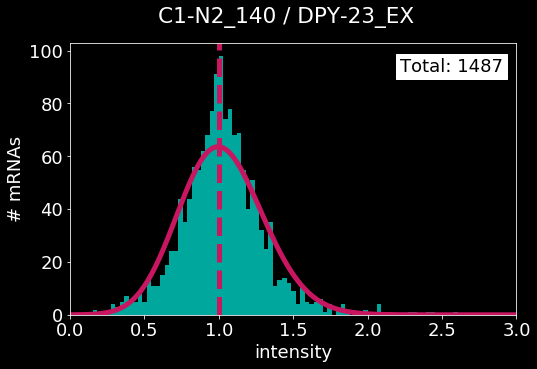

error: L1, L2 [3.1059427183522414, 6.142807547886735]
peak center: 1.0


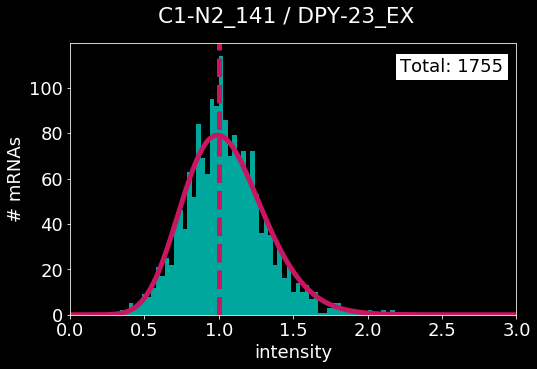

error: L1, L2 [2.978820418275932, 5.366353622229287]
peak center: 1.0303030303030303


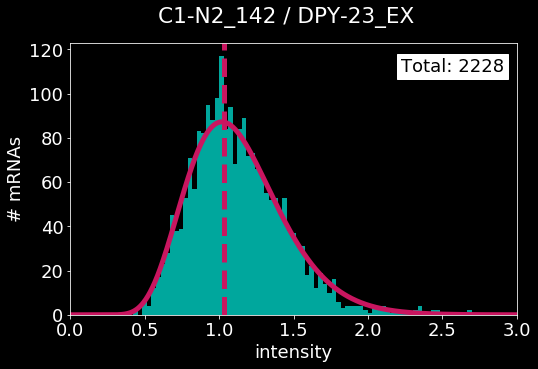

error: L1, L2 [2.1658177389373394, 4.329904070363518]
peak center: 1.0


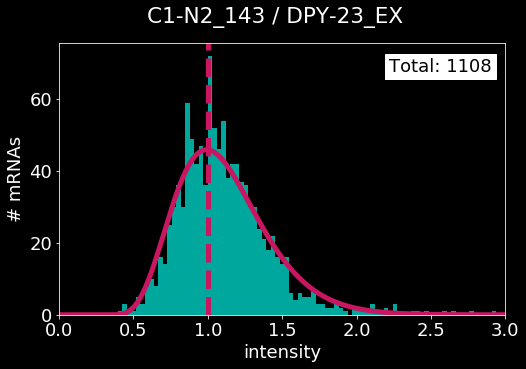

error: L1, L2 [3.1083126295028887, 6.544435216717618]
peak center: 1.0


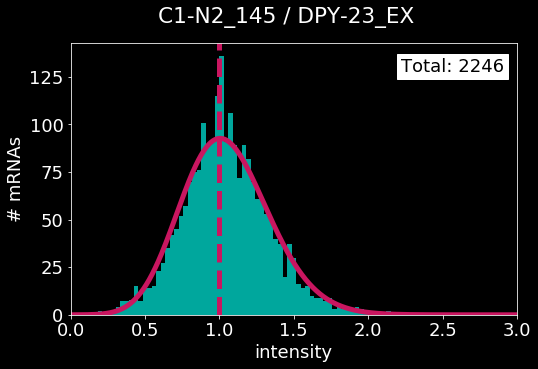

error: L1, L2 [5.141445708604657, 9.884736010682975]
peak center: 0.9696969696969697


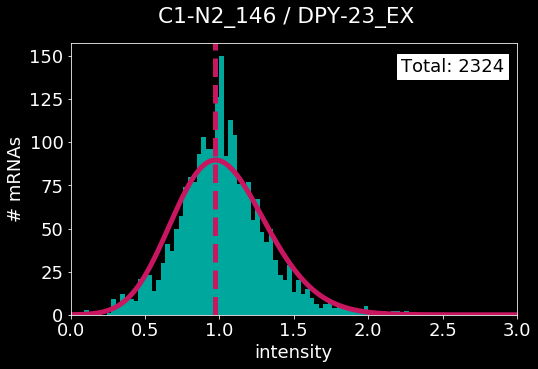

error: L1, L2 [2.515748025975241, 4.284903664683594]
peak center: 1.0


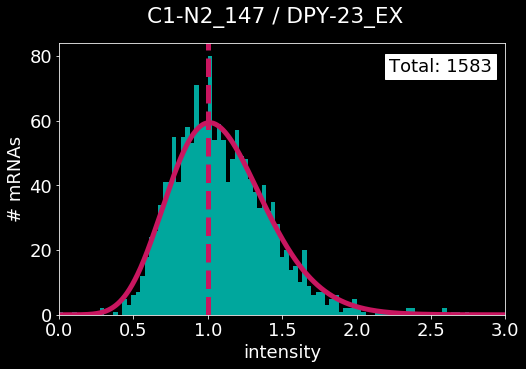

error: L1, L2 [3.4878791681383454, 6.3187759107667105]
peak center: 0.9393939393939394


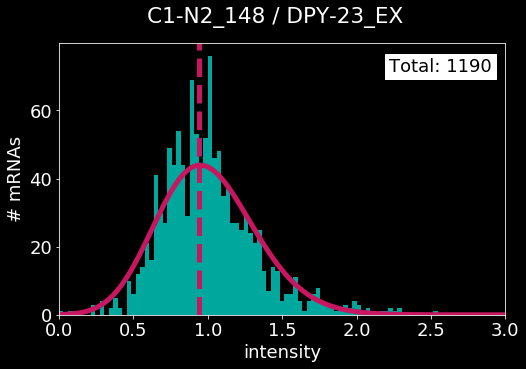

error: L1, L2 [3.157372134229414, 5.670272809036737]
peak center: 0.9696969696969697


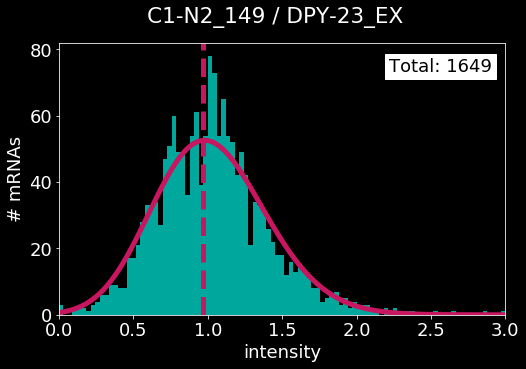

error: L1, L2 [4.726104862951166, 8.458560607501504]
peak center: 1.0


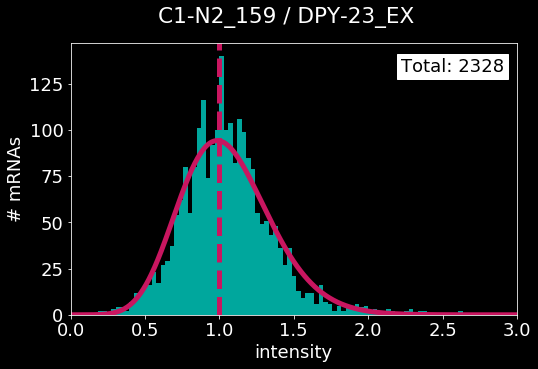

error: L1, L2 [2.6281430577788996, 4.662453561757003]
peak center: 1.0


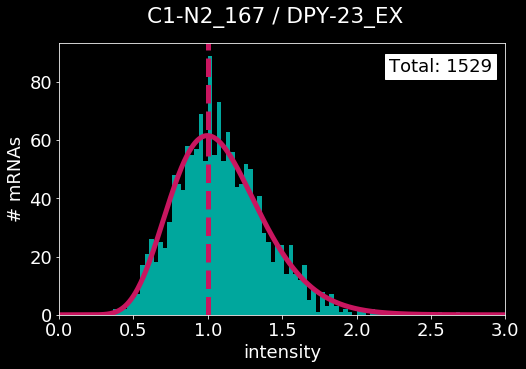

error: L1, L2 [5.26952532202628, 9.151128672827042]
peak center: 1.0


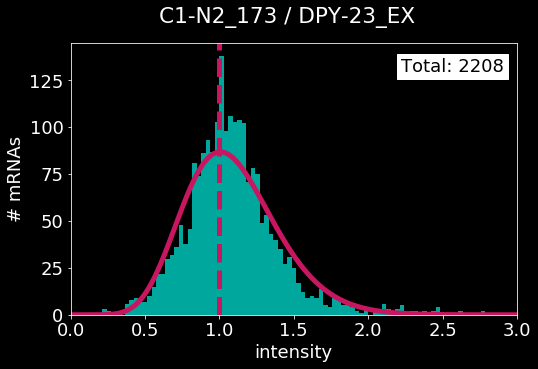

error: L1, L2 [3.935845316193401, 7.244530371889416]
peak center: 1.0


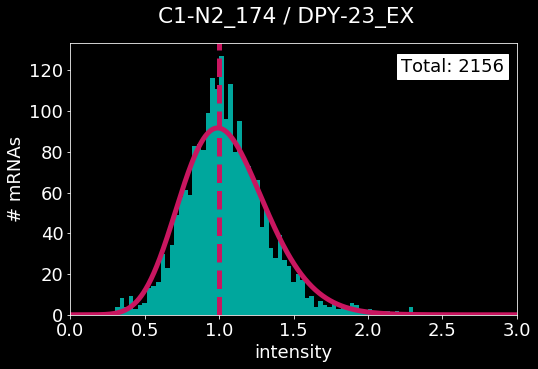

error: L1, L2 [3.8806102949558885, 8.085298758860688]
peak center: 1.0303030303030303


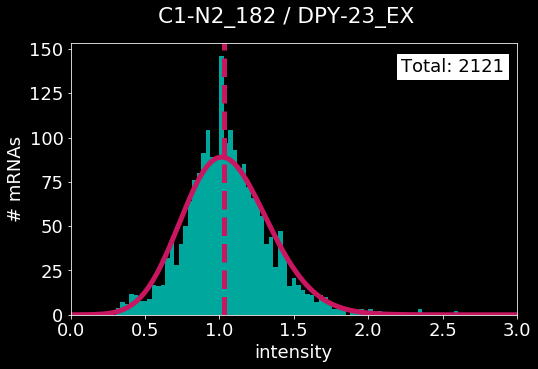

error: L1, L2 [3.9664153799133945, 7.9332052864718285]
peak center: 1.0303030303030303


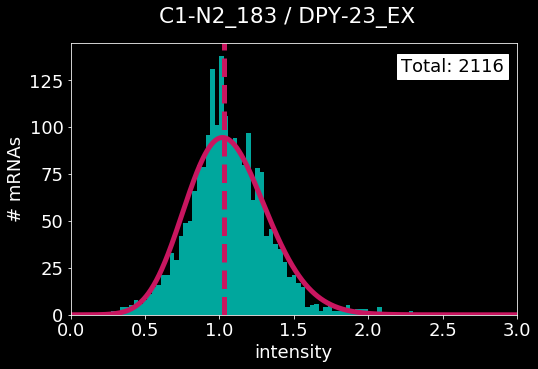

error: L1, L2 [3.7246636091416634, 6.842286348442479]
peak center: 0.9696969696969697


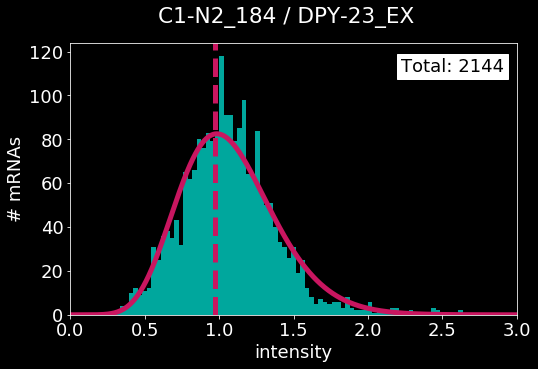

error: L1, L2 [3.722996693378, 5.896791414979833]
peak center: 1.0


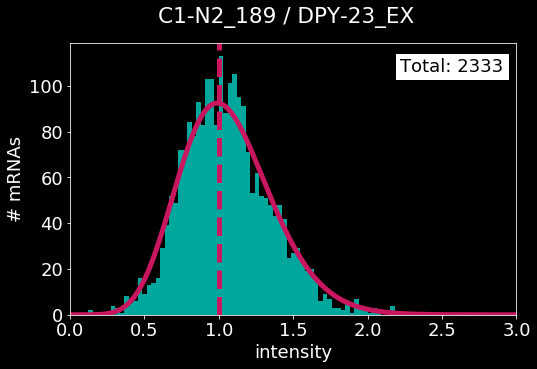

error: L1, L2 [3.80145468180642, 7.957028669220153]
peak center: 1.0303030303030303


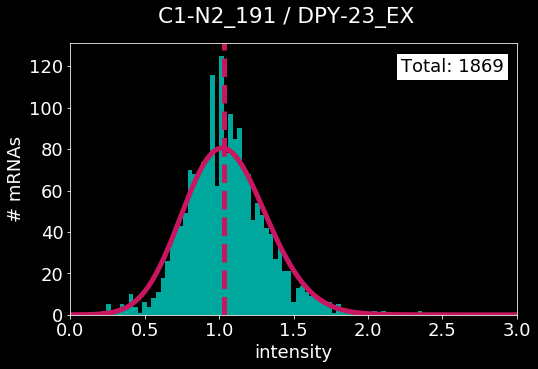

error: L1, L2 [2.163624897498913, 3.9218142815920842]
peak center: 1.0606060606060606


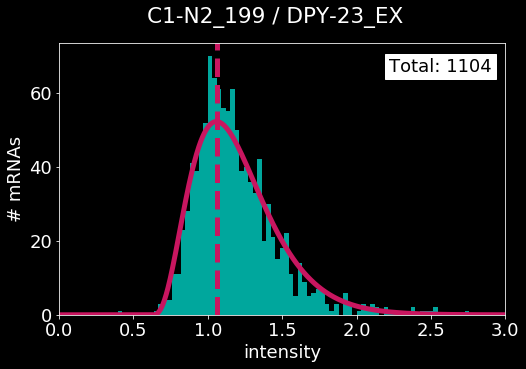

error: L1, L2 [3.734916058999226, 7.726166986991387]
peak center: 1.0


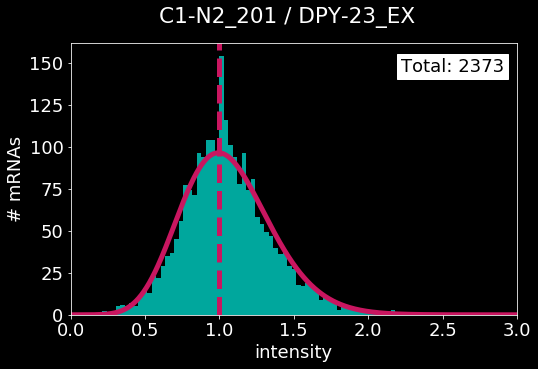

error: L1, L2 [3.112705422531022, 5.808068369521962]
peak center: 1.0


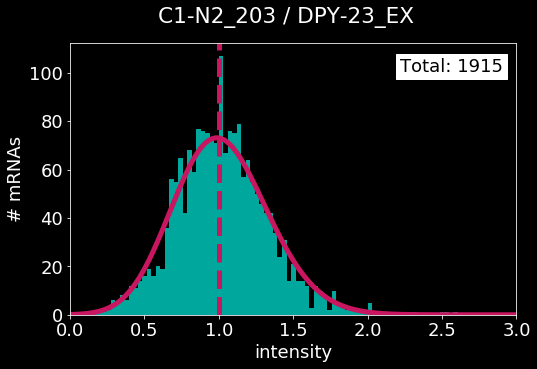

error: L1, L2 [2.9253800547815985, 6.232813078706954]
peak center: 1.0


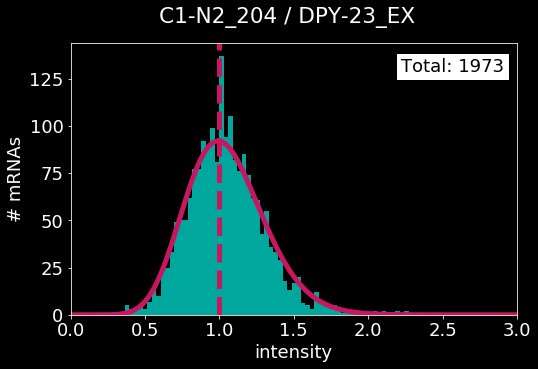

error: L1, L2 [2.878356854465904, 6.077877347227867]
peak center: 1.0


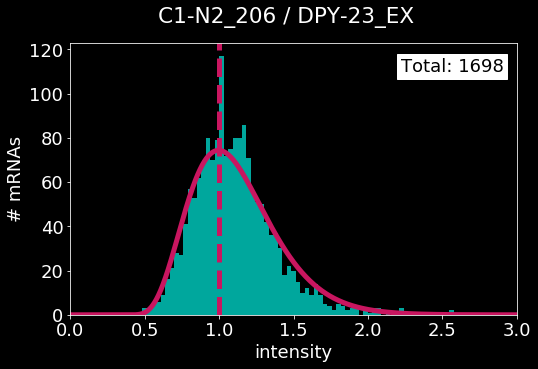

error: L1, L2 [3.012105201184601, 5.695382238691971]
peak center: 1.0


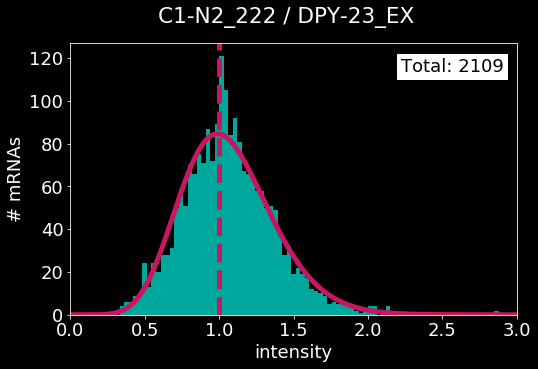

error: L1, L2 [3.6403139914282527, 7.23516189097077]
peak center: 0.9696969696969697


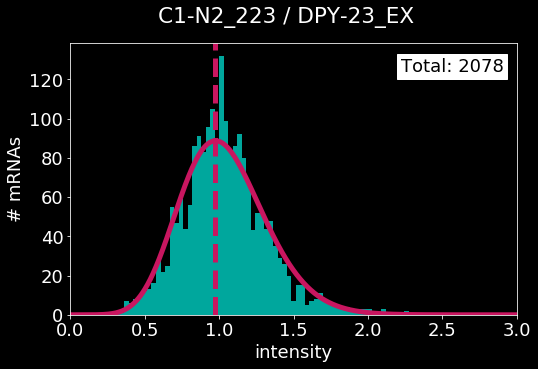

error: L1, L2 [3.0586696110647393, 5.579579533662194]
peak center: 0.9696969696969697


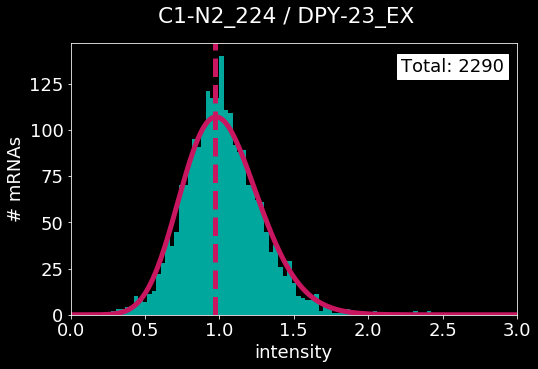

error: L1, L2 [3.8934103986140927, 7.641966700769913]
peak center: 1.0


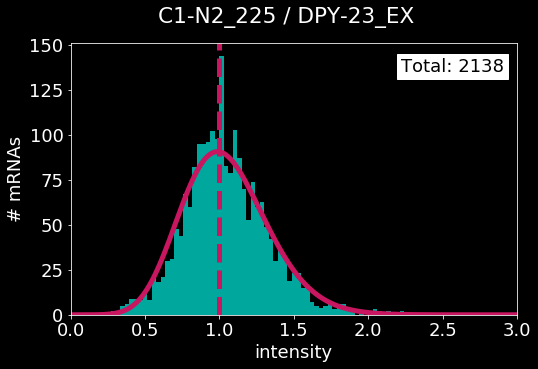

error: L1, L2 [2.5706015677318073, 4.485963086593424]
peak center: 0.9696969696969697


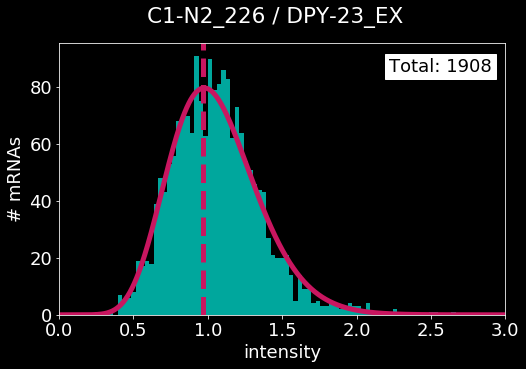

error: L1, L2 [3.1971104637728995, 5.872206642385518]
peak center: 1.0


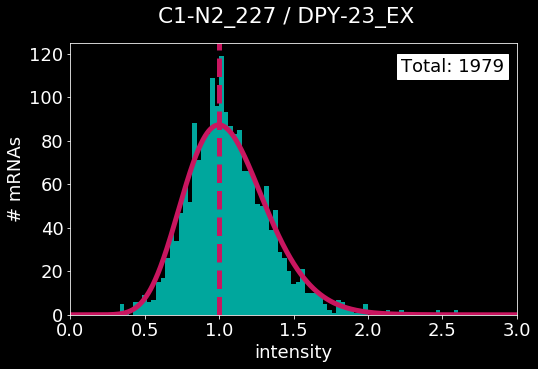

error: L1, L2 [3.5501808051872317, 7.28168340302633]
peak center: 1.0


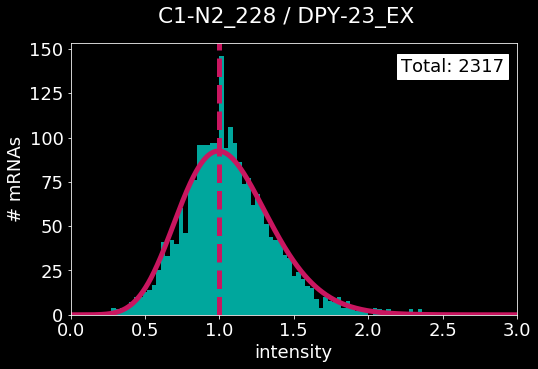

error: L1, L2 [3.5985019099234856, 7.871235866675618]
peak center: 1.0


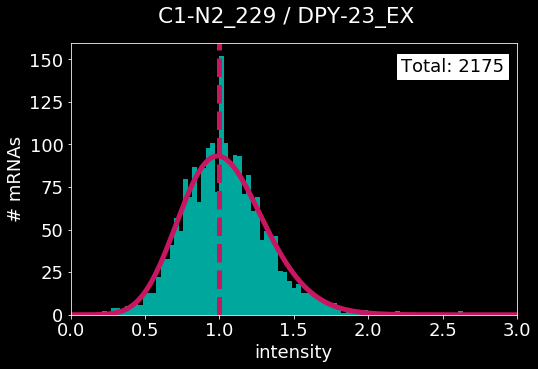

error: L1, L2 [2.931191703408095, 5.710946238223724]
peak center: 1.0


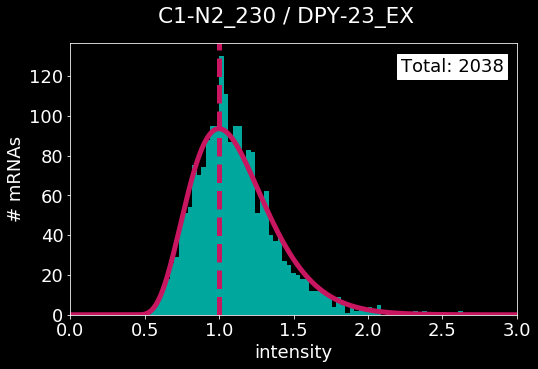

error: L1, L2 [3.431812473468434, 6.3239115841352325]
peak center: 1.0


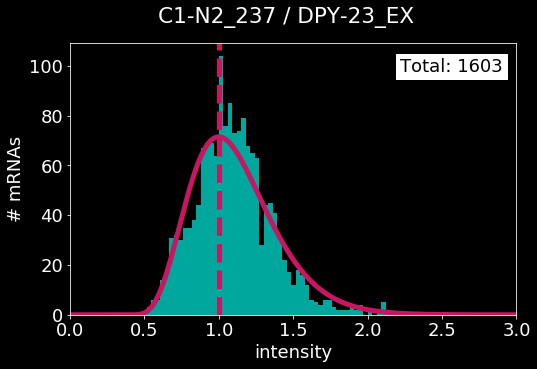

error: L1, L2 [3.0731853409423855, 4.8638234479686036]
peak center: 0.9696969696969697


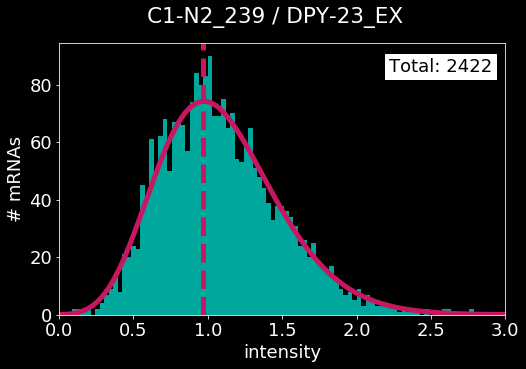

error: L1, L2 [2.9610606460443454, 4.810013431734398]
peak center: 1.0303030303030303


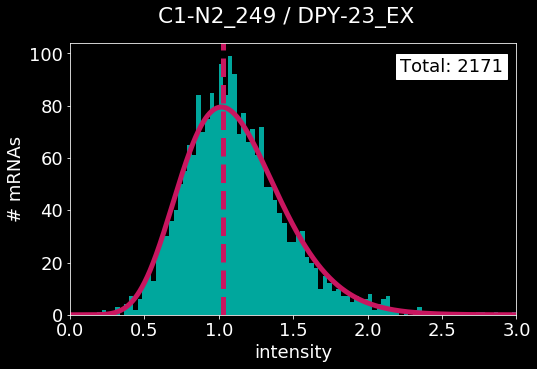

error: L1, L2 [3.5411084148272183, 6.199592211946887]
peak center: 1.0


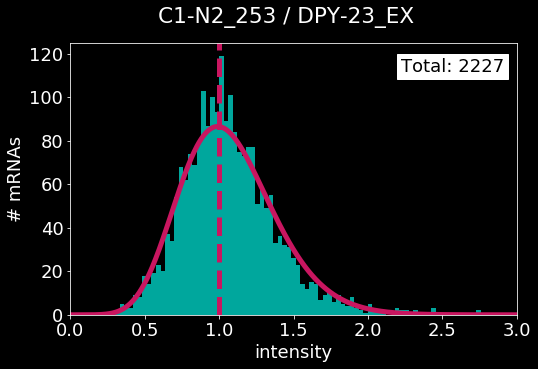

error: L1, L2 [0.09607943261234841, 0.37734193195899624]
peak center: 1.1212121212121213


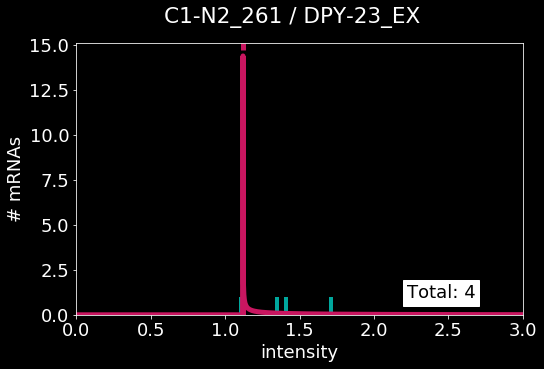

error: L1, L2 [2.9432286345181886, 5.571026405821561]
peak center: 1.0303030303030303


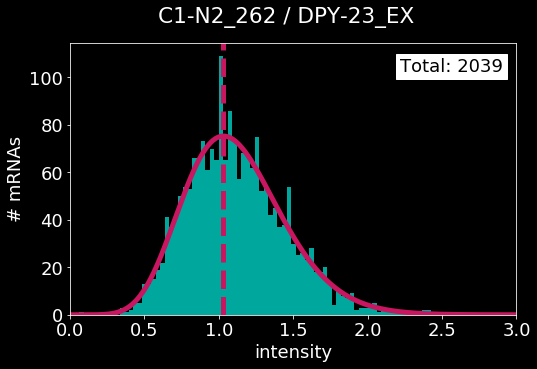

error: L1, L2 [3.0635109409453642, 6.177530986404013]
peak center: 1.0


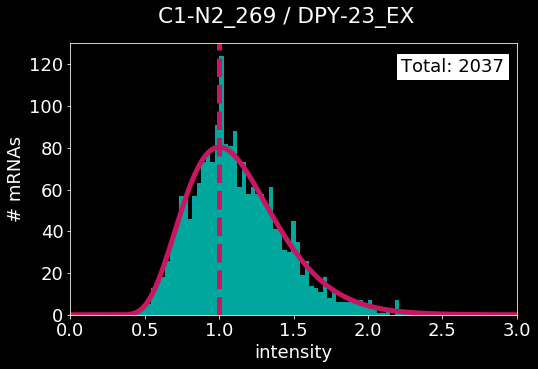

error: L1, L2 [3.0310925195317147, 4.546645672327314]
peak center: 1.0


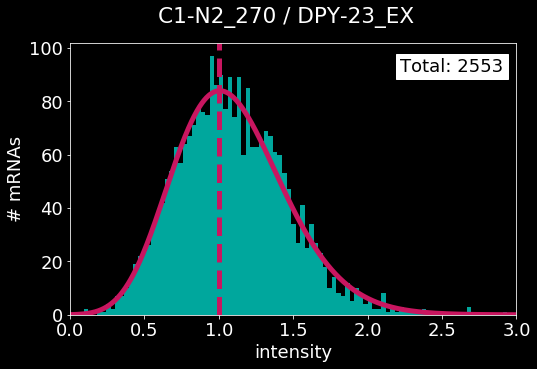

error: L1, L2 [3.9163956037912095, 7.9609062182590336]
peak center: 1.0303030303030303


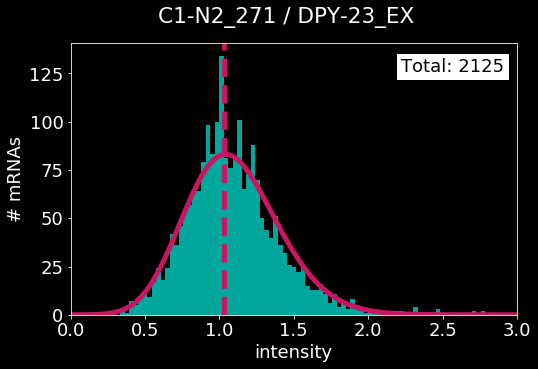

error: L1, L2 [3.4471018447736044, 5.623465922611422]
peak center: 1.0


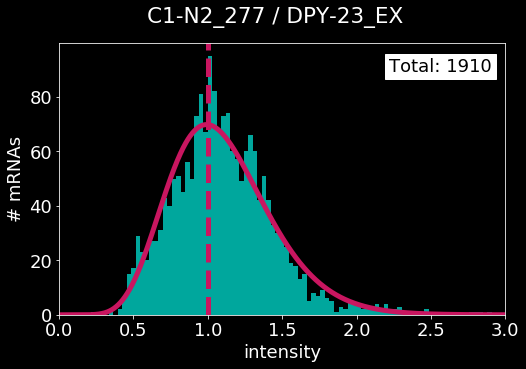

error: L1, L2 [2.703601457608123, 5.1241702225958505]
peak center: 1.0303030303030303


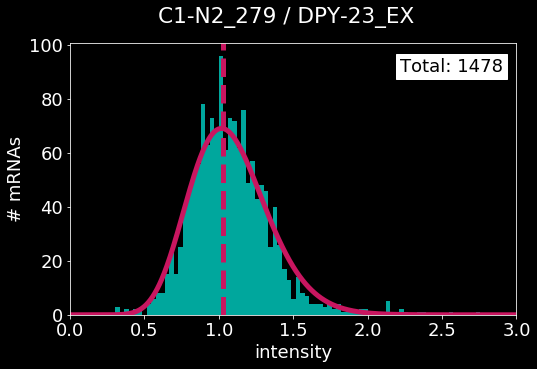

error: L1, L2 [2.861651660440063, 4.932921203844592]
peak center: 0.9696969696969697


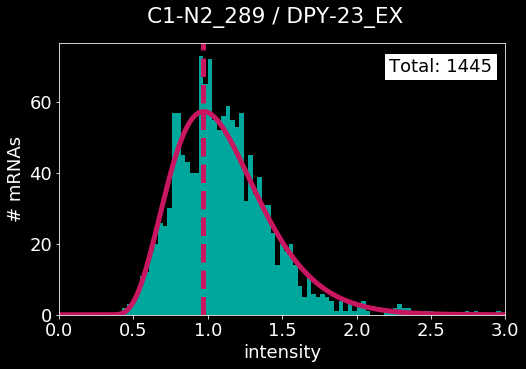

error: L1, L2 [3.308876206008762, 6.178513323885516]
peak center: 1.0303030303030303


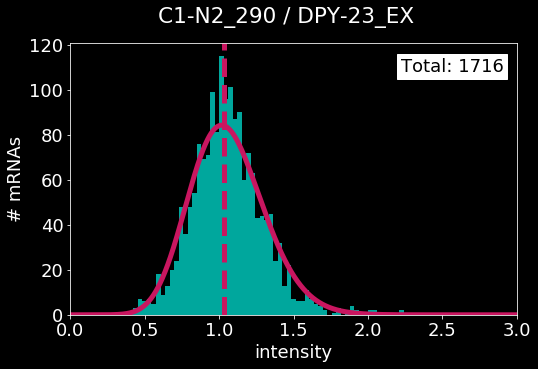

error: L1, L2 [2.911223203900141, 5.105160228482258]
peak center: 1.0606060606060606


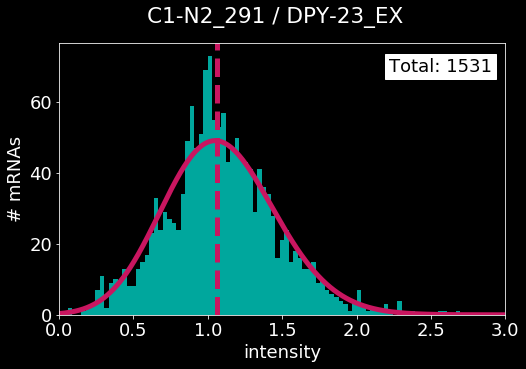

error: L1, L2 [3.1538988632039704, 4.955854696340091]
peak center: 1.0606060606060606


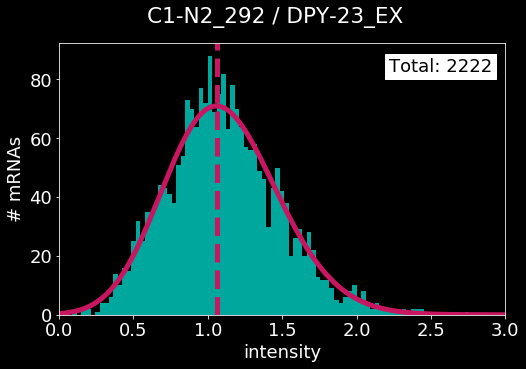

error: L1, L2 [3.4648687646125027, 7.601837368603912]
peak center: 1.0


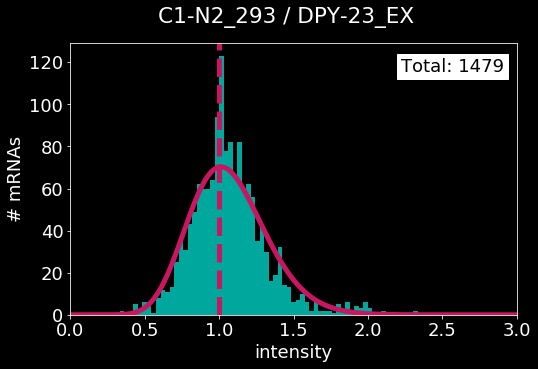

error: L1, L2 [4.5228693847738475, 9.37907001499789]
peak center: 1.0


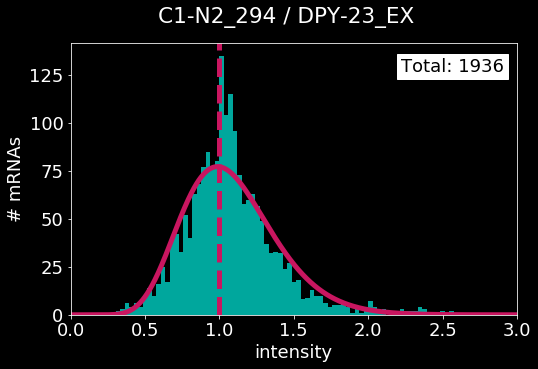

error: L1, L2 [1.5752032481872602, 2.9715625272857182]
peak center: 0.9696969696969697


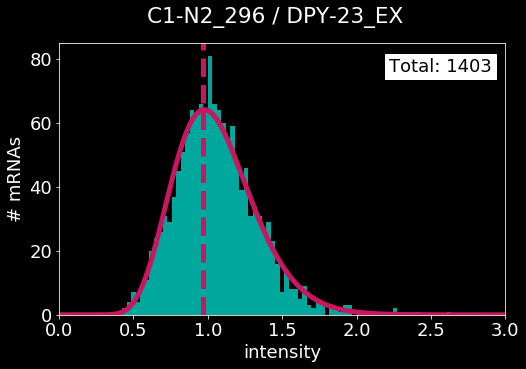

error: L1, L2 [3.33794870827211, 6.796244978729766]
peak center: 1.0303030303030303


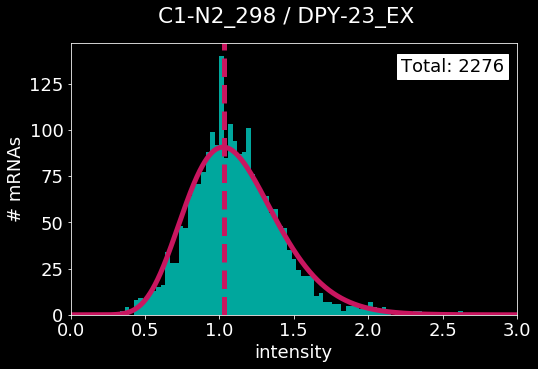

error: L1, L2 [51.99565726855336, 294.20716940457976]
peak center: 0.30303030303030304


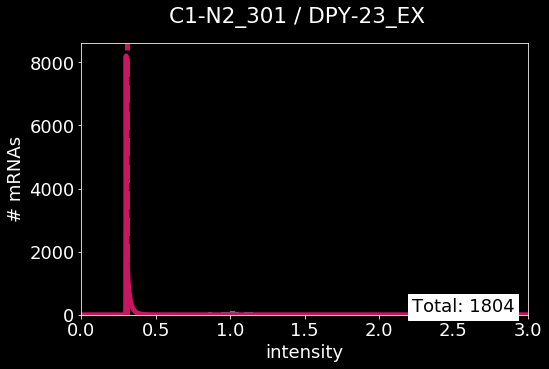

error: L1, L2 [4.550366074853059, 8.159822796202922]
peak center: 0.9696969696969697


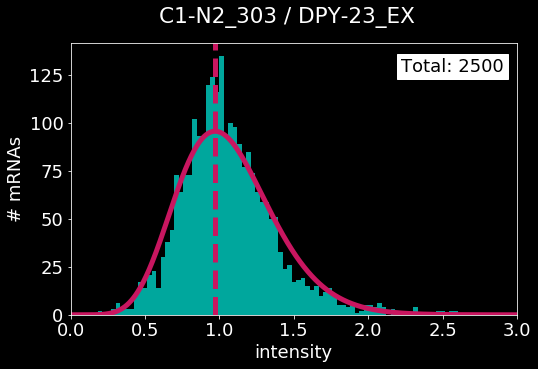

error: L1, L2 [2.7315790082701406, 4.419585281251507]
peak center: 1.0


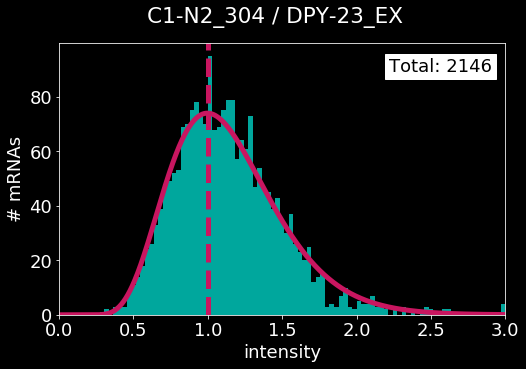

error: L1, L2 [3.501122384352494, 6.052867958250974]
peak center: 0.9696969696969697


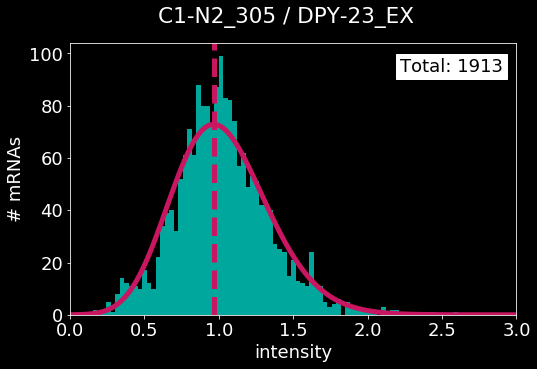

error: L1, L2 [2.644359899320279, 4.679954924089218]
peak center: 1.0303030303030303


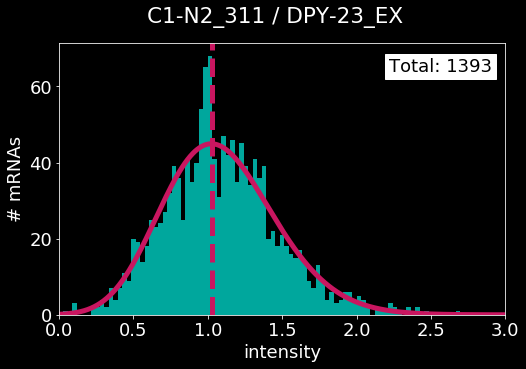

error: L1, L2 [3.2171620923470567, 6.149657844119415]
peak center: 0.9696969696969697


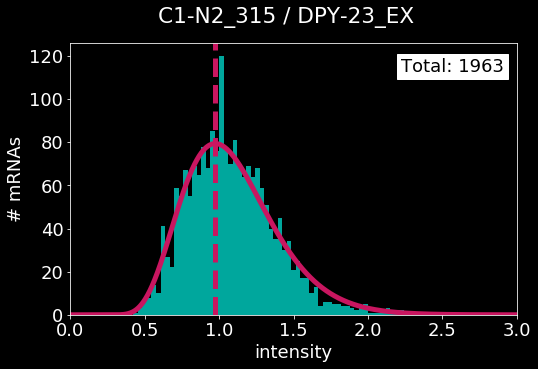

error: L1, L2 [2.7814418869704003, 4.551071795310996]
peak center: 1.0303030303030303


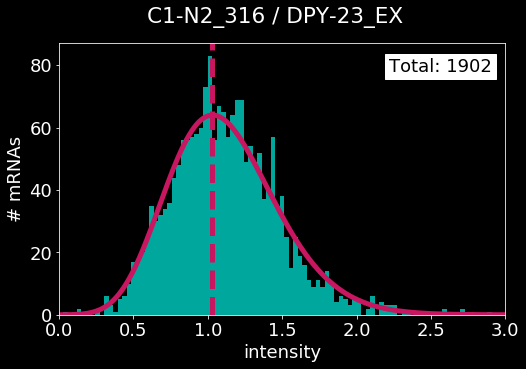

error: L1, L2 [2.7417449470889164, 4.42969811045072]
peak center: 1.0303030303030303


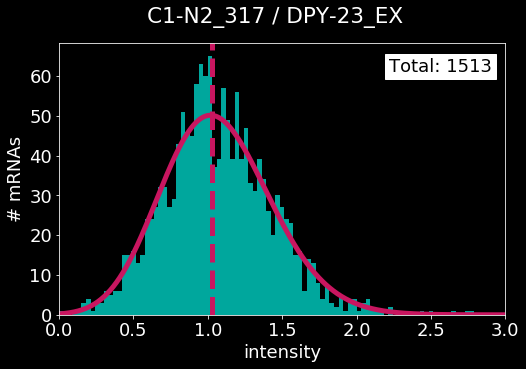

error: L1, L2 [2.7083453780402347, 4.957150800814092]
peak center: 1.0


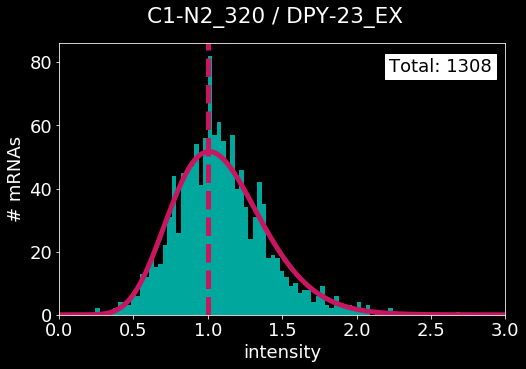

error: L1, L2 [3.6516287781635075, 6.485083559283387]
peak center: 1.0


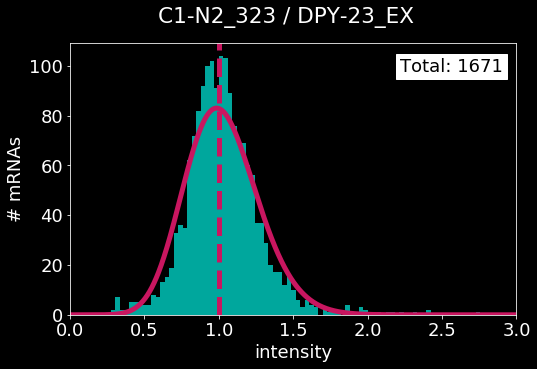

error: L1, L2 [3.041900165930546, 5.399705016550397]
peak center: 1.0


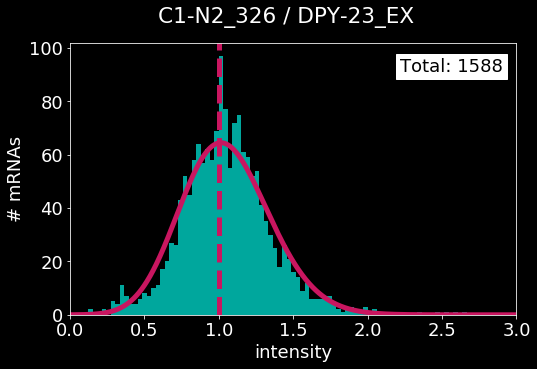

error: L1, L2 [4.250217762582975, 8.638693182007968]
peak center: 0.9696969696969697


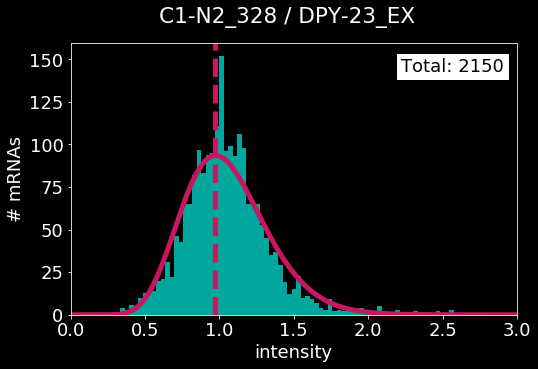

error: L1, L2 [3.504750294783726, 6.395670833892894]
peak center: 1.0303030303030303


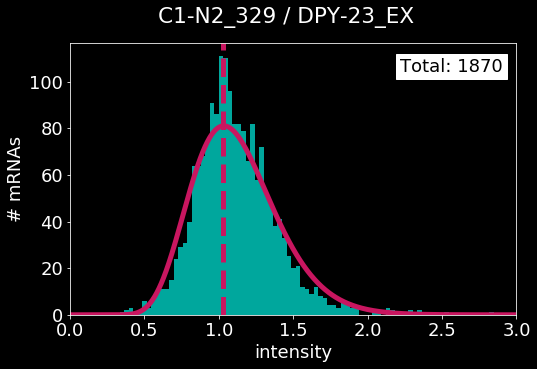

error: L1, L2 [5.328767387555073, 9.209548942594173]
peak center: 1.0


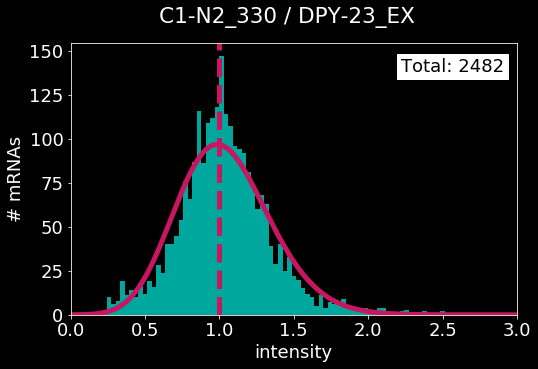

error: L1, L2 [4.017599608860109, 6.870522962866652]
peak center: 1.0


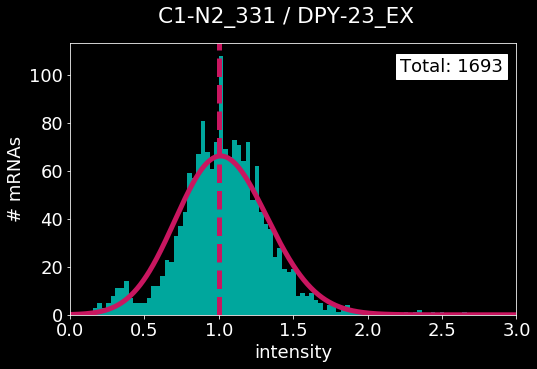

error: L1, L2 [4.00578412837055, 7.32904110233348]
peak center: 1.0


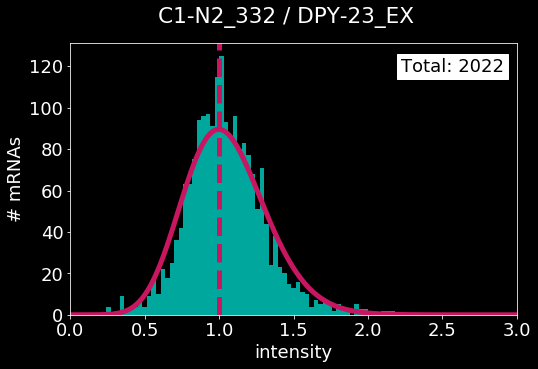

error: L1, L2 [2.804374485358764, 5.229710438718608]
peak center: 1.0


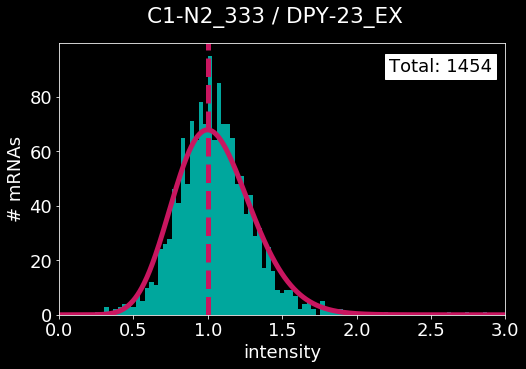

error: L1, L2 [2.5043703277212197, 4.226067220416285]
peak center: 0.9696969696969697


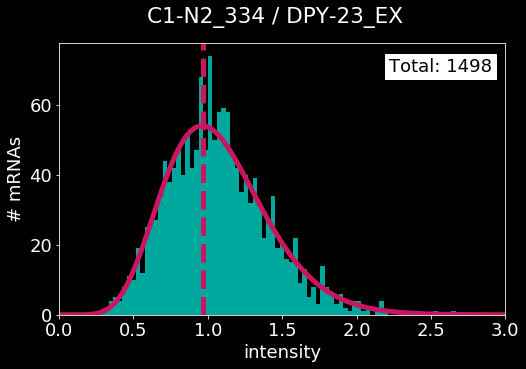

error: L1, L2 [3.8210845163392677, 6.8747595552775085]
peak center: 1.0303030303030303


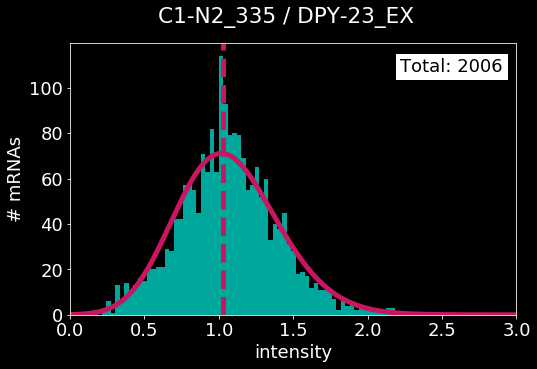

error: L1, L2 [3.2945977001761175, 6.366887072124342]
peak center: 1.0


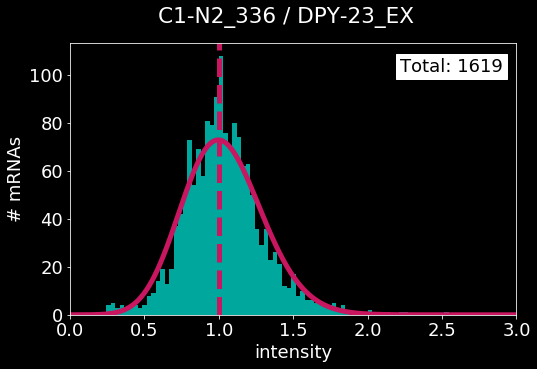

error: L1, L2 [5.496576732410992, 8.293664122675288]
peak center: 1.0


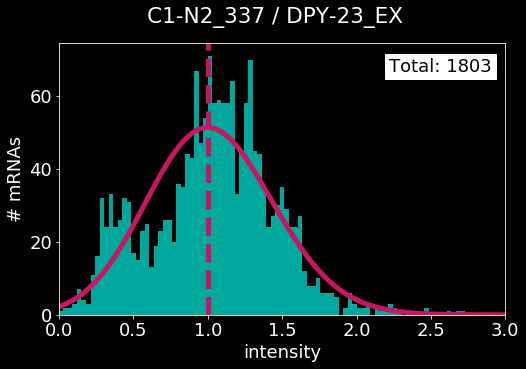

error: L1, L2 [3.007723277749031, 4.524121436629655]
peak center: 1.0606060606060606


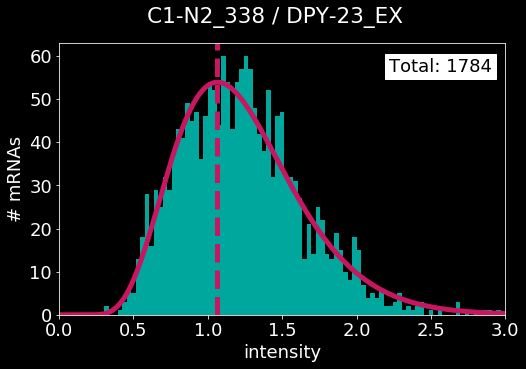

error: L1, L2 [5.72221057209559, 9.6763846435009]
peak center: 1.0


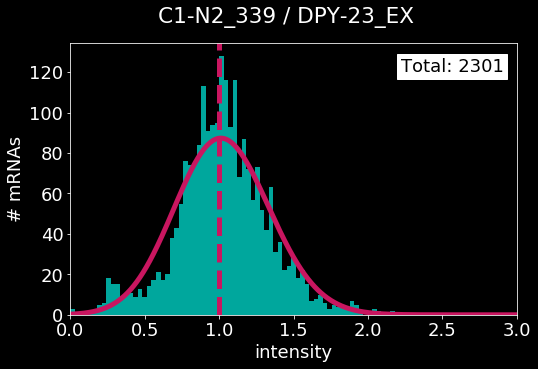

error: L1, L2 [2.7648795708204705, 4.996604872043001]
peak center: 1.0


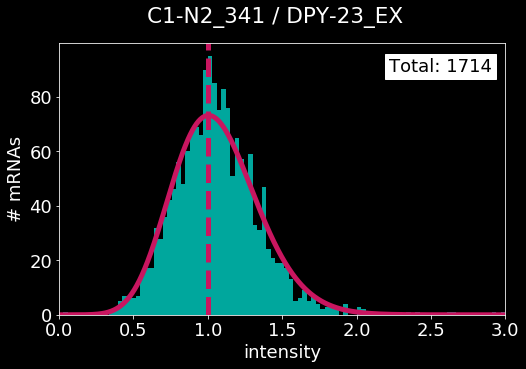

error: L1, L2 [1.893260676586408, 3.033785922599764]
peak center: 1.0303030303030303


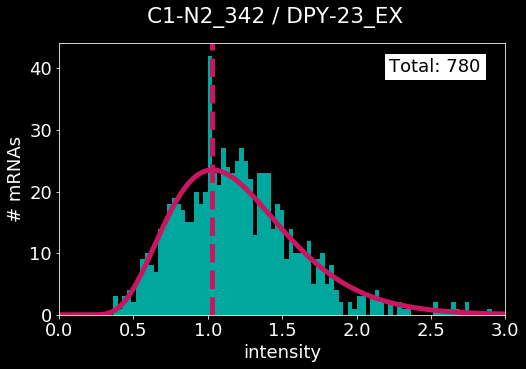

error: L1, L2 [3.4389396791511744, 5.610298461774514]
peak center: 1.0


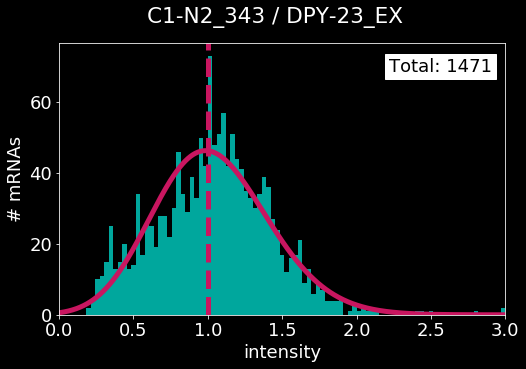

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in long_scalars
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/optimize/optimize.py:569: RuntimeWarning: invalid value encountered in subtract
  if (numpy.max(numpy.ravel(numpy.abs(sim[1:] - sim[0]))) <= xatol and
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/optimize/optimize.py:574: RuntimeWarning: invalid value encountered in subtract
  xr = (1 + rho) * xbar - rho * sim[-1]
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:874: RuntimeWarning: invalid value encountered in greater_equal
  return (self.a <= x) & (x <=

error: L1, L2 [0.0, 0.0]
peak center: 0.0


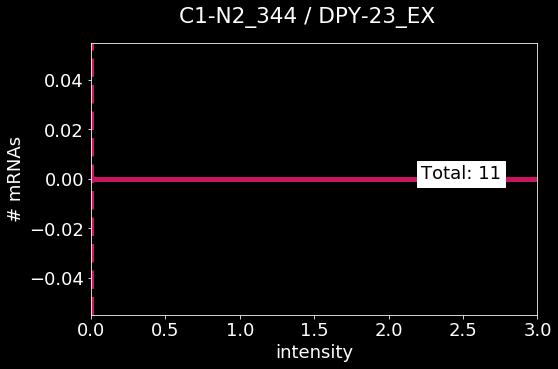

error: L1, L2 [2.4041476763471583, 3.964153526880988]
peak center: 0.9696969696969697


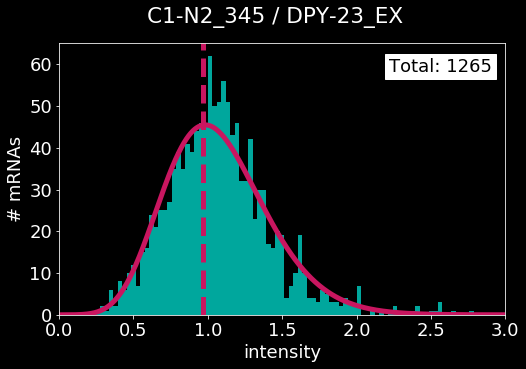

error: L1, L2 [2.749676292881233, 3.882229529003359]
peak center: 0.9696969696969697


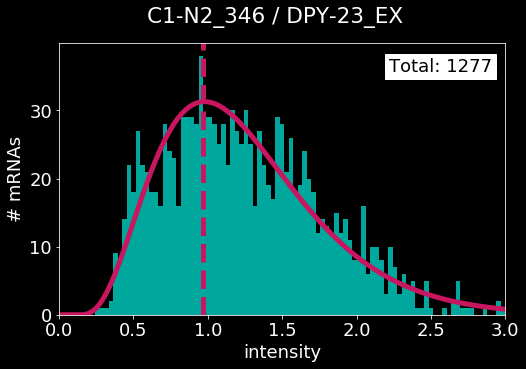

error: L1, L2 [2.1374277814657914, 3.810753896061527]
peak center: 1.0


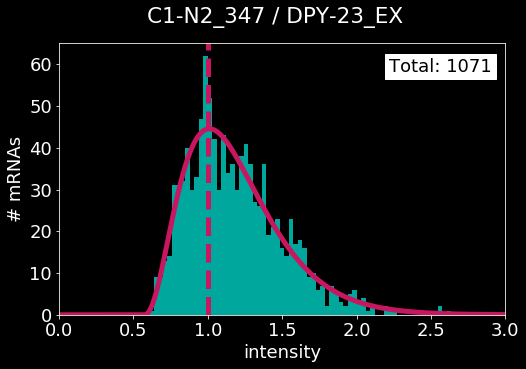

error: L1, L2 [2.5281352417372593, 4.813873891994178]
peak center: 0.9696969696969697


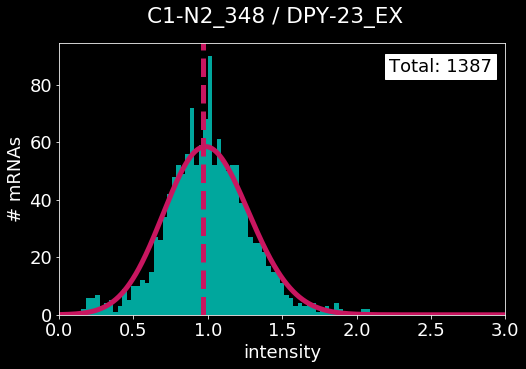

error: L1, L2 [3.3910272119748015, 4.975607295552749]
peak center: 0.9696969696969697


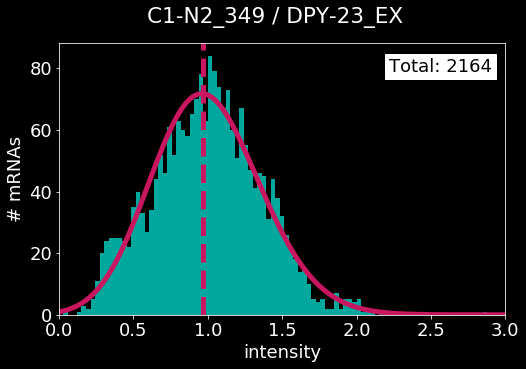

error: L1, L2 [2.6219832433011474, 3.700982293207406]
peak center: 1.0606060606060606


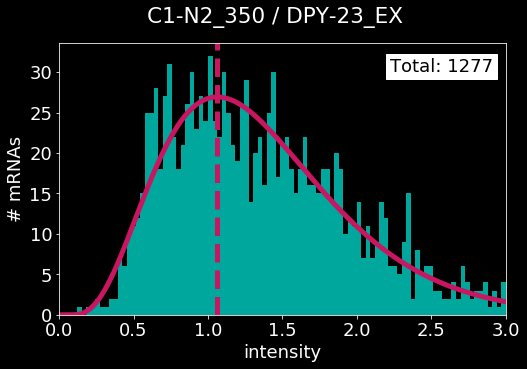

error: L1, L2 [1.7467996835057147, 3.1003306576863676]
peak center: 1.0


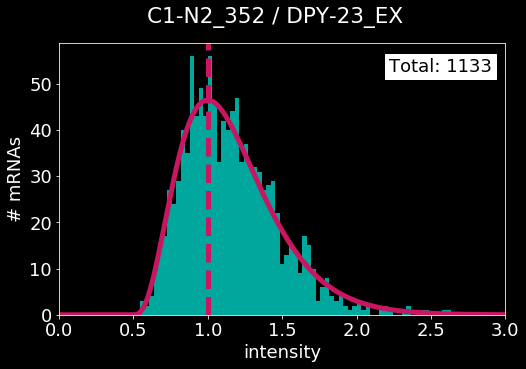

error: L1, L2 [2.7295726541036256, 4.11042713946505]
peak center: 0.9393939393939394


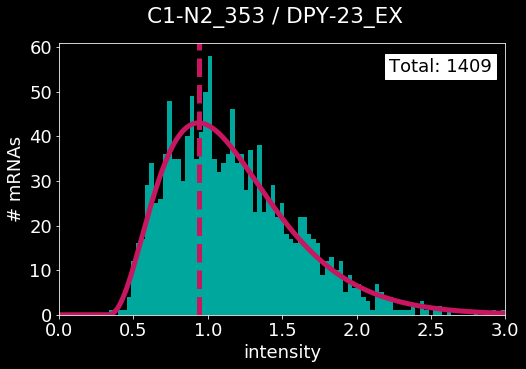

error: L1, L2 [22.591757836204934, 60.63890378476822]
peak center: 0.42424242424242425


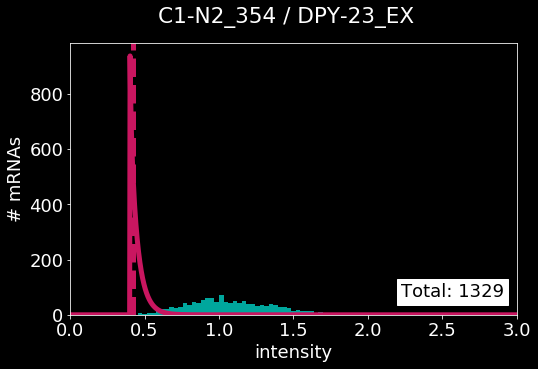

error: L1, L2 [2.60758853158857, 4.437397837518261]
peak center: 1.0


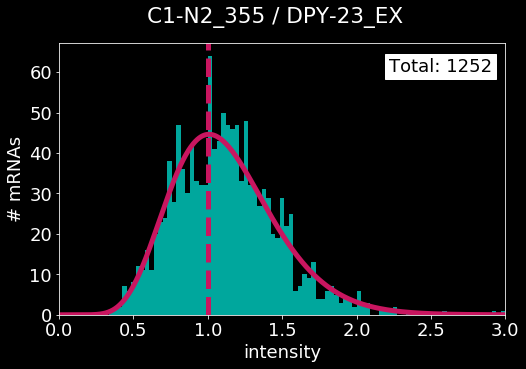

error: L1, L2 [2.8316805196088395, 4.46303918091198]
peak center: 1.0


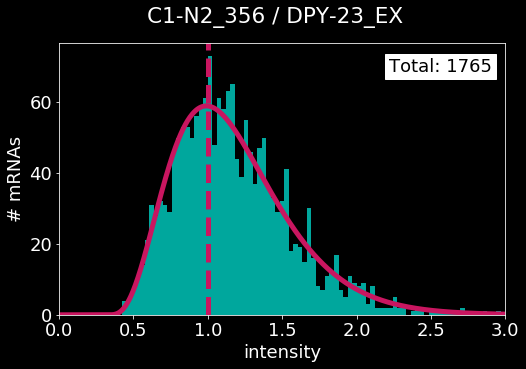

error: L1, L2 [2.3283086944684985, 4.691423951407072]
peak center: 1.0


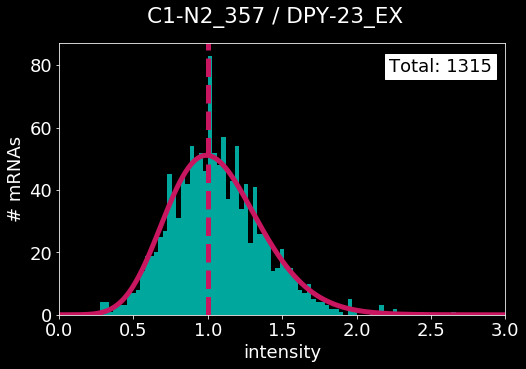

error: L1, L2 [3.647555320062017, 5.58269724727578]
peak center: 1.0


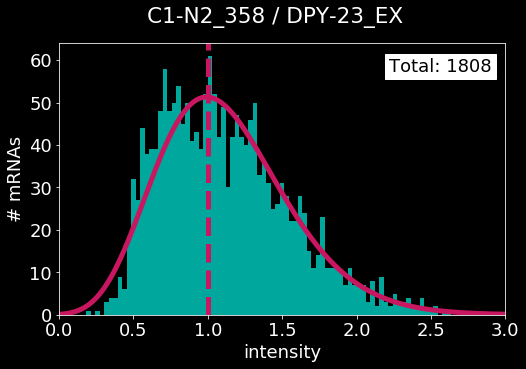

error: L1, L2 [2.7068179008974607, 4.043564795761109]
peak center: 0.9696969696969697


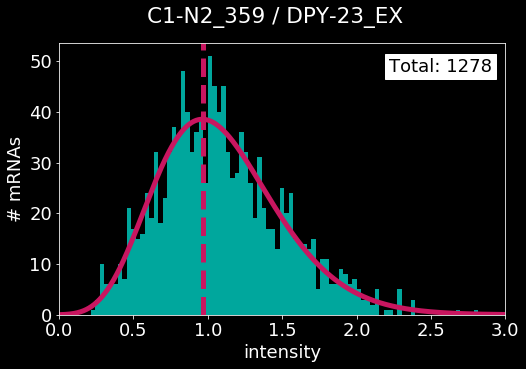

error: L1, L2 [2.190135863837444, 3.539826645658272]
peak center: 1.0303030303030303


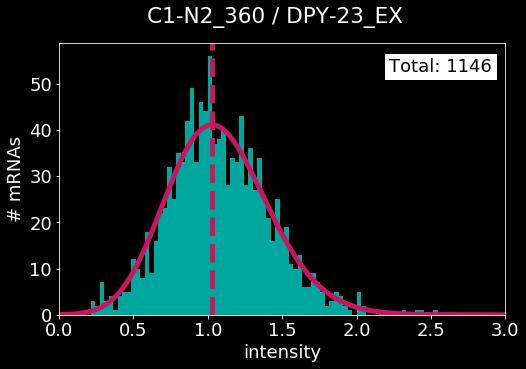

error: L1, L2 [3.3554900266674004, 5.57350313090243]
peak center: 0.9696969696969697


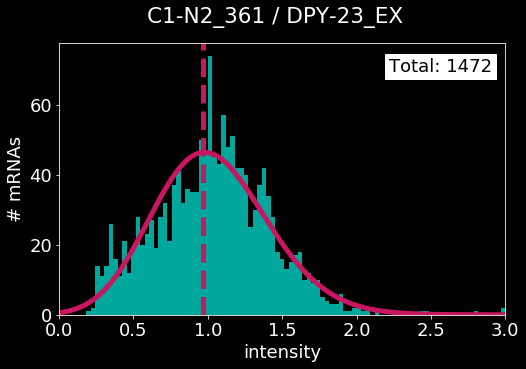

error: L1, L2 [0.04940805500469157, 0.18448859282043908]
peak center: 2.5454545454545454


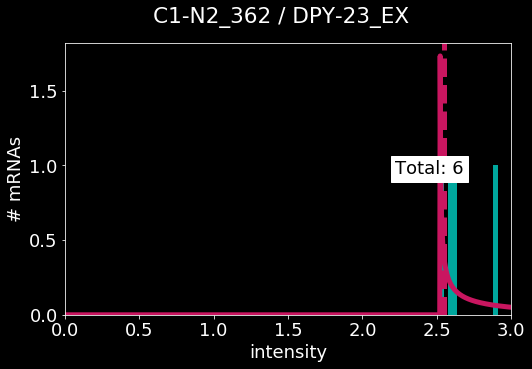

error: L1, L2 [2.8115010109001117, 4.716480985487056]
peak center: 1.7878787878787878


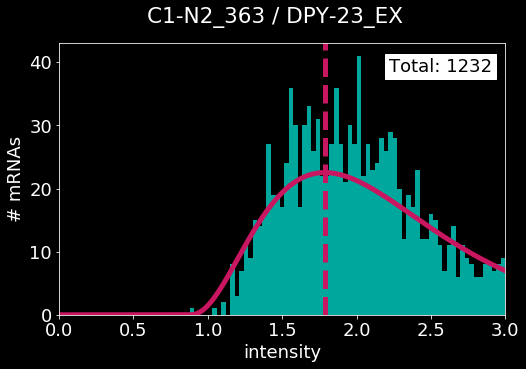

error: L1, L2 [5.4444618725492, 8.248396690085613]
peak center: 1.0303030303030303


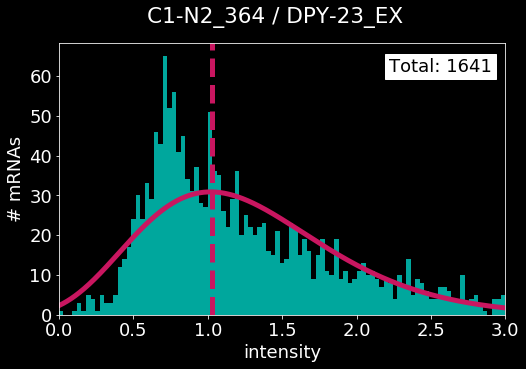

error: L1, L2 [3.158606694385988, 4.457950021367813]
peak center: 1.0303030303030303


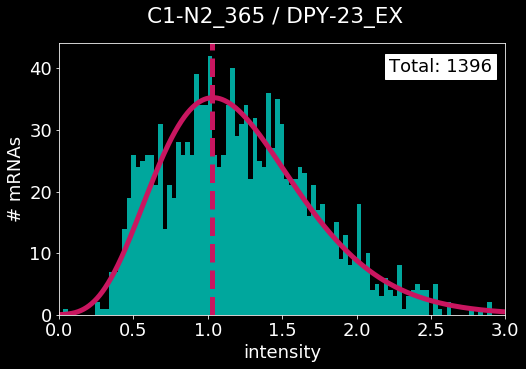

error: L1, L2 [9.645084940081071, 13.078421194728417]
peak center: 1.0


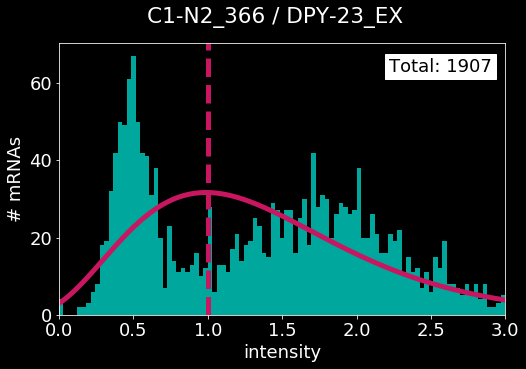

error: L1, L2 [4.468339866139727, 6.406940495875222]
peak center: 1.0909090909090908


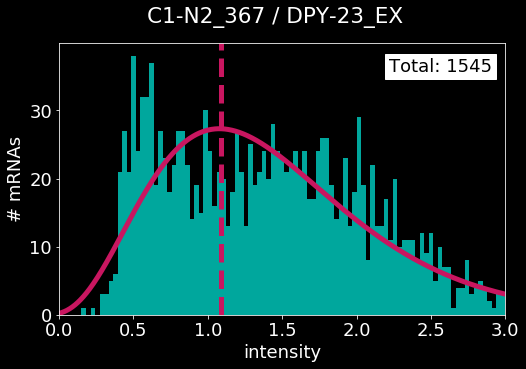

error: L1, L2 [4.636692204951254, 7.444179383353325]
peak center: 1.0303030303030303


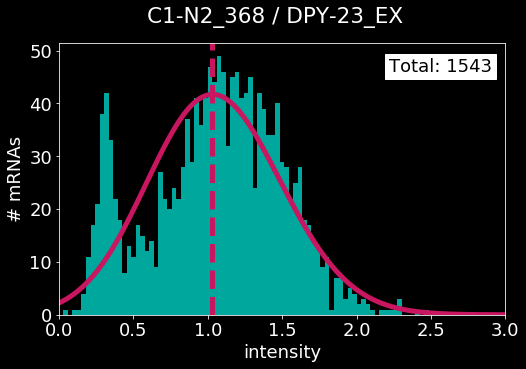

error: L1, L2 [4.3484830632470635, 5.877700877738974]
peak center: 1.0303030303030303


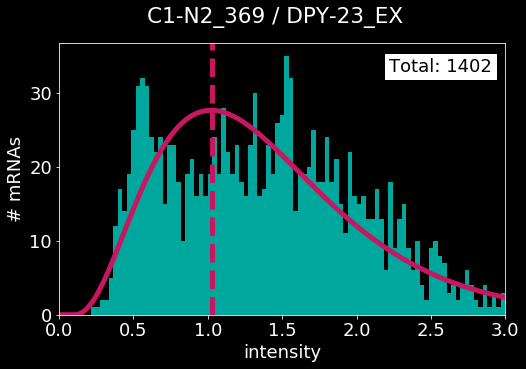

error: L1, L2 [2.6814010601264733, 4.696024761173742]
peak center: 1.0


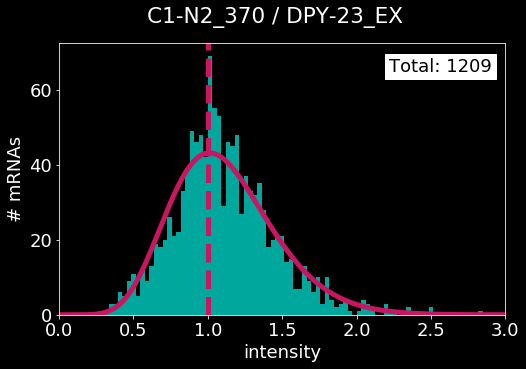

error: L1, L2 [2.4232706758898392, 4.035305416260215]
peak center: 0.9696969696969697


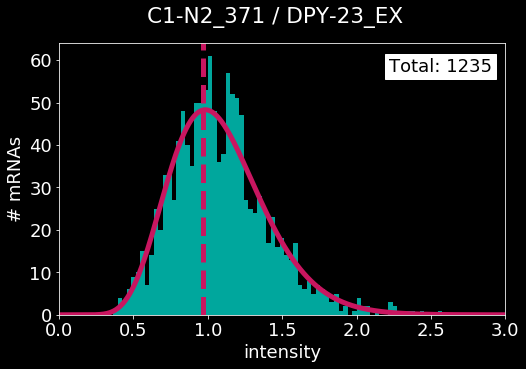

error: L1, L2 [2.372760522824544, 3.9411556003928108]
peak center: 0.9696969696969697


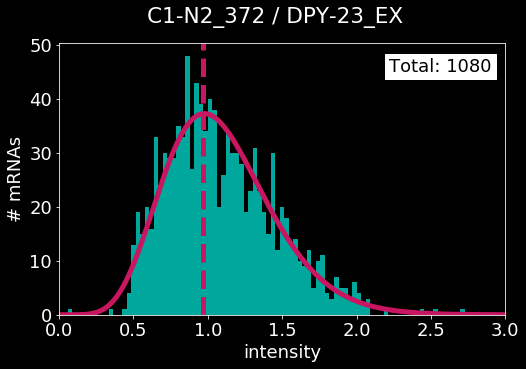

error: L1, L2 [2.4193785551743106, 4.240802948691039]
peak center: 0.9696969696969697


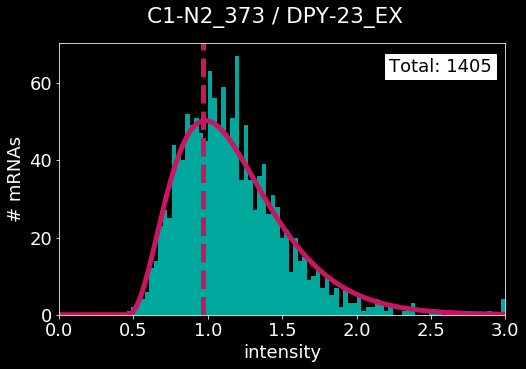

error: L1, L2 [2.0452049641014383, 3.7087042451553898]
peak center: 0.9696969696969697


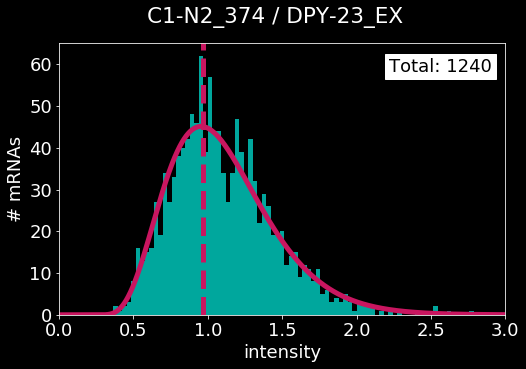

error: L1, L2 [2.484219738111391, 4.157049661851882]
peak center: 0.9696969696969697


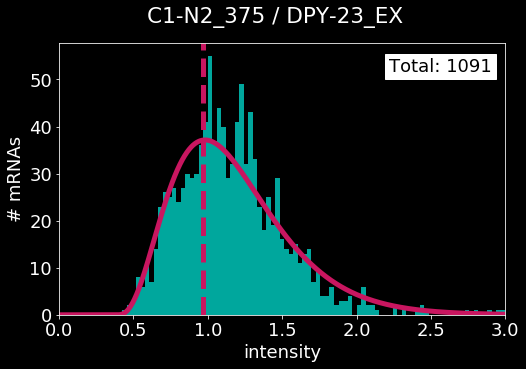

error: L1, L2 [5.112170922255649, 7.956236917878764]
peak center: 0.9090909090909092


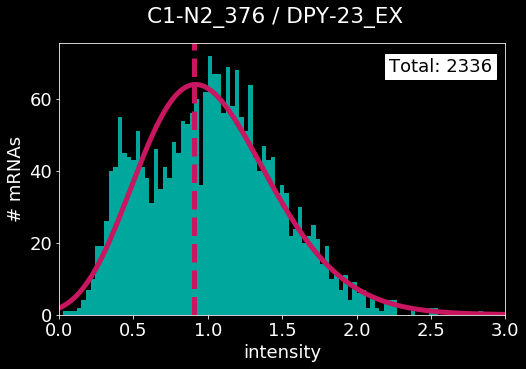

error: L1, L2 [2.8927251968975822, 4.611049776167794]
peak center: 1.0303030303030303


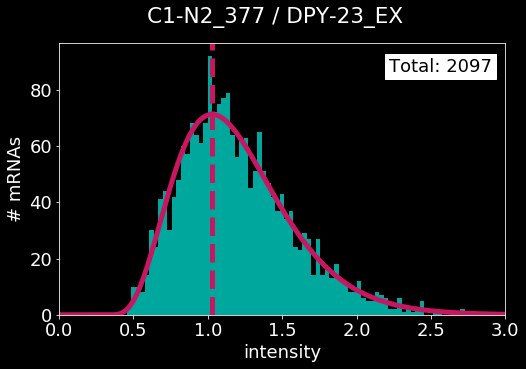

error: L1, L2 [4.826462544845773, 7.15545555551482]
peak center: 1.0606060606060606


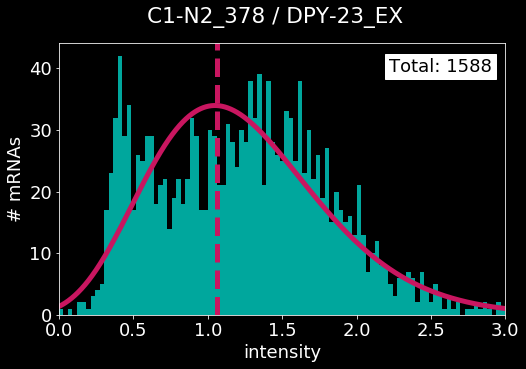

error: L1, L2 [1.9972716495111202, 4.1132249992839505]
peak center: 1.0


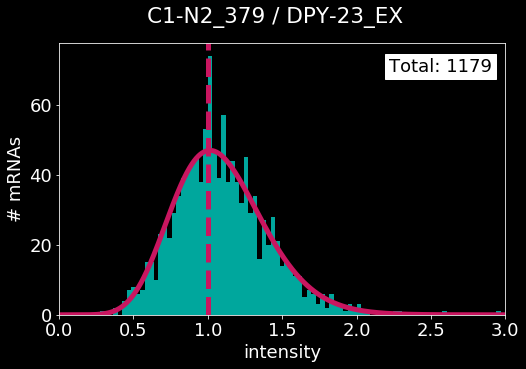

error: L1, L2 [2.181598799153949, 3.856196970282128]
peak center: 1.0


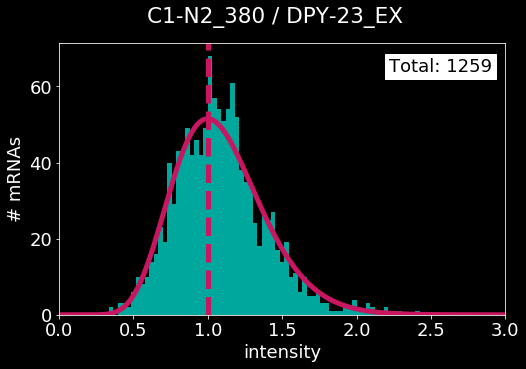

error: L1, L2 [1.9118330492454338, 3.289105830864974]
peak center: 1.0


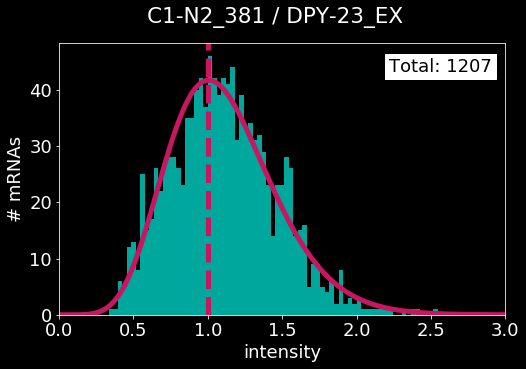

error: L1, L2 [2.126651698658575, 3.3614931782206012]
peak center: 1.0


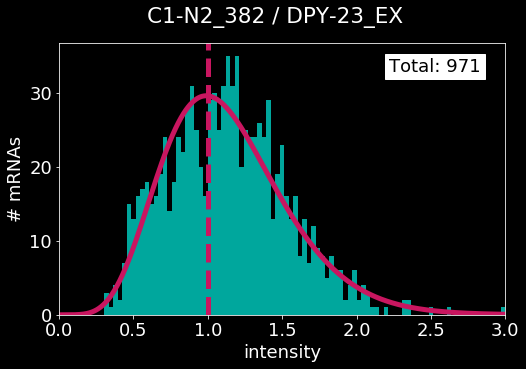

error: L1, L2 [3.023381773430368, 4.307162993605281]
peak center: 1.0


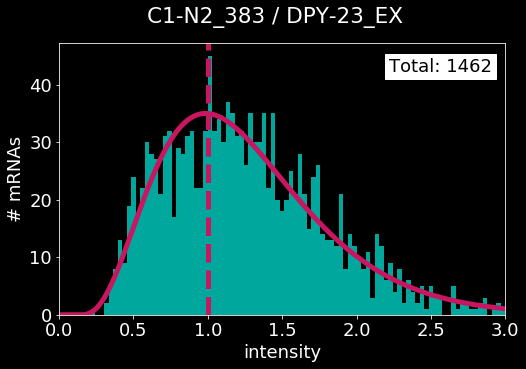

error: L1, L2 [2.4428246543368664, 3.977743300906024]
peak center: 1.0


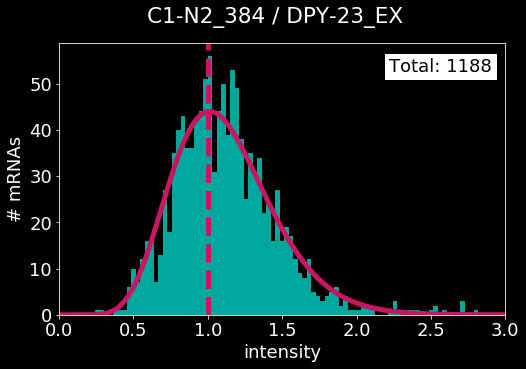

error: L1, L2 [2.9081454802378657, 4.425798845406457]
peak center: 1.0


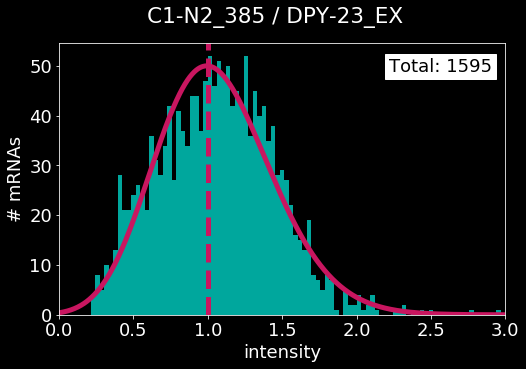

error: L1, L2 [3.2407023356858216, 4.488025081109408]
peak center: 1.0303030303030303


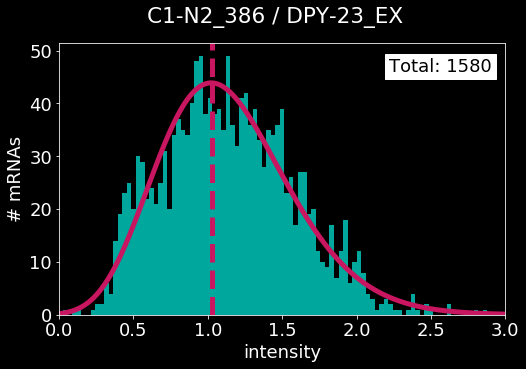

error: L1, L2 [2.3102322239988773, 4.058945968127439]
peak center: 1.0


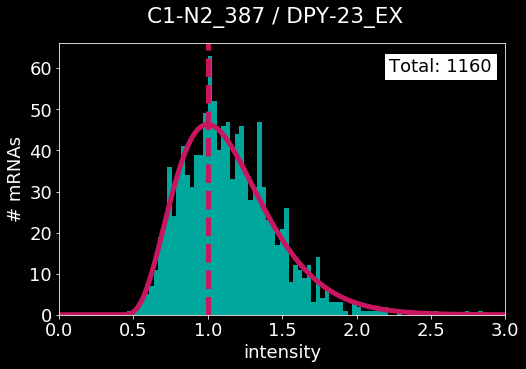

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in long_scalars
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/optimize/optimize.py:569: RuntimeWarning: invalid value encountered in subtract
  if (numpy.max(numpy.ravel(numpy.abs(sim[1:] - sim[0]))) <= xatol and
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/optimize/optimize.py:574: RuntimeWarning: invalid value encountered in subtract
  xr = (1 + rho) * xbar - rho * sim[-1]
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:874: RuntimeWarning: invalid value encountered in greater_equal
  return (self.a <= x) & (x <=

error: L1, L2 [2.605876791901064, 4.3486256048955525]
peak center: 1.0


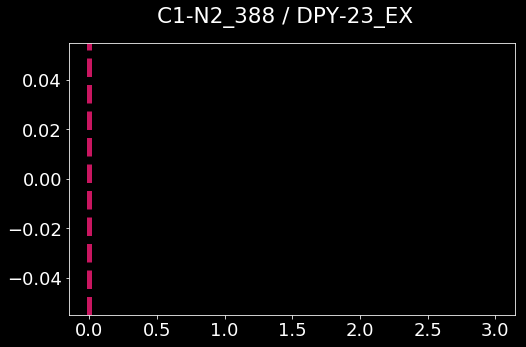

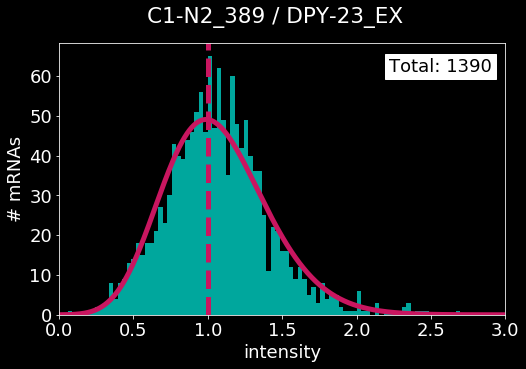

error: L1, L2 [3.1364644357853773, 4.173542471690034]
peak center: 1.0303030303030303


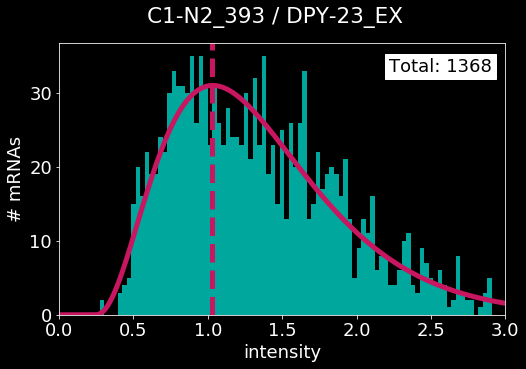

error: L1, L2 [2.956474606625983, 4.866472655228028]
peak center: 1.0303030303030303


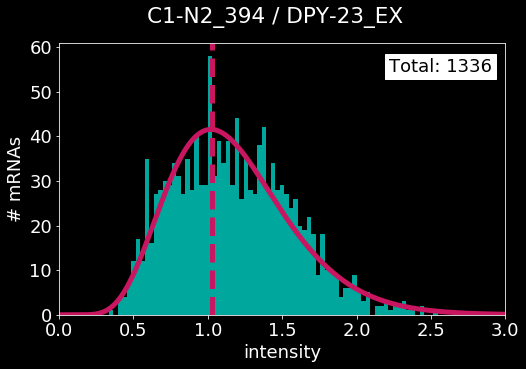

error: L1, L2 [3.48341800718735, 5.086100471929469]
peak center: 1.0606060606060606


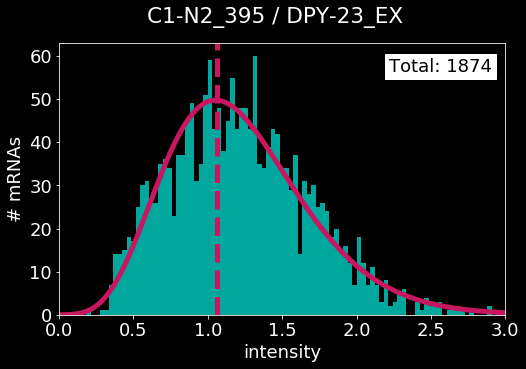

error: L1, L2 [3.214570296814078, 5.569568073101345]
peak center: 1.0303030303030303


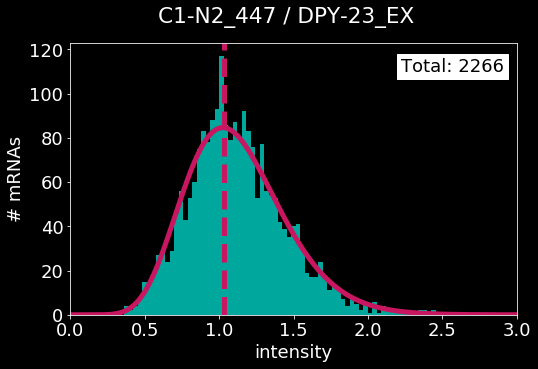

error: L1, L2 [4.661130199922368, 9.248172091699121]
peak center: 1.0


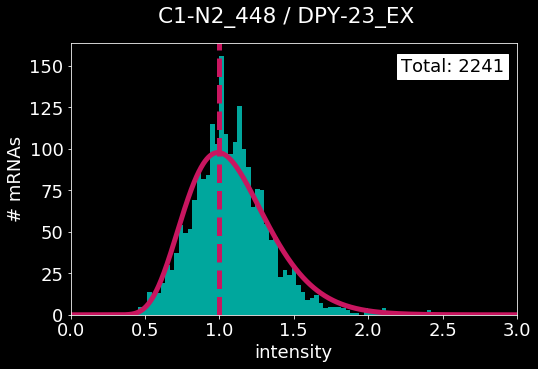

error: L1, L2 [3.0131101803800595, 5.0182438823880595]
peak center: 0.9696969696969697


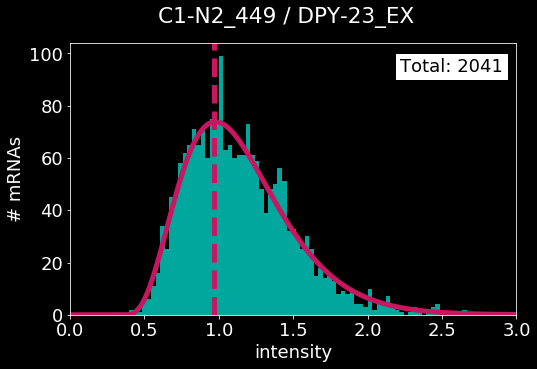

error: L1, L2 [8.194535058569281, 15.992168178421265]
peak center: 0.9393939393939394


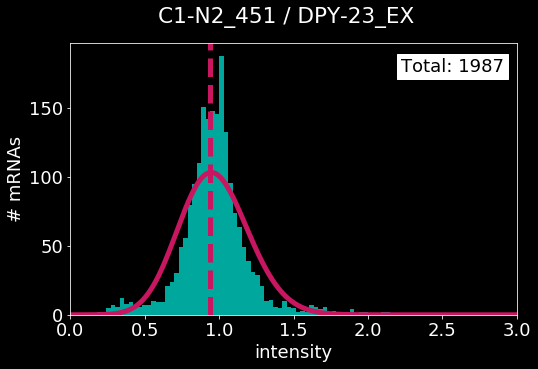

error: L1, L2 [3.126341960069647, 6.146039477819537]
peak center: 1.0


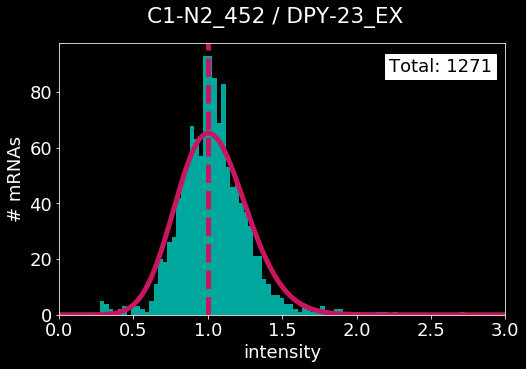

error: L1, L2 [3.4906771673433976, 6.284804970743986]
peak center: 0.9696969696969697


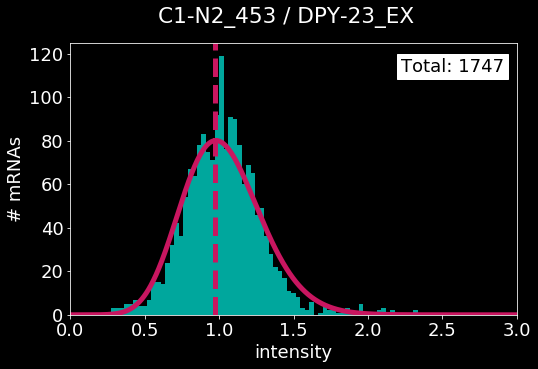

error: L1, L2 [4.3993533022317886, 9.044752582423387]
peak center: 0.9393939393939394


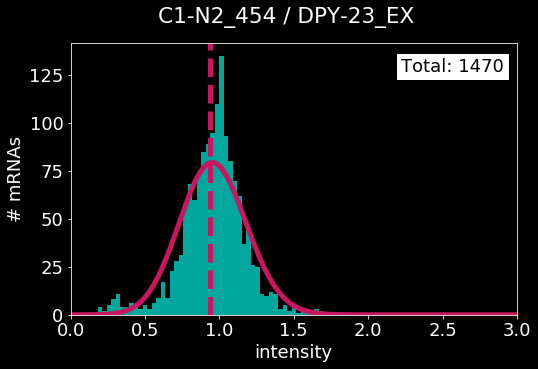

error: L1, L2 [2.23170996144917, 5.103624046596757]
peak center: 0.9696969696969697


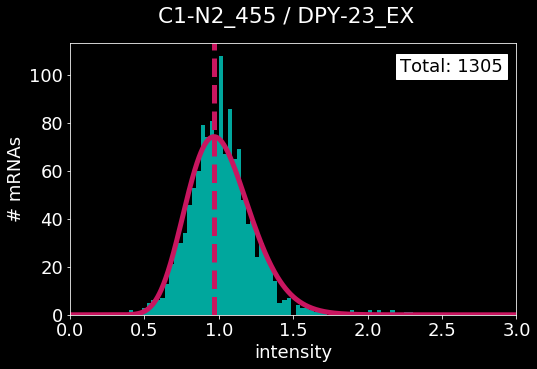

error: L1, L2 [2.544735575919735, 5.230777867800058]
peak center: 0.9696969696969697


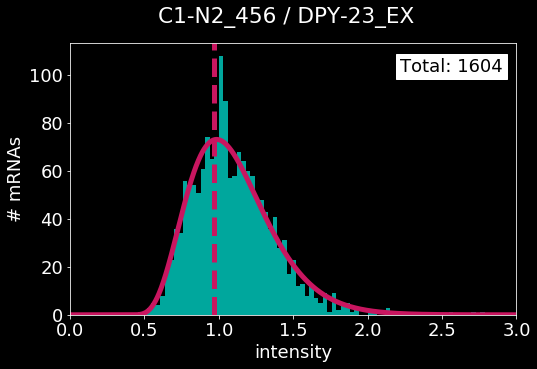

error: L1, L2 [3.154458768210591, 5.46660050288671]
peak center: 1.0303030303030303


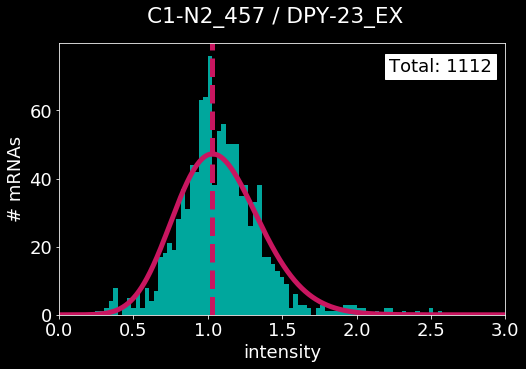

error: L1, L2 [3.057526462823465, 5.0592933133633835]
peak center: 1.0


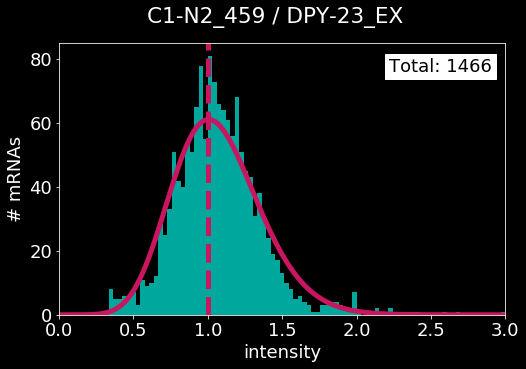

error: L1, L2 [7.376651937830262, 14.288161365132169]
peak center: 1.0


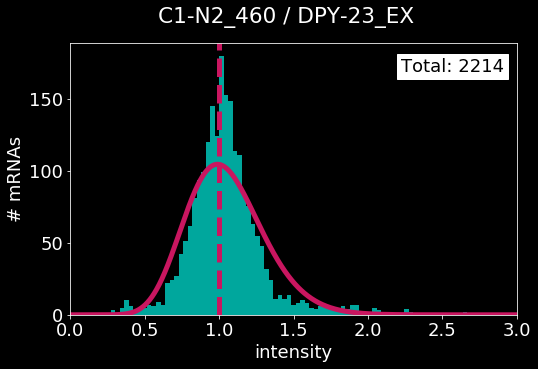

error: L1, L2 [4.739286375299148, 8.816964573923068]
peak center: 0.9696969696969697


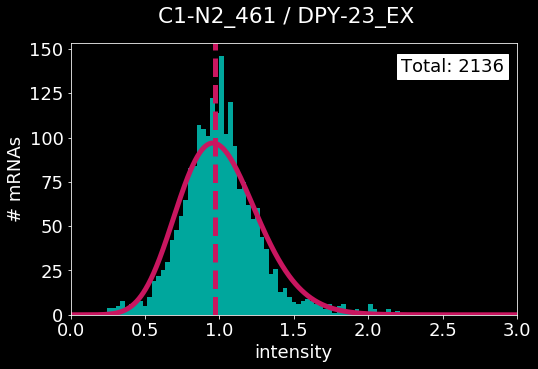

error: L1, L2 [6.560236471642356, 11.913135002515286]
peak center: 0.9696969696969697


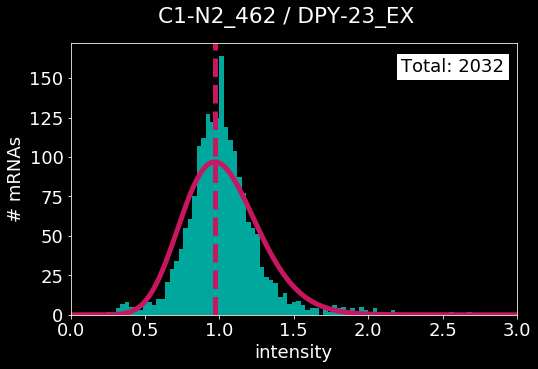

error: L1, L2 [6.423859506746376, 11.585215575839436]
peak center: 0.9696969696969697


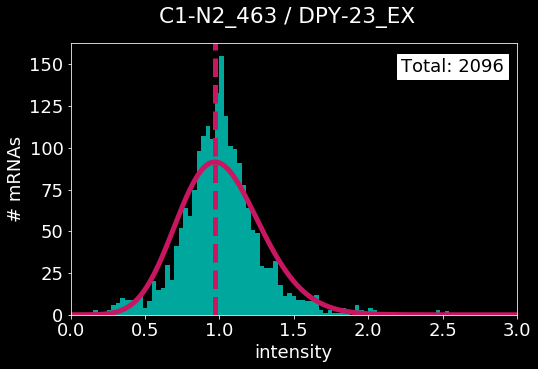

error: L1, L2 [3.8947189113057745, 7.8308183416915425]
peak center: 0.9696969696969697


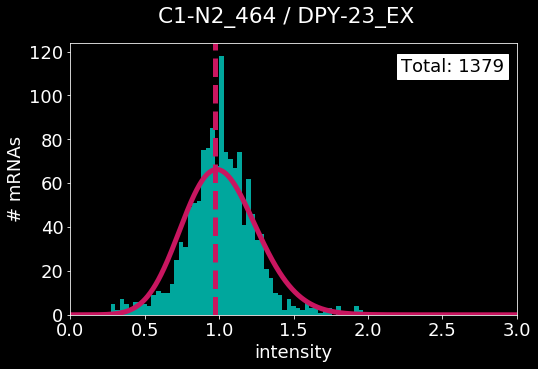

error: L1, L2 [26.341546203137423, 62.59022732002125]
peak center: 0.21212121212121213


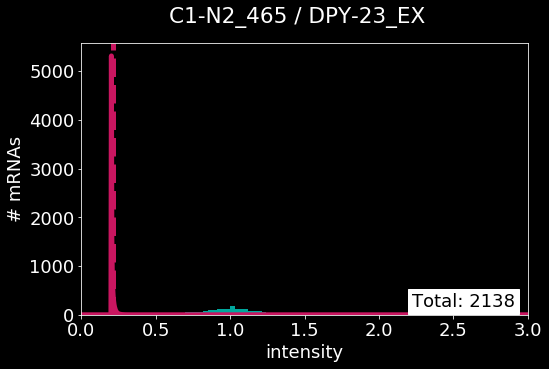

error: L1, L2 [2.7259042728743577, 4.444623628587898]
peak center: 0.9696969696969697


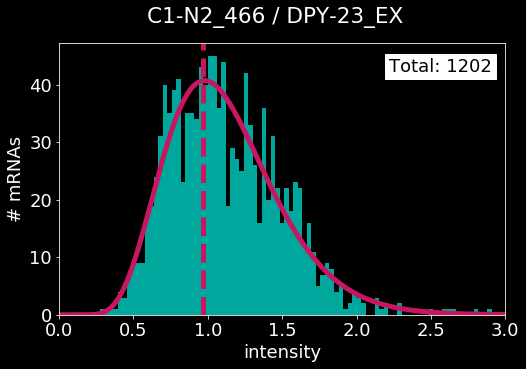

error: L1, L2 [3.0671655443910923, 5.414759625127006]
peak center: 1.878787878787879


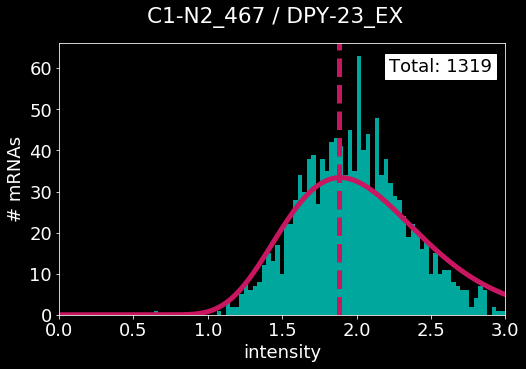

error: L1, L2 [3.765454440151711, 7.61737167983763]
peak center: 1.0


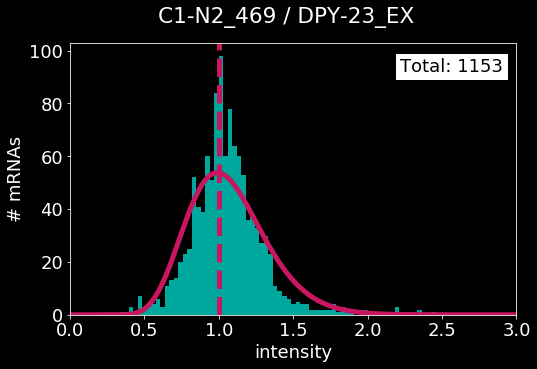

error: L1, L2 [5.056104803777271, 9.139764268877485]
peak center: 1.0303030303030303


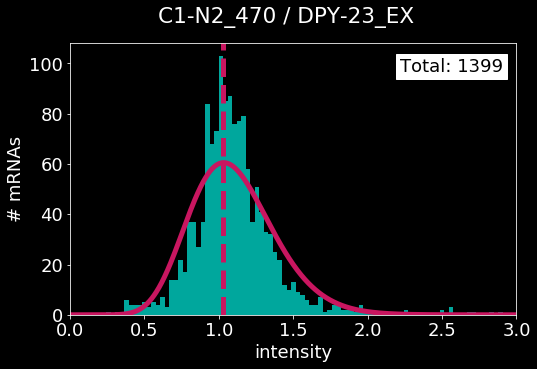

error: L1, L2 [4.574483076164175, 7.812794872163908]
peak center: 1.0


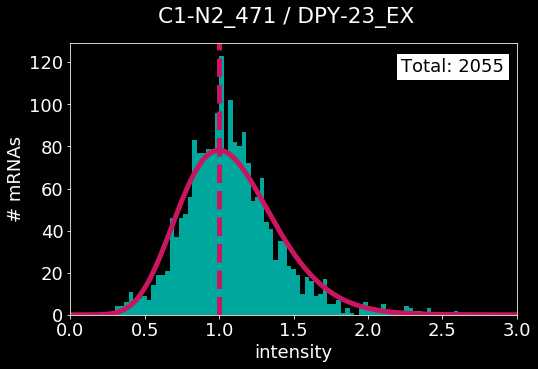

error: L1, L2 [4.136769952394873, 6.921359193213995]
peak center: 1.0


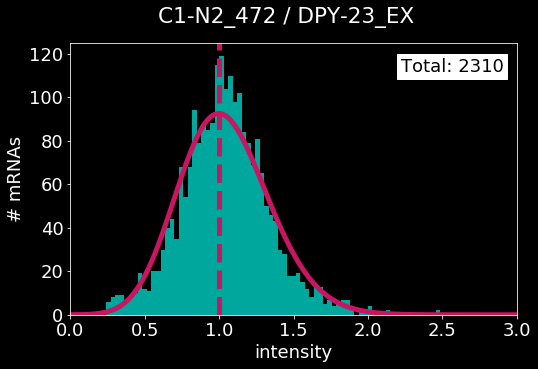

error: L1, L2 [4.403948003475724, 8.197755469192332]
peak center: 1.0


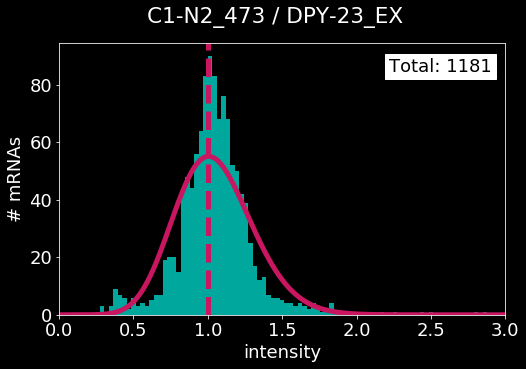

error: L1, L2 [6.550397893592782, 11.64990901047553]
peak center: 1.0


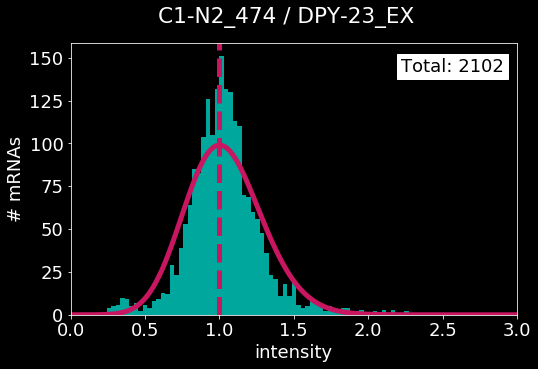

error: L1, L2 [4.216923448717355, 8.16985195770518]
peak center: 1.0303030303030303


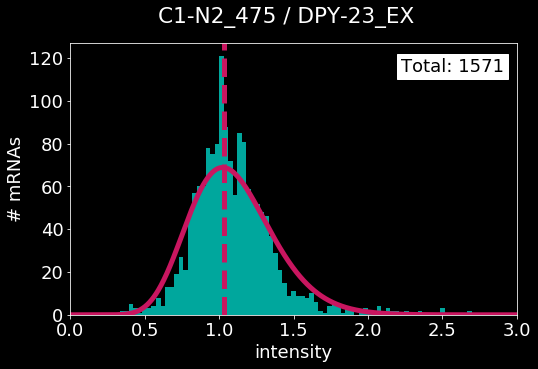

error: L1, L2 [2.5320961778628797, 4.606288726691968]
peak center: 0.9696969696969697


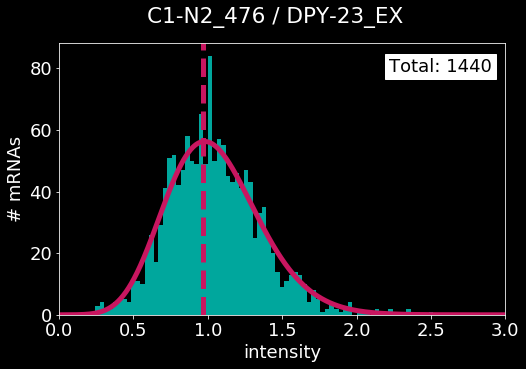

error: L1, L2 [4.450582854038593, 7.860636447518178]
peak center: 0.9696969696969697


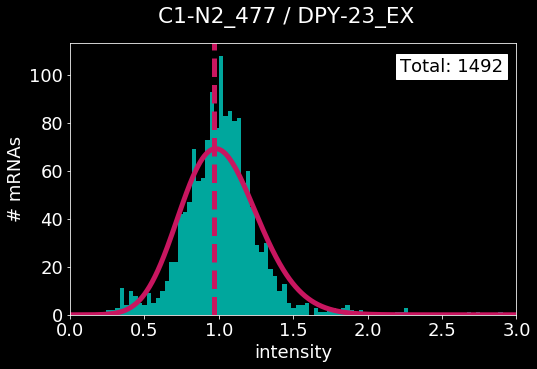

error: L1, L2 [4.302116189511364, 9.91937951840003]
peak center: 0.9696969696969697


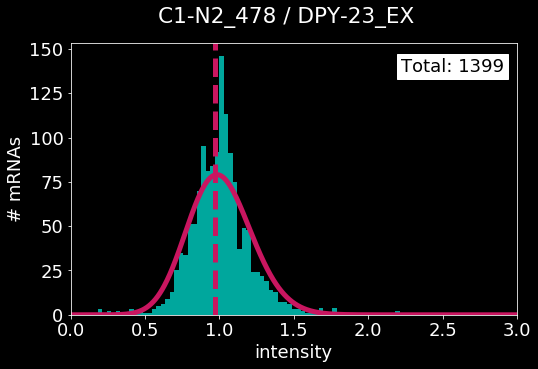

error: L1, L2 [6.141282142782811, 10.77324634136895]
peak center: 0.9393939393939394


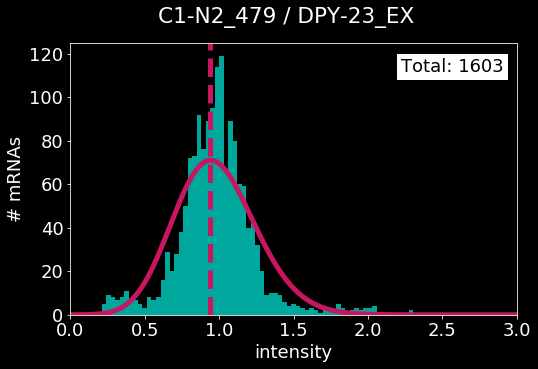

error: L1, L2 [2.386733141615564, 3.719603353602964]
peak center: 1.0606060606060606


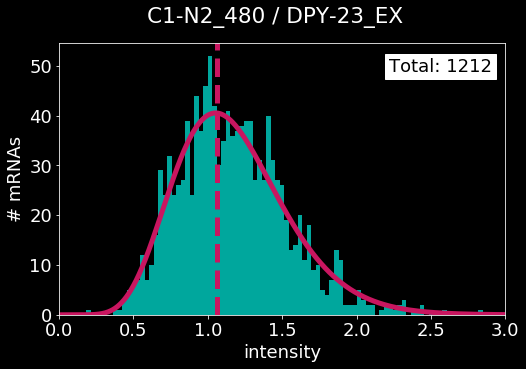

error: L1, L2 [3.714666273257941, 7.507744054210997]
peak center: 0.9696969696969697


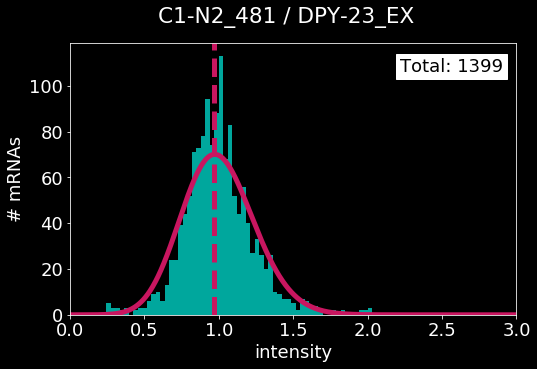

error: L1, L2 [2.5397751744499573, 4.818386964087044]
peak center: 1.0303030303030303


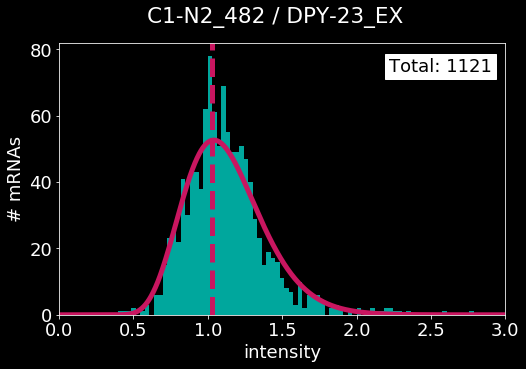

error: L1, L2 [3.034053704294461, 5.063696713910878]
peak center: 1.0606060606060606


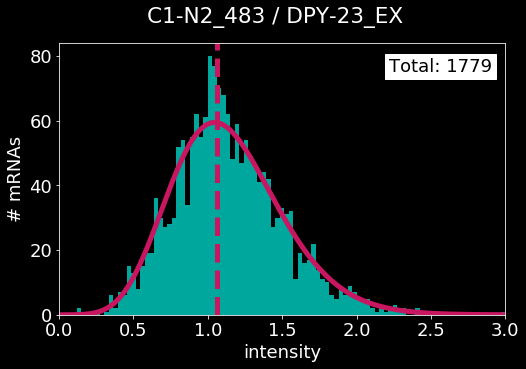

error: L1, L2 [2.9919825845927392, 7.431029840691607]
peak center: 1.0


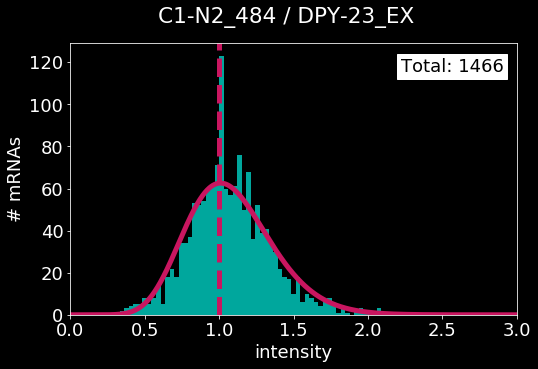

error: L1, L2 [4.04929079392194, 7.653519849275705]
peak center: 1.0


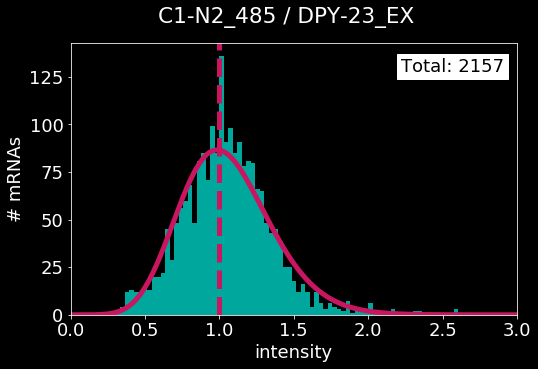

error: L1, L2 [26.642839135860513, 53.02117453644782]
peak center: 0.15151515151515152


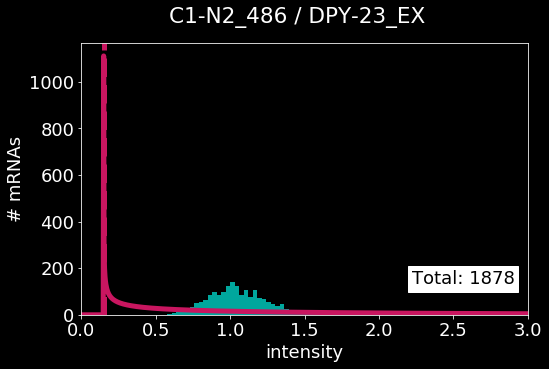

error: L1, L2 [4.708290412398215, 10.332639198921855]
peak center: 1.0


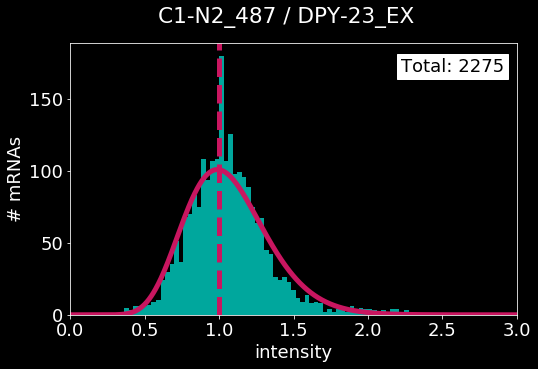

error: L1, L2 [2.950036627454775, 6.501236293524502]
peak center: 1.0


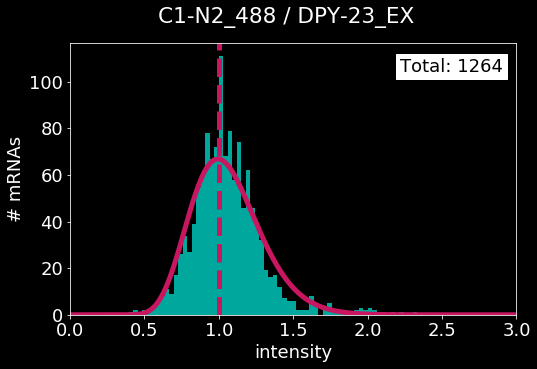

error: L1, L2 [6.338758159585454, 12.774015992012528]
peak center: 1.0


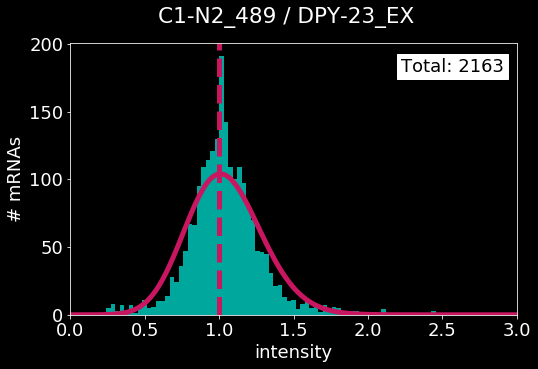

error: L1, L2 [4.311464863564998, 8.438072239945223]
peak center: 0.9393939393939394


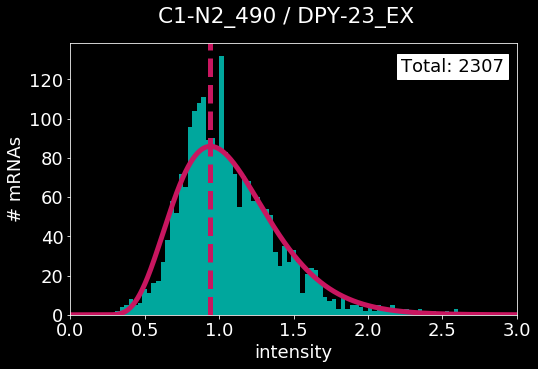

error: L1, L2 [3.019887011146844, 5.849328090894461]
peak center: 1.0


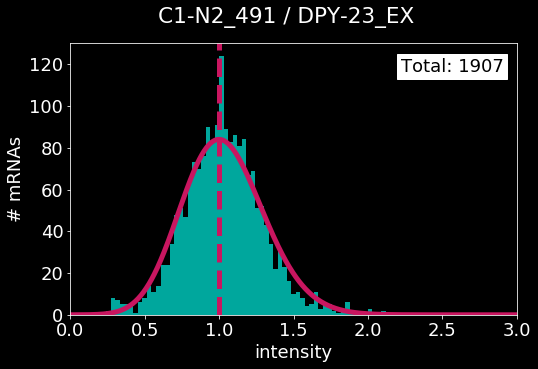

error: L1, L2 [5.614959101017978, 9.870163772602504]
peak center: 1.0303030303030303


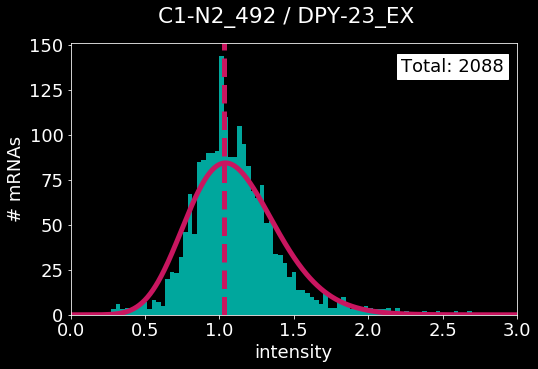

error: L1, L2 [5.206006837771467, 10.84605896976981]
peak center: 0.9696969696969697


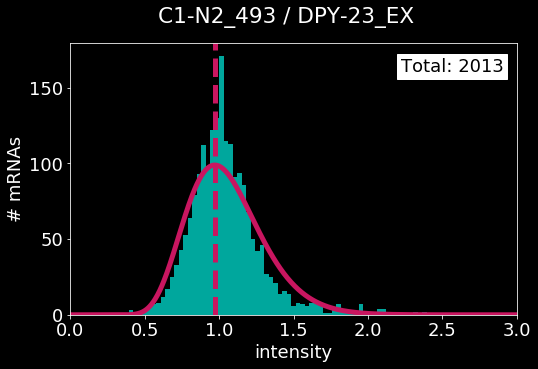

error: L1, L2 [3.263828776679855, 5.368946232023021]
peak center: 1.4545454545454546


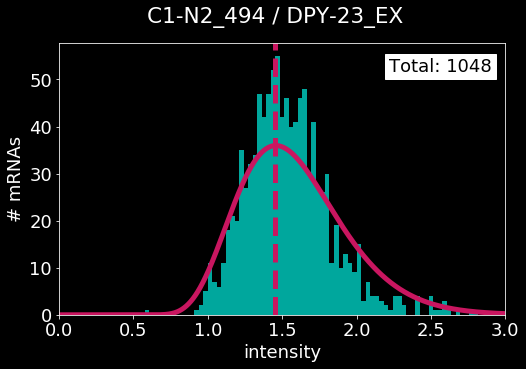

error: L1, L2 [4.595225418903711, 8.86646912519534]
peak center: 1.0


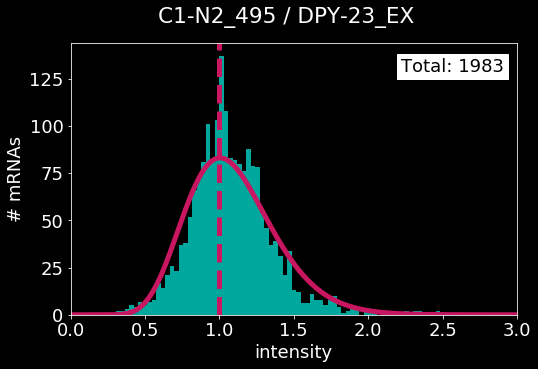

error: L1, L2 [5.64519540783122, 11.303344362944161]
peak center: 1.0303030303030303


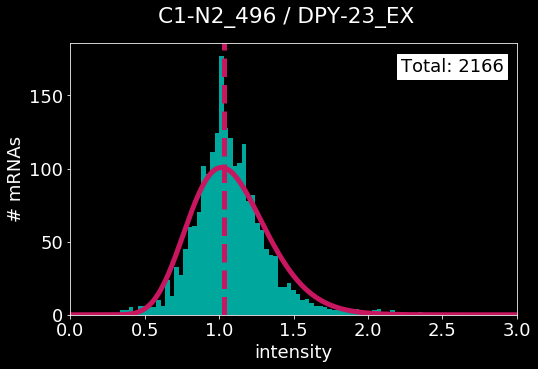

error: L1, L2 [3.6600067322390735, 6.950280582190121]
peak center: 0.9696969696969697


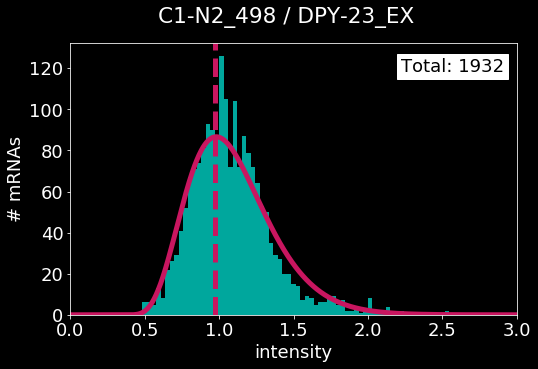

error: L1, L2 [3.189424709172143, 6.59654757335563]
peak center: 1.0303030303030303


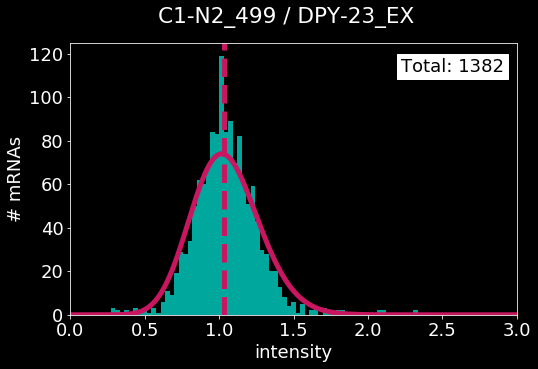

error: L1, L2 [4.2222868659044535, 8.922004441125843]
peak center: 1.0303030303030303


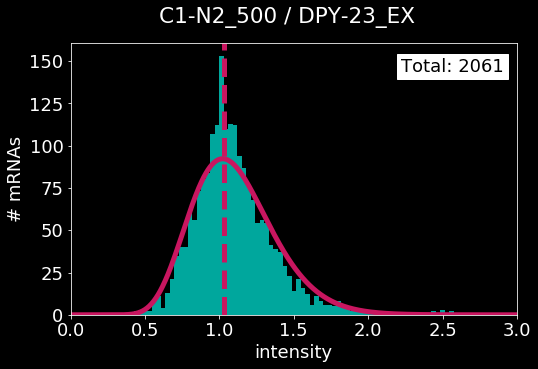

error: L1, L2 [4.853991907527886, 10.11786025773077]
peak center: 1.0606060606060606


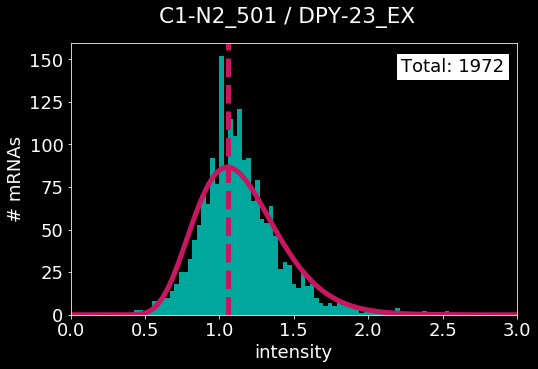

error: L1, L2 [3.352472048415728, 6.377114352832442]
peak center: 1.0


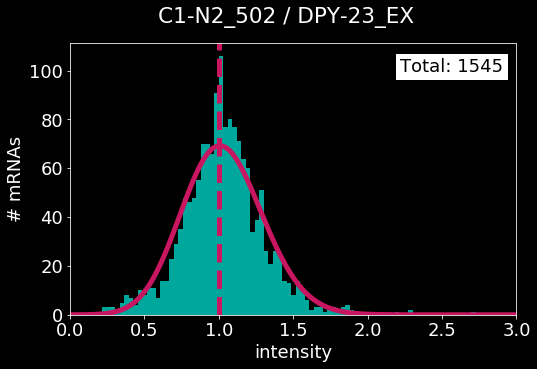

error: L1, L2 [6.2743705482944545, 11.879258019180533]
peak center: 0.9090909090909092


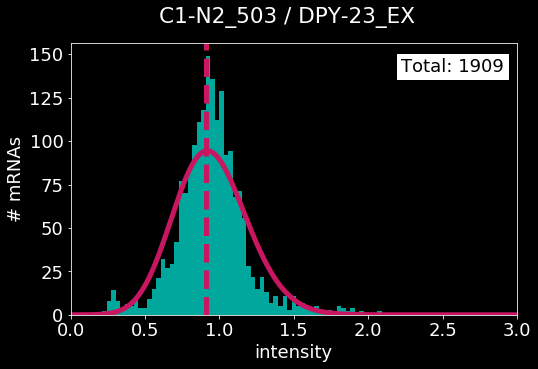

error: L1, L2 [3.197105230288439, 5.974390847667184]
peak center: 1.0303030303030303


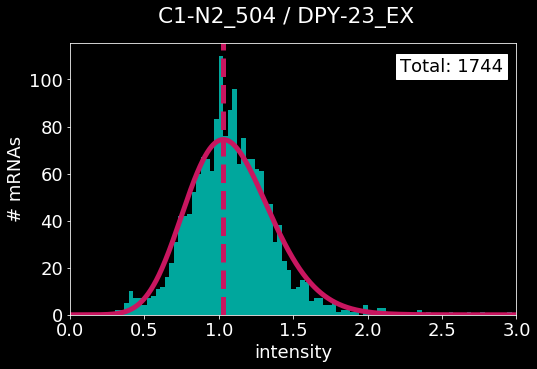

error: L1, L2 [27.456197919563223, 70.6393510091716]
peak center: 0.09090909090909091


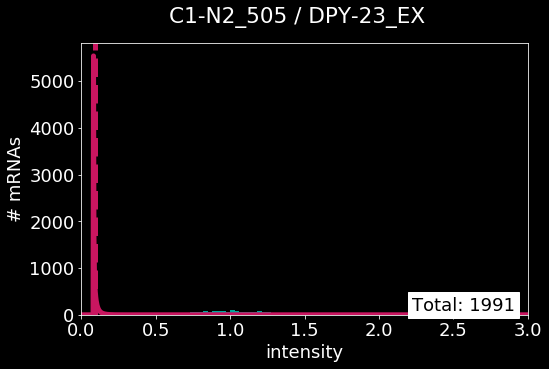

error: L1, L2 [33.95547100849453, 105.64610561477029]
peak center: 0.30303030303030304


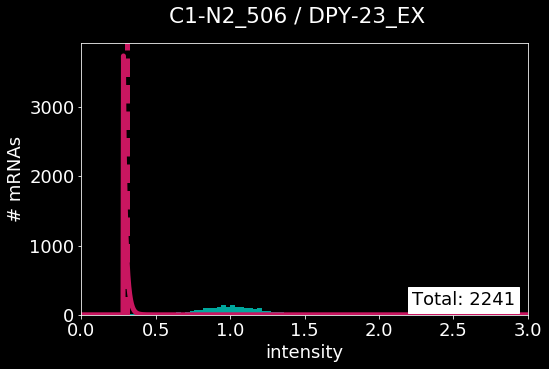

error: L1, L2 [6.710334541262895, 12.330834448587861]
peak center: 1.0


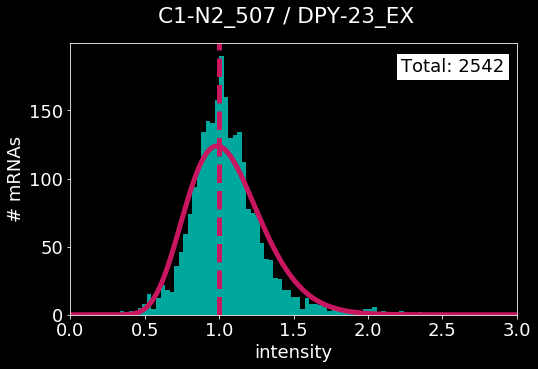

error: L1, L2 [3.6159368737771627, 5.6835687184485035]
peak center: 0.9696969696969697


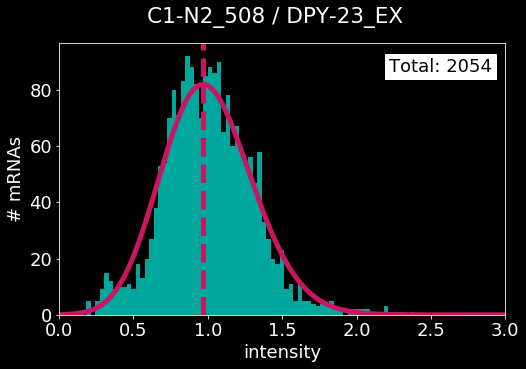

error: L1, L2 [4.012774264454024, 7.28000335288677]
peak center: 1.0


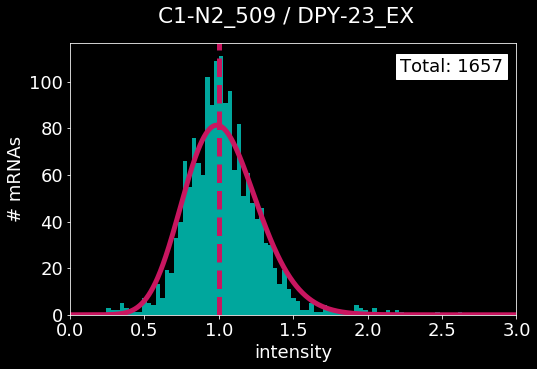

error: L1, L2 [3.08558205302898, 5.075433076310081]
peak center: 1.0


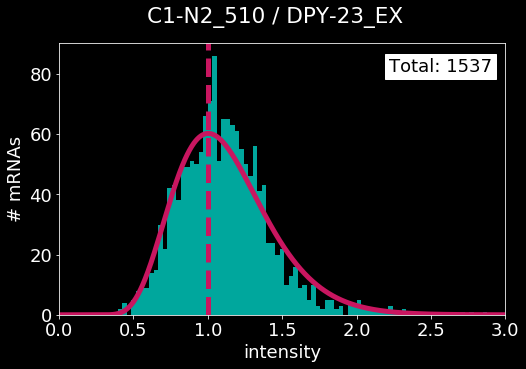

error: L1, L2 [5.3560071566015806, 9.928589479818895]
peak center: 1.0606060606060606


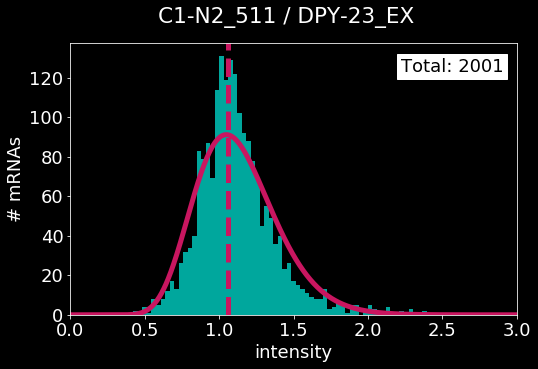

error: L1, L2 [5.033150649202872, 8.98806730141174]
peak center: 1.0


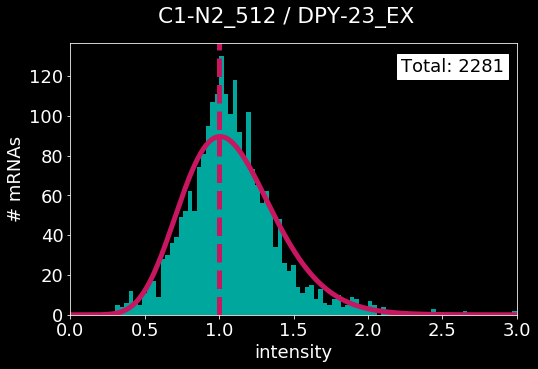

error: L1, L2 [3.299278842790186, 7.440966408053904]
peak center: 1.0303030303030303


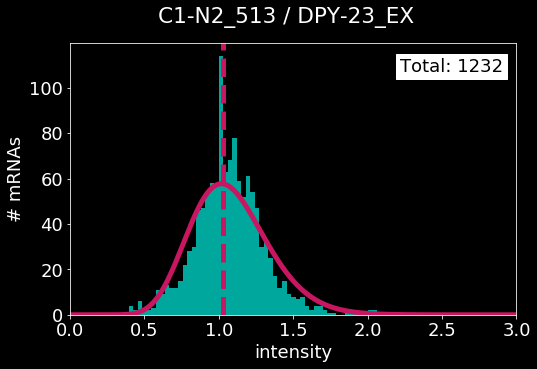

error: L1, L2 [3.0892244099603823, 5.646006111891735]
peak center: 0.9393939393939394


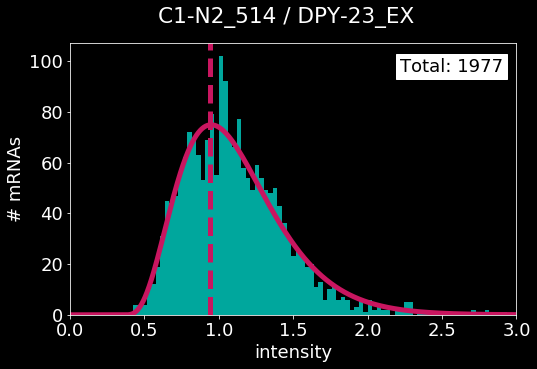

error: L1, L2 [2.113828933932572, 4.804824939507818]
peak center: 1.0


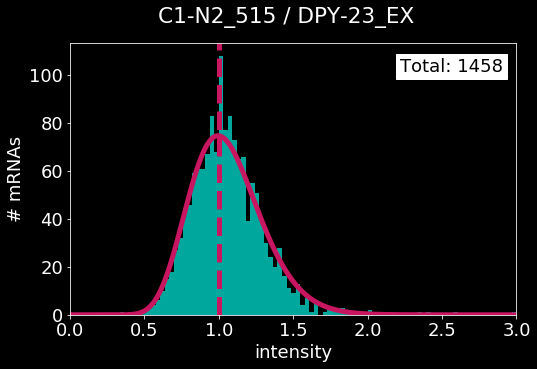

error: L1, L2 [2.606458653796073, 4.411006503578581]
peak center: 0.9393939393939394


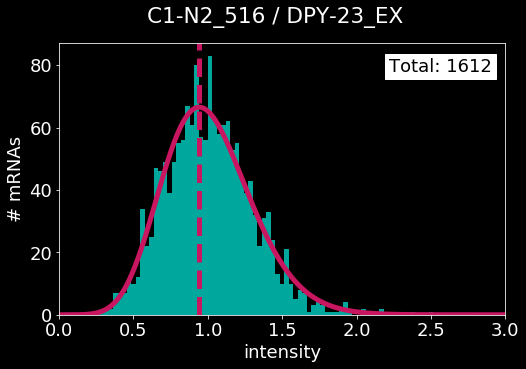

error: L1, L2 [2.156131235226867, 3.532560373345498]
peak center: 1.0


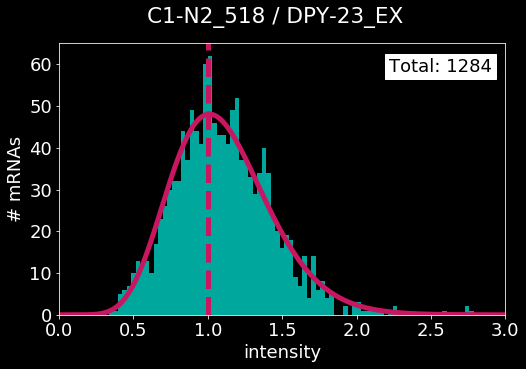

error: L1, L2 [1.9031719717480635, 4.4164536840405235]
peak center: 0.9090909090909092


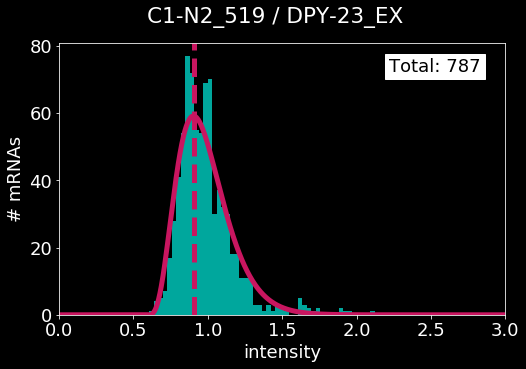

error: L1, L2 [13.025837562446835, 25.192581833651463]
peak center: 0.6666666666666667


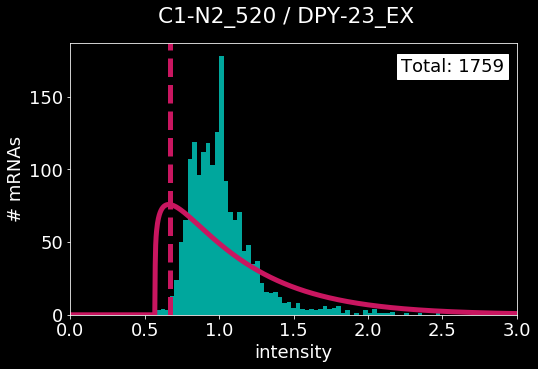

error: L1, L2 [3.868311185611147, 6.756993918441153]
peak center: 1.0


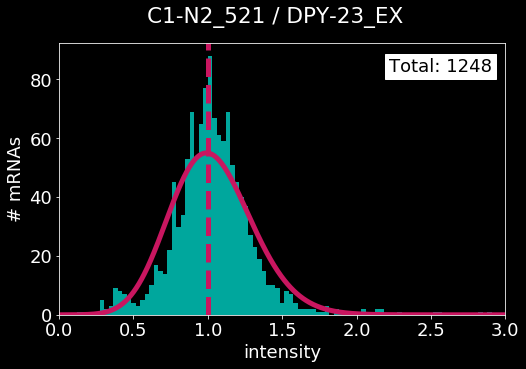

error: L1, L2 [4.407707847821256, 8.099280361901563]
peak center: 0.9393939393939394


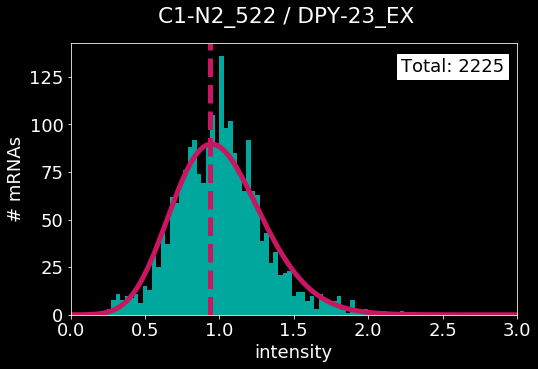

error: L1, L2 [6.039491903209949, 11.87209827600523]
peak center: 0.9393939393939394


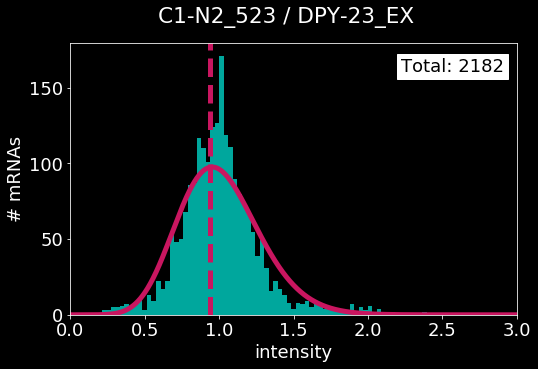

error: L1, L2 [2.901707659746972, 5.493539403770772]
peak center: 0.8181818181818182


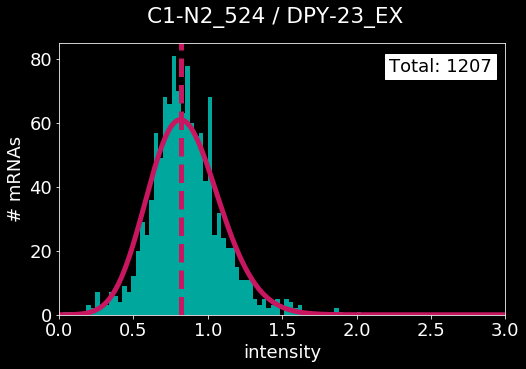

error: L1, L2 [3.3678842290884115, 8.456139788221156]
peak center: 0.9696969696969697


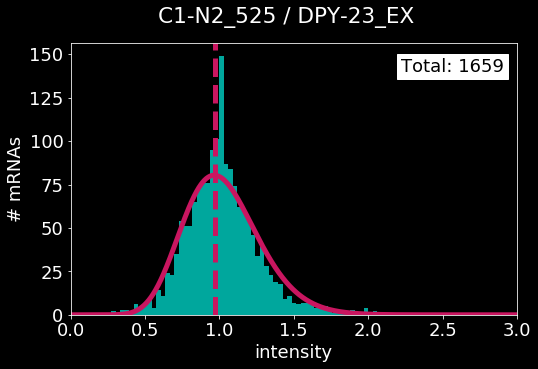

error: L1, L2 [4.022335911450171, 7.013692424106276]
peak center: 0.9696969696969697


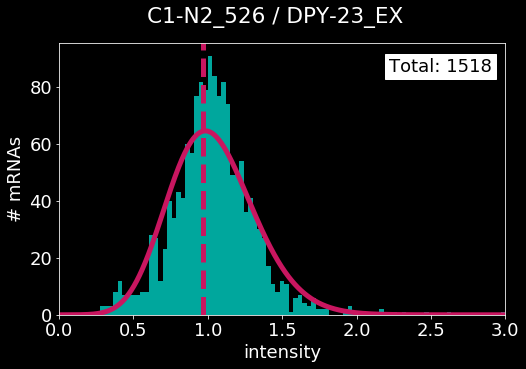

error: L1, L2 [3.13199641331334, 5.298999996560931]
peak center: 1.303030303030303


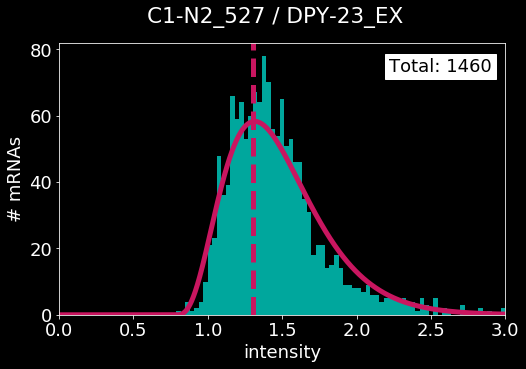

error: L1, L2 [25.571964753137706, 48.51978523182291]
peak center: 0.0


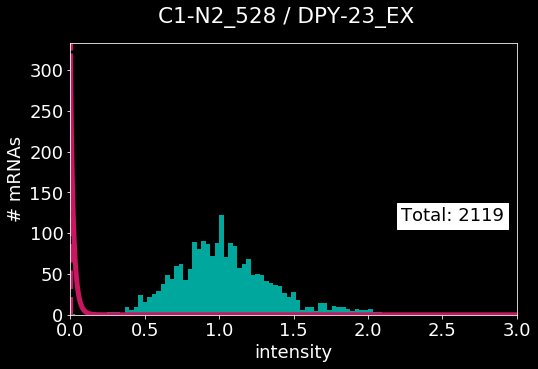

error: L1, L2 [2.4081588085739787, 4.178084308789467]
peak center: 1.0606060606060606


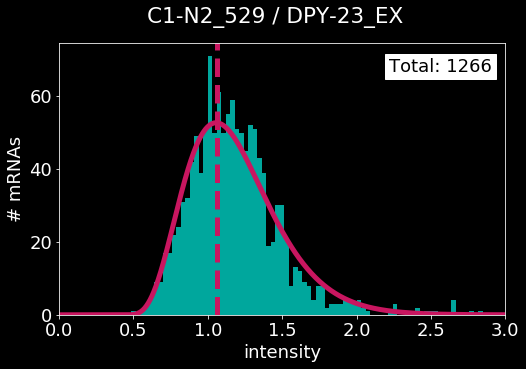

error: L1, L2 [4.443146964307015, 8.288647475677305]
peak center: 1.0


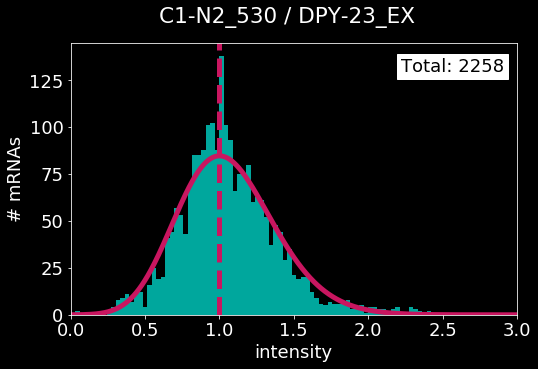

error: L1, L2 [2.470192774557694, 3.8413156300101425]
peak center: 0.9696969696969697


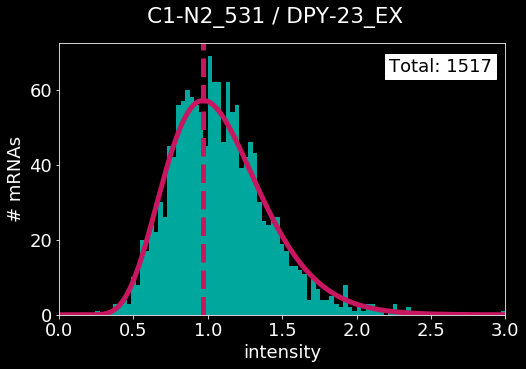

error: L1, L2 [2.5867937164251047, 4.590764258834636]
peak center: 0.9696969696969697


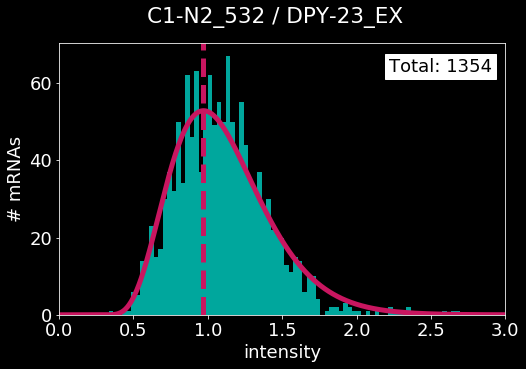

error: L1, L2 [3.0701925206843748, 5.816544922310125]
peak center: 0.9393939393939394


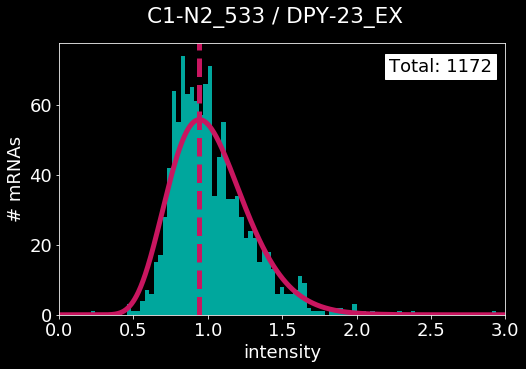

error: L1, L2 [3.4583772164046493, 6.579866317559423]
peak center: 0.9696969696969697


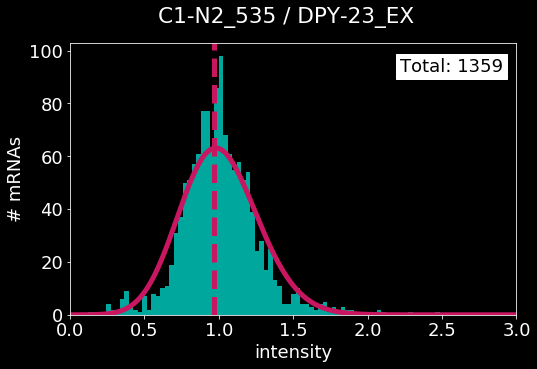

error: L1, L2 [1.8613847080040324, 3.2857947932539484]
peak center: 0.9696969696969697


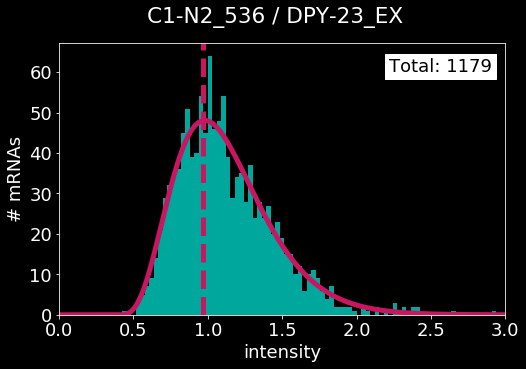

error: L1, L2 [2.325257848802216, 4.837699185690433]
peak center: 1.0


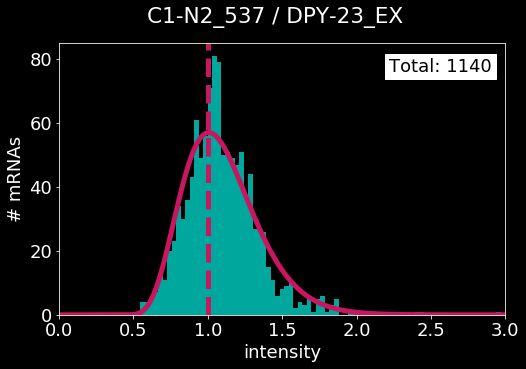

error: L1, L2 [5.983554533014235, 10.770479515055094]
peak center: 1.0


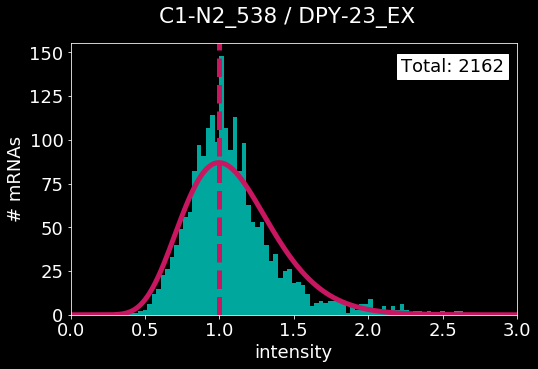

error: L1, L2 [1.9853337613675106, 4.284215921134467]
peak center: 0.9696969696969697


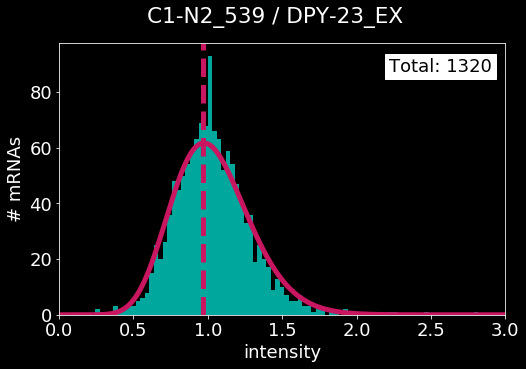

error: L1, L2 [3.9412439856227732, 7.220427732319976]
peak center: 1.0606060606060606


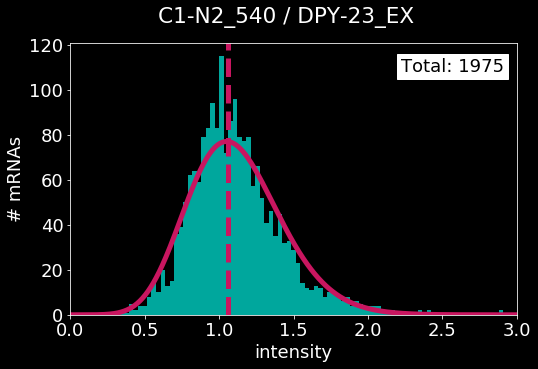

error: L1, L2 [3.643673272036463, 6.7983698615055665]
peak center: 1.0303030303030303


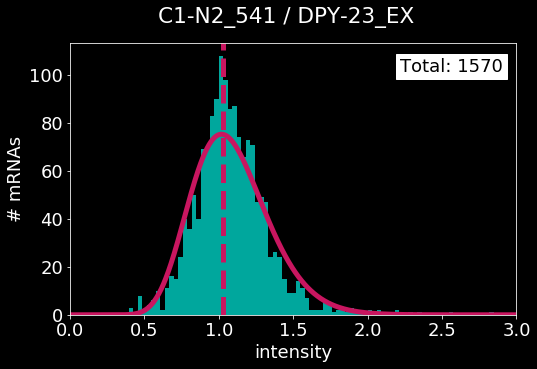

error: L1, L2 [5.475133693642117, 10.148962768881917]
peak center: 0.9696969696969697


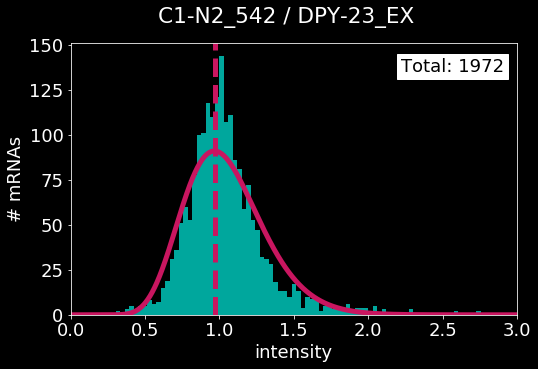

error: L1, L2 [3.6884702185518212, 7.600928199772438]
peak center: 0.9696969696969697


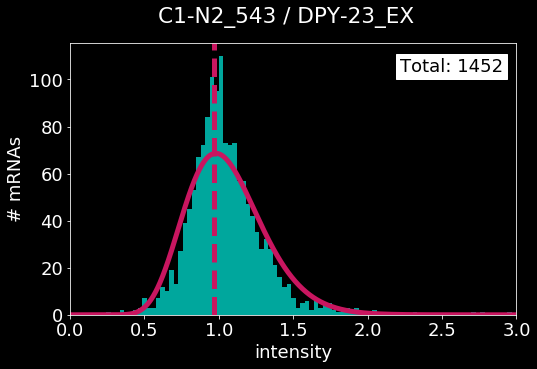

error: L1, L2 [3.487552088477379, 7.317220768103894]
peak center: 0.9696969696969697


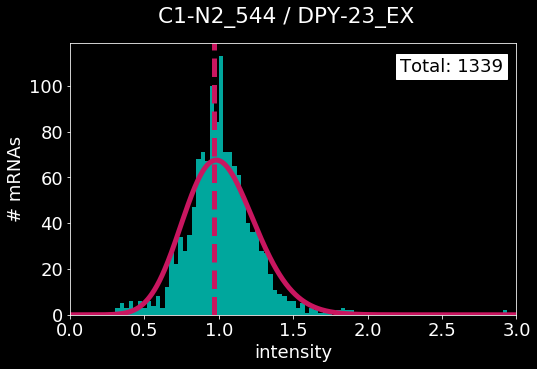

error: L1, L2 [3.9600019365300647, 7.315993036342948]
peak center: 1.0


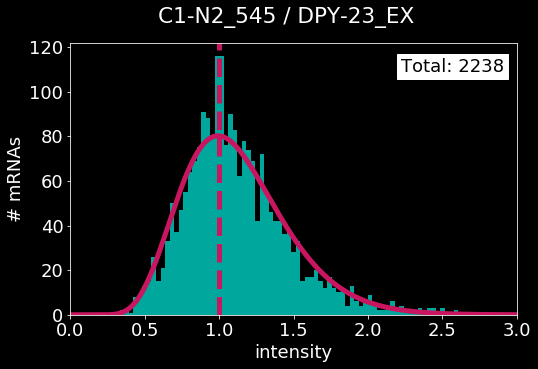

error: L1, L2 [4.989075737352545, 9.444083579411462]
peak center: 1.0303030303030303


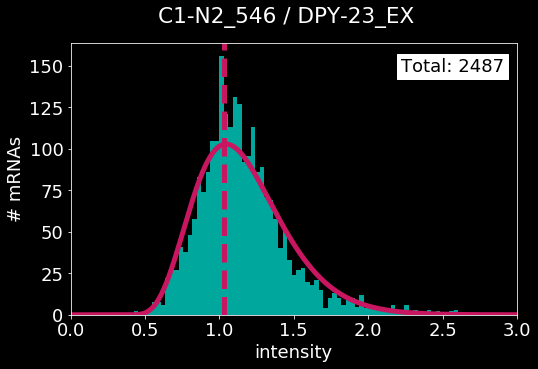

error: L1, L2 [4.022194277272655, 7.177489360545012]
peak center: 1.0303030303030303


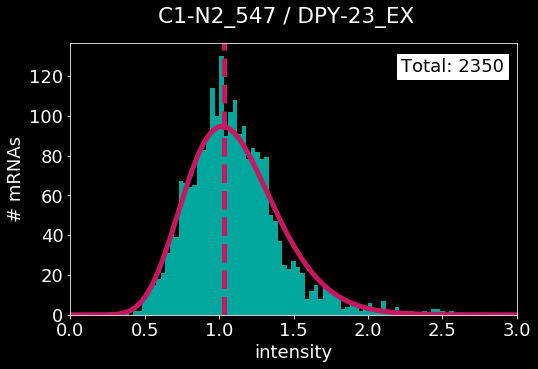

error: L1, L2 [4.059398488434481, 7.966908559823182]
peak center: 1.0


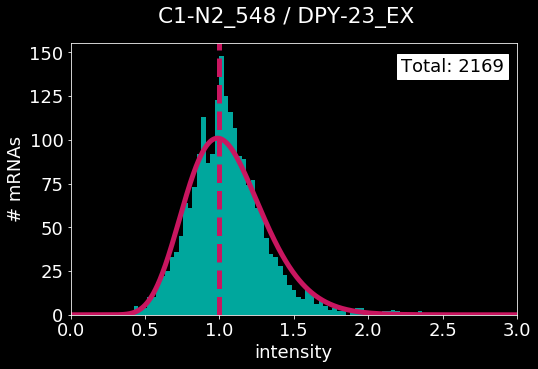

error: L1, L2 [3.9772298107015107, 7.209884903387059]
peak center: 0.9696969696969697


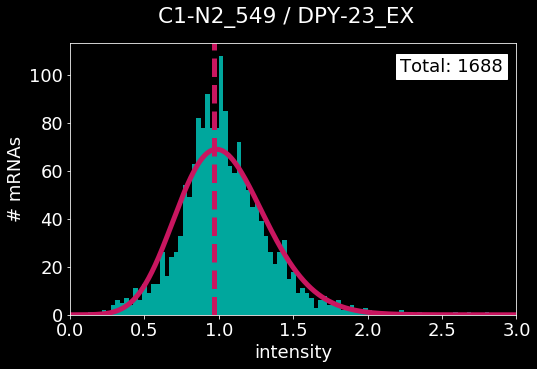

error: L1, L2 [2.431731448529826, 4.5628066612984535]
peak center: 0.9696969696969697


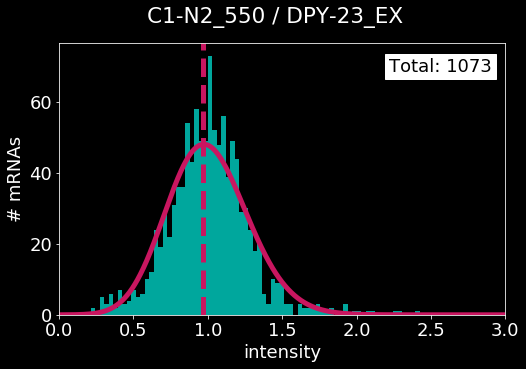

error: L1, L2 [3.3836366985847426, 6.0555093306963315]
peak center: 0.9696969696969697


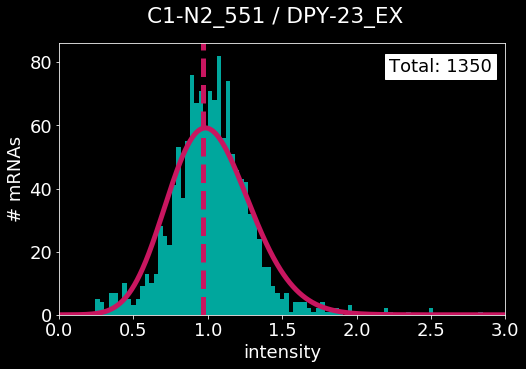

error: L1, L2 [5.4236010094231775, 9.60453472981989]
peak center: 1.0


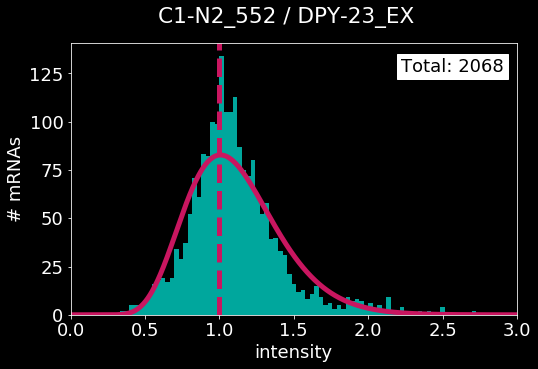

error: L1, L2 [6.457084895728549, 11.79401928956102]
peak center: 1.0303030303030303


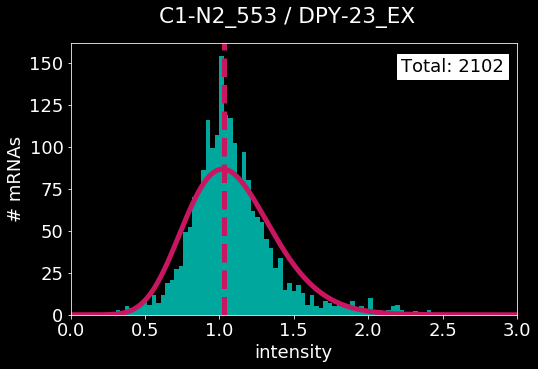

error: L1, L2 [2.8764160613590306, 4.869912502104078]
peak center: 0.9696969696969697


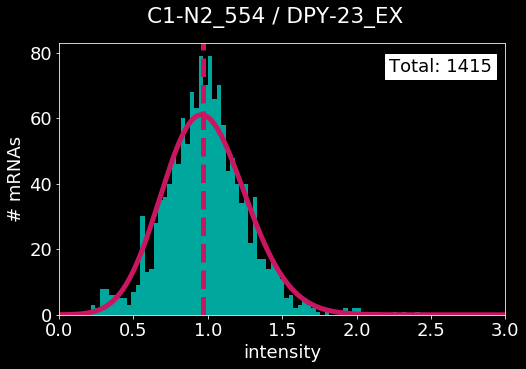

error: L1, L2 [2.8610807466327737, 5.866770788801878]
peak center: 1.0303030303030303


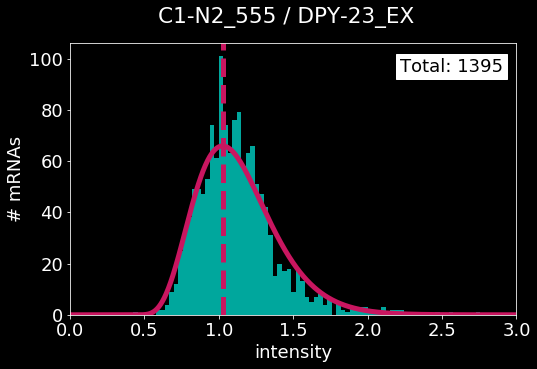

error: L1, L2 [2.779803154562258, 5.538419715647595]
peak center: 1.0


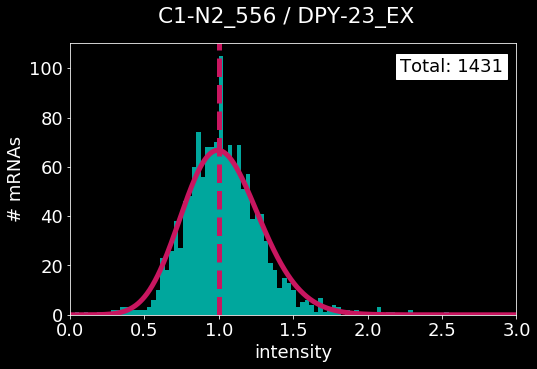

error: L1, L2 [3.5574104105210522, 6.956978508230119]
peak center: 0.9696969696969697


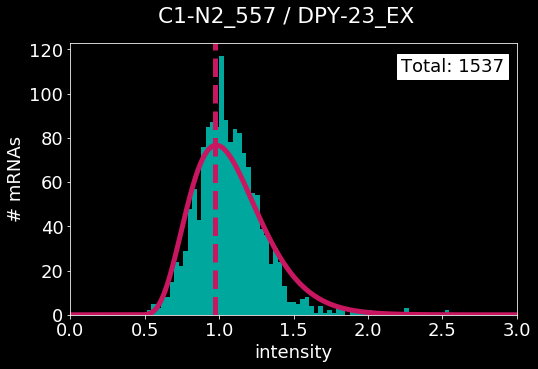

error: L1, L2 [4.667452354424529, 7.797104779773363]
peak center: 1.0909090909090908


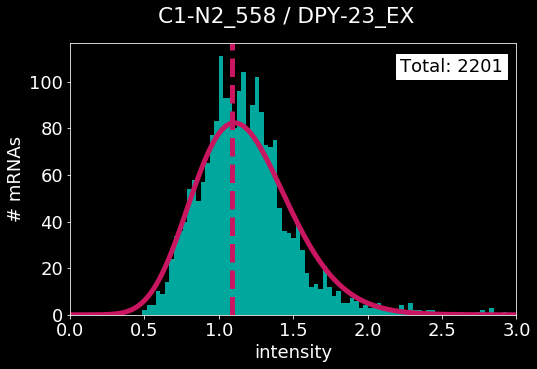

error: L1, L2 [5.760421744386514, 11.379140203212573]
peak center: 1.0


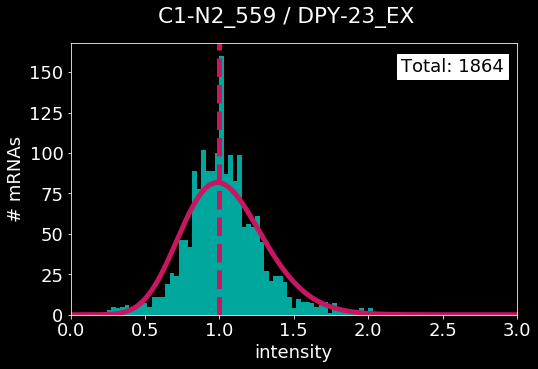

error: L1, L2 [5.497708009882641, 10.771530924471783]
peak center: 1.0


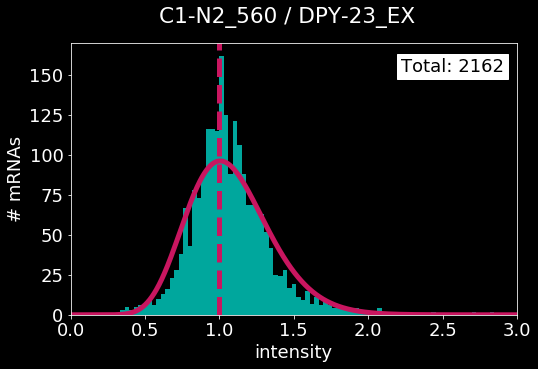

error: L1, L2 [5.414767281352422, 9.700150378791864]
peak center: 0.9393939393939394


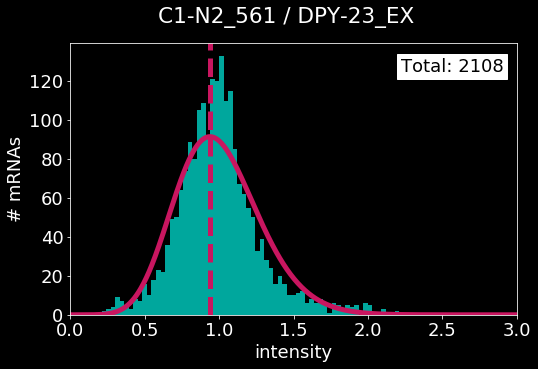

error: L1, L2 [2.4988171429622548, 4.320054451763116]
peak center: 1.0


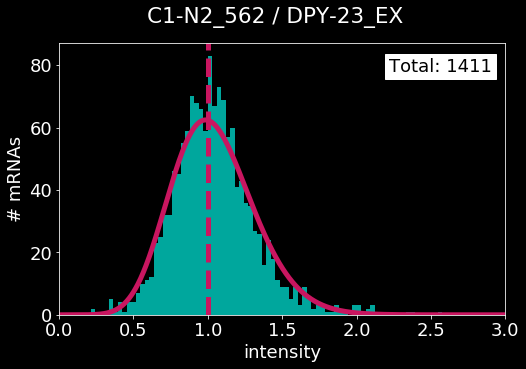

/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: loadtxt: Empty input file: "/Volumes/MILKYKLIM/super full n2/csv-2/C1-N2_563.csv"
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:410: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)
/Users/kkolyva/anaconda3/envs/pretty-graphs/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


error: L1, L2 [2.9637502834927787, 5.520072941775404]
peak center: 1.0


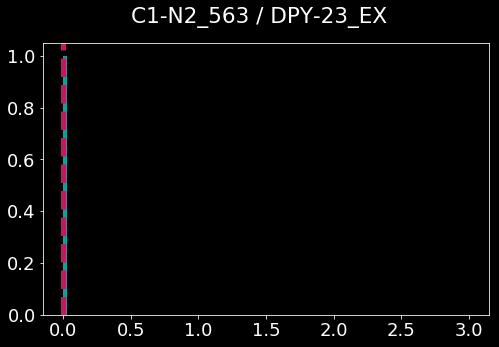

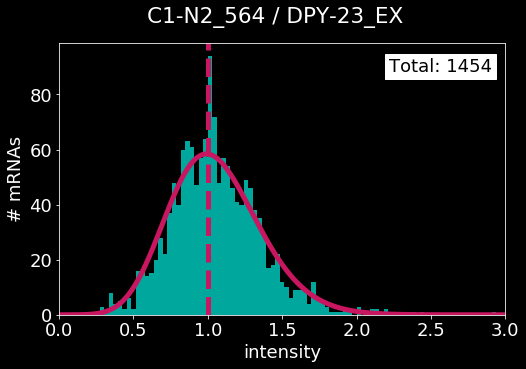

error: L1, L2 [6.200338075261407, 11.907994542584188]
peak center: 1.0


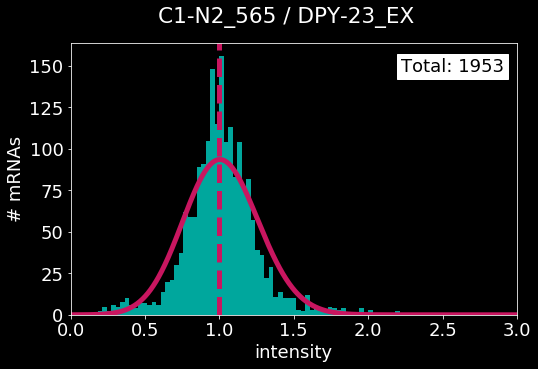

error: L1, L2 [5.310110647869578, 8.809153367331001]
peak center: 1.0


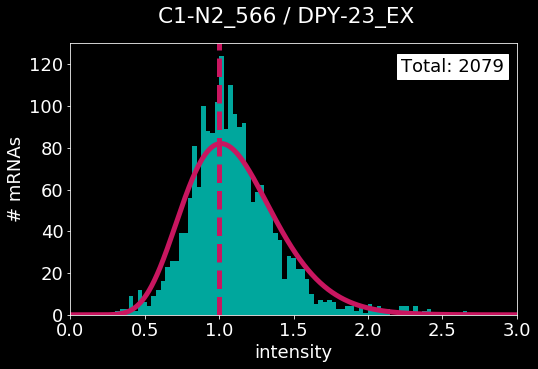

error: L1, L2 [3.6358557241861025, 7.09509398959377]
peak center: 0.8787878787878788


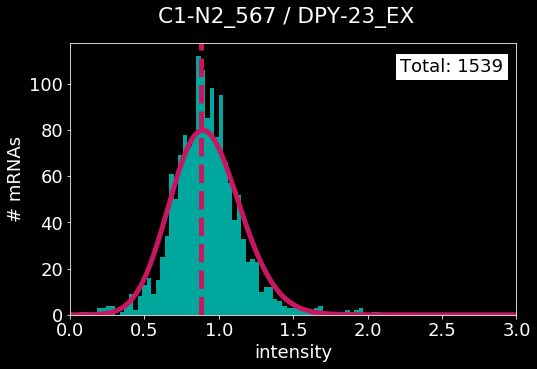

error: L1, L2 [3.337711074286424, 7.048975949011835]
peak center: 0.9696969696969697


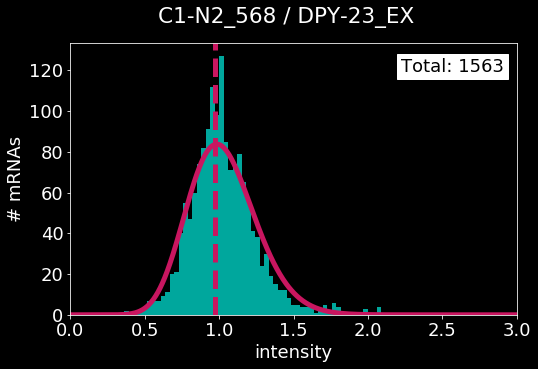

error: L1, L2 [3.330775536341763, 7.018436495129142]
peak center: 0.9696969696969697


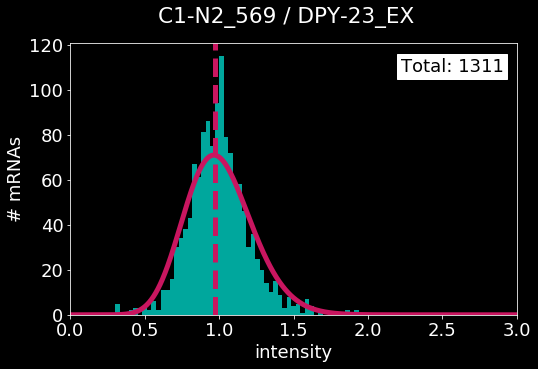

error: L1, L2 [2.291519454519078, 4.42701139385835]
peak center: 1.0


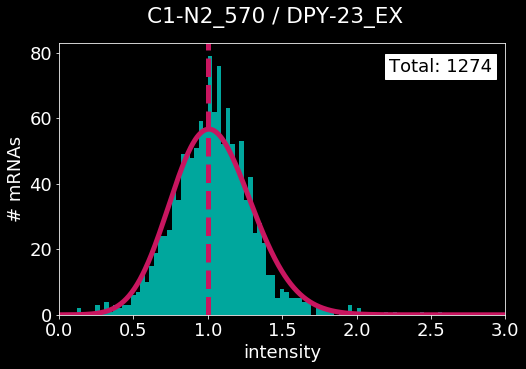

error: L1, L2 [3.0075863422364986, 5.882289610019306]
peak center: 1.0303030303030303


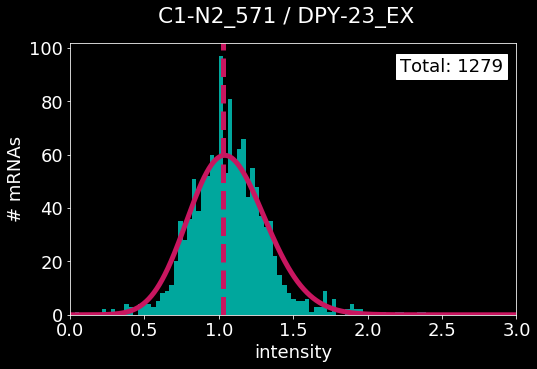

error: L1, L2 [3.6296285960652828, 6.475060269031324]
peak center: 0.9696969696969697


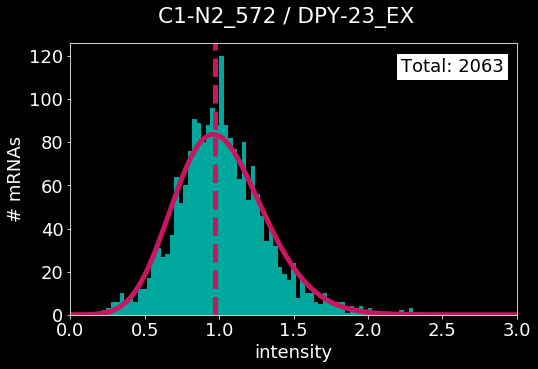

error: L1, L2 [4.922106744413806, 9.774446120126903]
peak center: 1.0


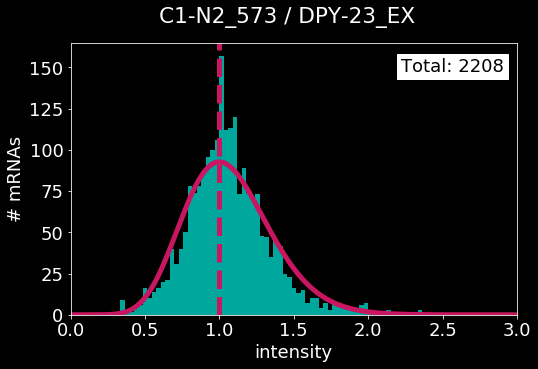

error: L1, L2 [4.027432618710742, 8.038138128419646]
peak center: 0.9696969696969697


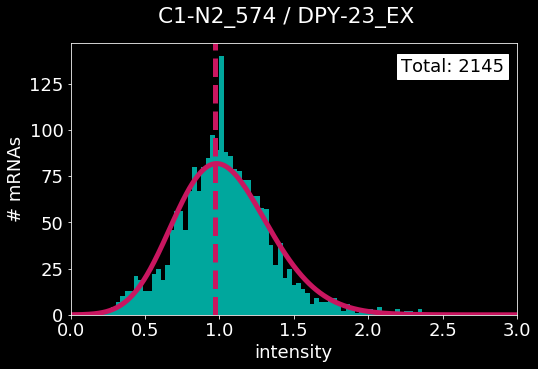

error: L1, L2 [5.205335160360563, 10.187520341526206]
peak center: 1.0


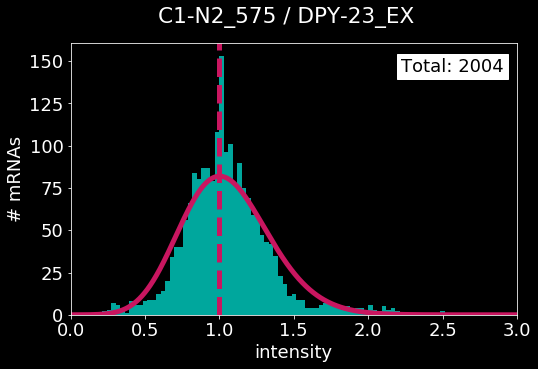

error: L1, L2 [4.375897648674341, 8.354179932045014]
peak center: 1.0


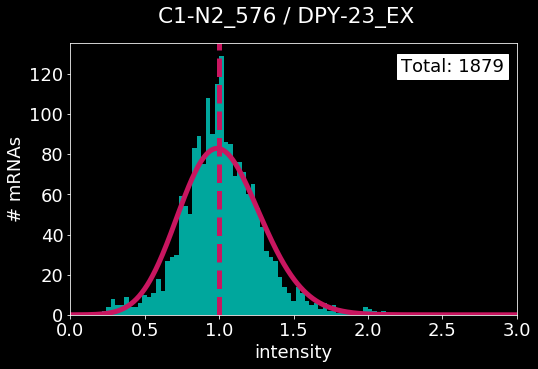

error: L1, L2 [3.5936770083966514, 6.243745767346572]
peak center: 0.9393939393939394


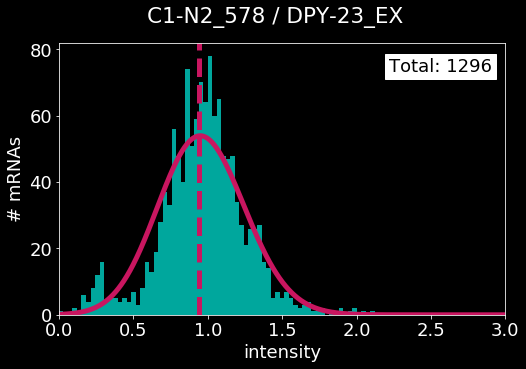

error: L1, L2 [3.6655664600328404, 6.252186181179358]
peak center: 0.9696969696969697


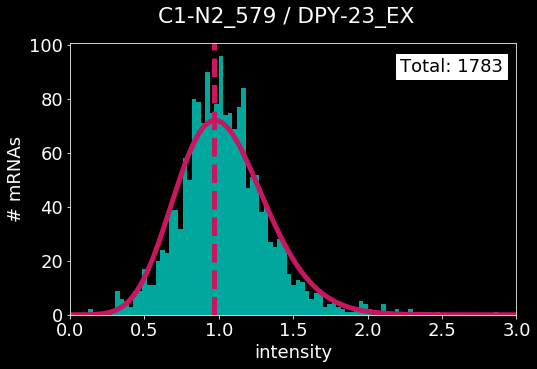

error: L1, L2 [3.207090016502181, 5.5765140012615655]
peak center: 0.9696969696969697


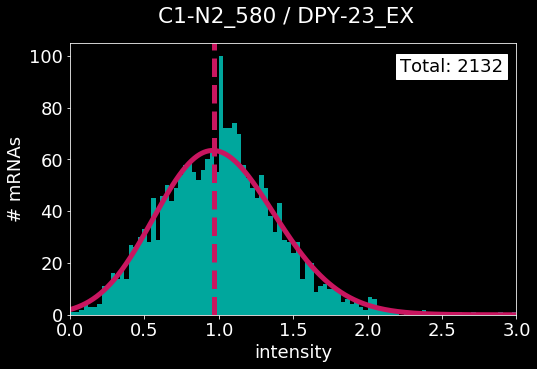

error: L1, L2 [2.7644706360448605, 5.311854864015254]
peak center: 0.9696969696969697


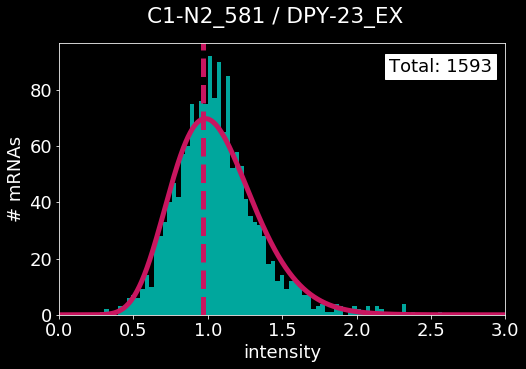

error: L1, L2 [2.8047713762179627, 5.778134293815004]
peak center: 1.0303030303030303


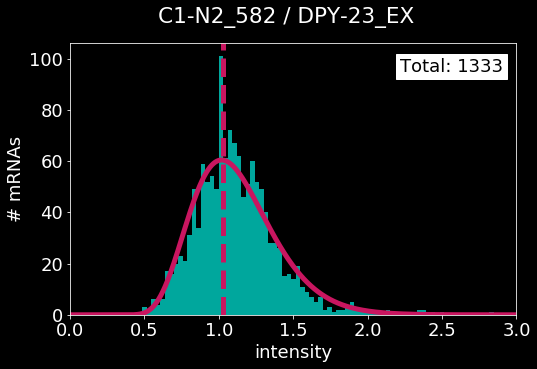

error: L1, L2 [4.499126633401711, 7.799665559329169]
peak center: 0.6363636363636364


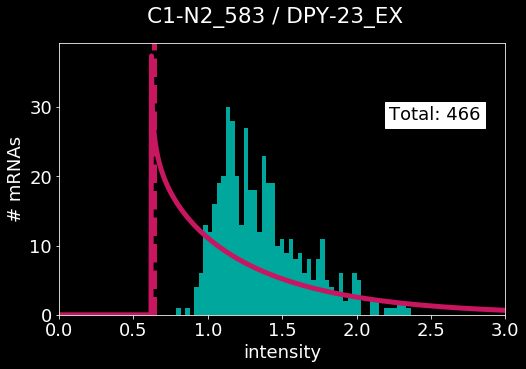

error: L1, L2 [2.8312574986664956, 4.753479813791162]
peak center: 1.0


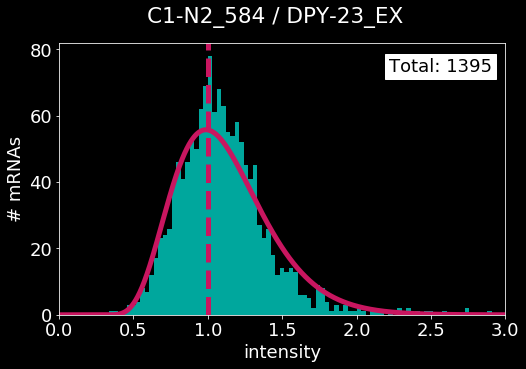

error: L1, L2 [2.5118932778527725, 5.19076134806341]
peak center: 0.5454545454545454


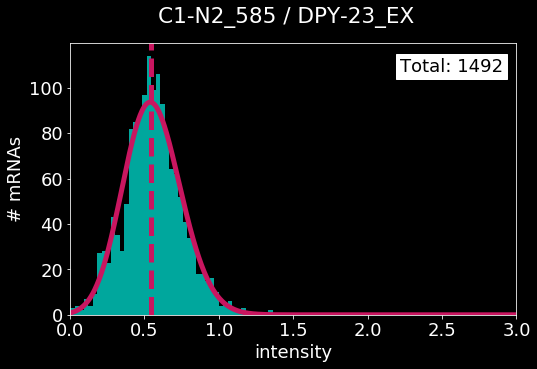

error: L1, L2 [2.6892667717830423, 5.093970324773499]
peak center: 0.6666666666666667


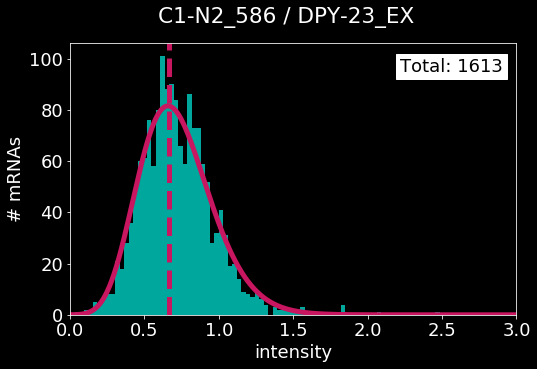

error: L1, L2 [4.5488820056723895, 8.305105481594348]
peak center: 1.0303030303030303


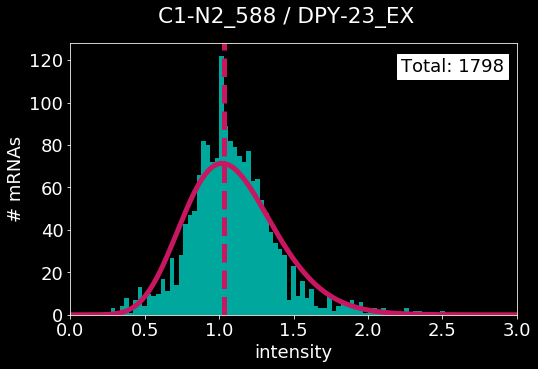

error: L1, L2 [4.1673037938484985, 7.1649571197067425]
peak center: 1.0303030303030303


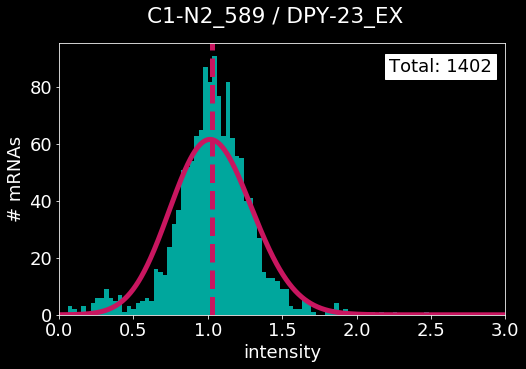

error: L1, L2 [2.6861179668783803, 4.36359431652366]
peak center: 1.0303030303030303


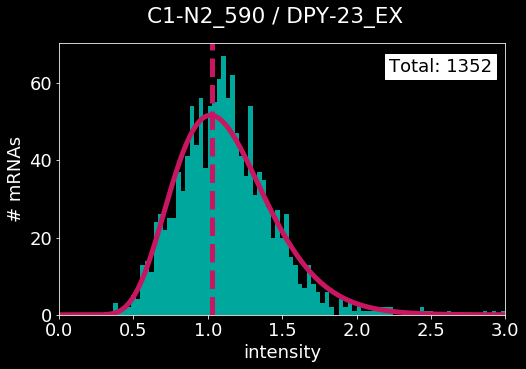

error: L1, L2 [2.7533846059896643, 5.069066647735474]
peak center: 1.0303030303030303


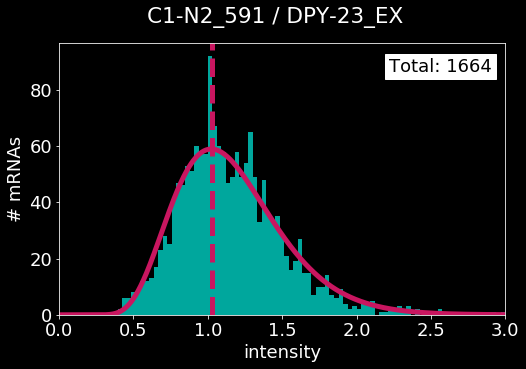

error: L1, L2 [5.364166064857736, 8.588350091915892]
peak center: 0.9696969696969697


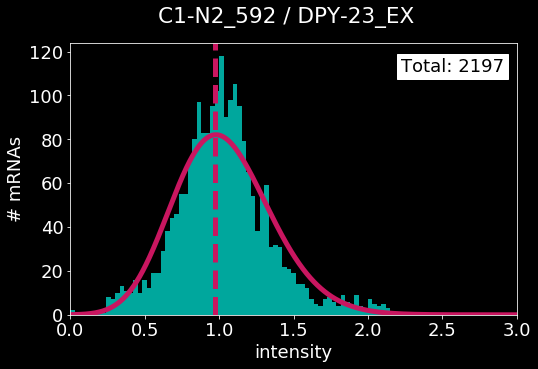

error: L1, L2 [4.124511585894412, 7.851424106561581]
peak center: 1.0


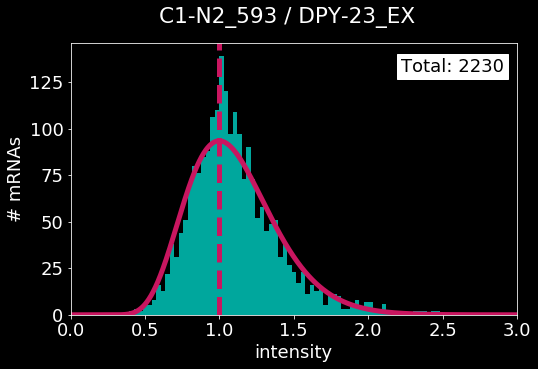

error: L1, L2 [5.270105172960789, 10.003386436115086]
peak center: 0.9696969696969697


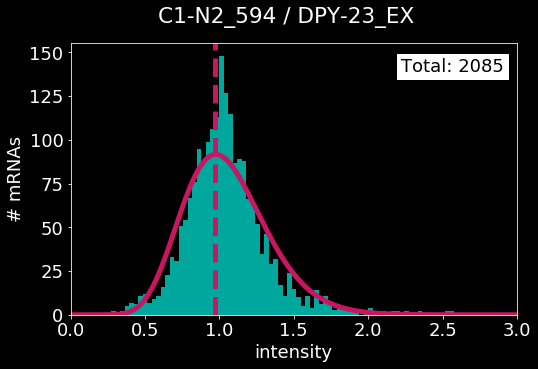

error: L1, L2 [2.789236211505193, 5.149014059450105]
peak center: 1.0


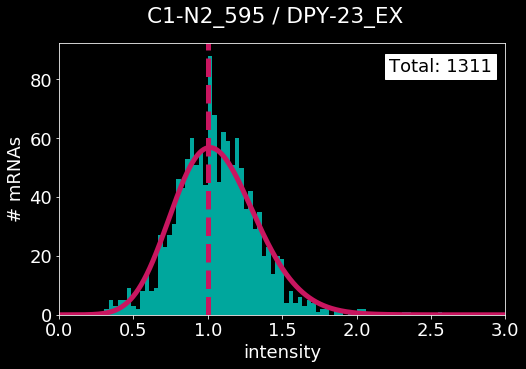

error: L1, L2 [4.220253938698225, 8.282098487985714]
peak center: 1.0


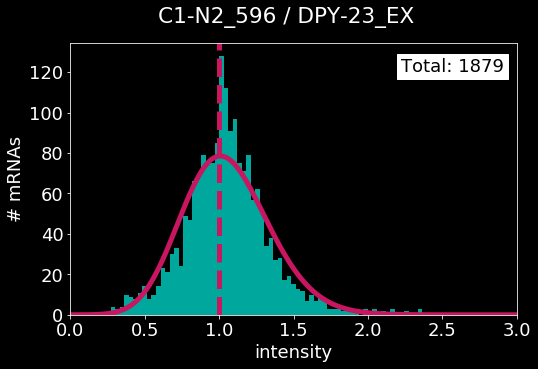

error: L1, L2 [5.395123264232567, 10.330704937796206]
peak center: 1.0


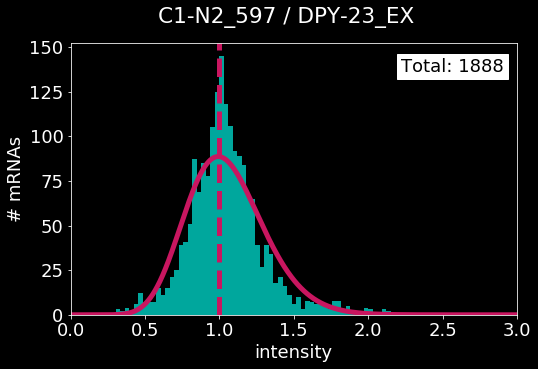

error: L1, L2 [5.618440262856686, 10.312001362434536]
peak center: 1.0


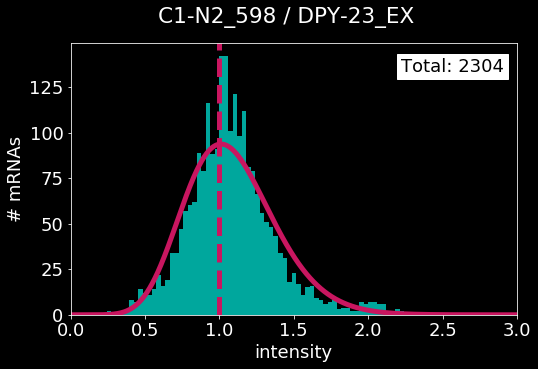

error: L1, L2 [3.9534464793836843, 7.849546909615066]
peak center: 1.0


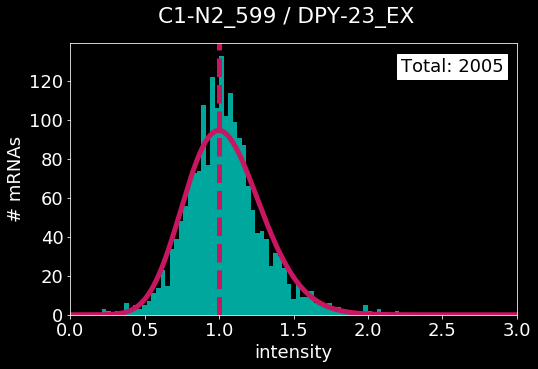

error: L1, L2 [6.4495336432576815, 10.197677632557175]
peak center: 1.0303030303030303


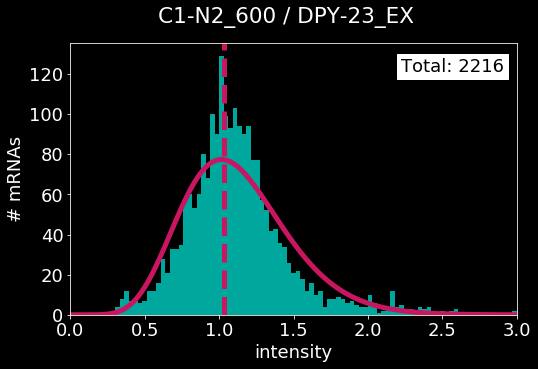

error: L1, L2 [3.3117082913973865, 5.555568378048807]
peak center: 1.0


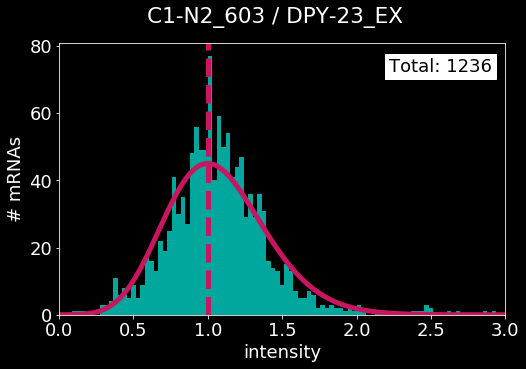

error: L1, L2 [3.7137025216026402, 7.037695566416936]
peak center: 1.0


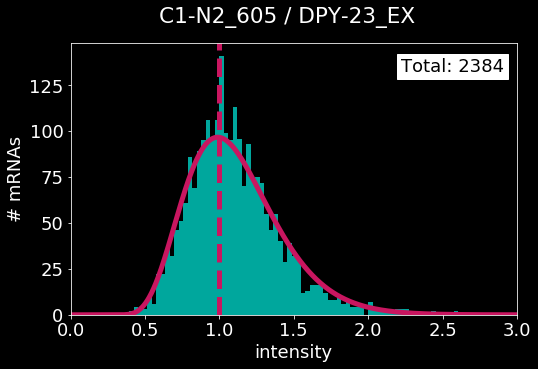

error: L1, L2 [3.279656199618466, 4.973036147407414]
peak center: 0.9696969696969697


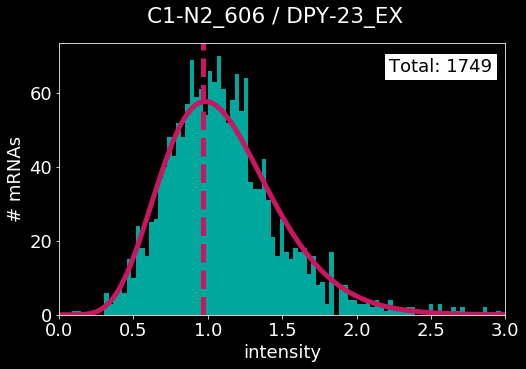

error: L1, L2 [2.1519190266059502, 3.5652879444830803]
peak center: 0.9393939393939394


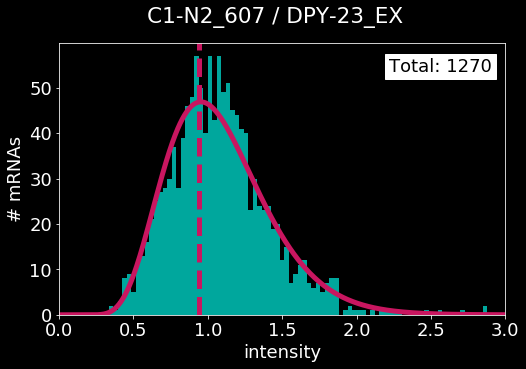

error: L1, L2 [4.799728385452261, 8.696155100772236]
peak center: 1.0


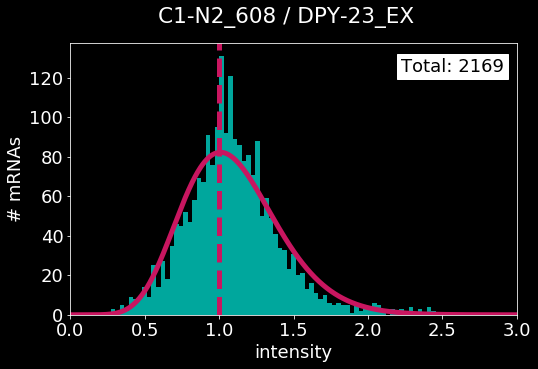

error: L1, L2 [18.32651236189863, 24.41736449603023]
peak center: 0.5757575757575758


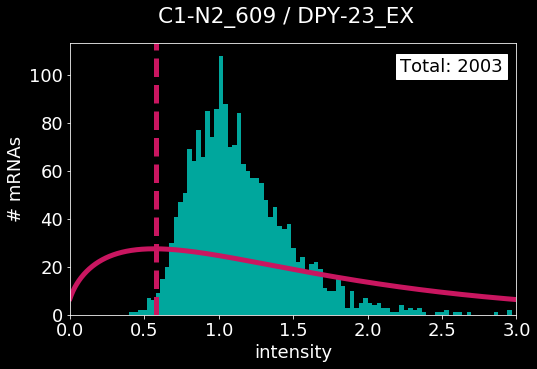

error: L1, L2 [3.0249941571194228, 5.625654163122673]
peak center: 1.0303030303030303


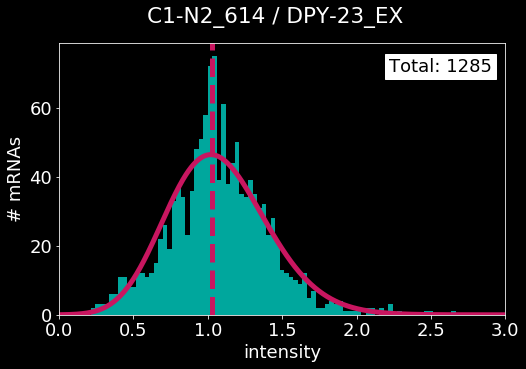

error: L1, L2 [3.1440537370400765, 6.127000734091265]
peak center: 1.0


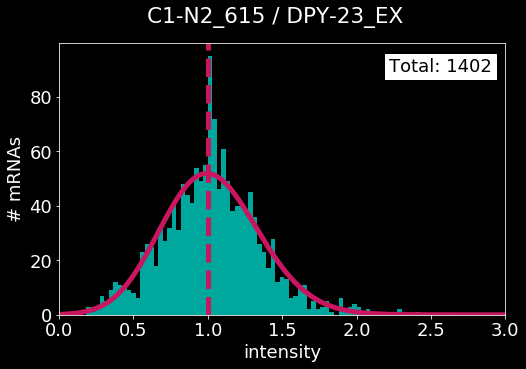

error: L1, L2 [5.297331611698813, 9.792510545006236]
peak center: 1.0


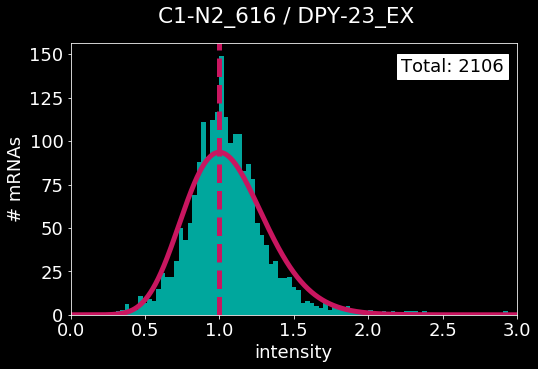

error: L1, L2 [3.690589901548996, 7.201690076619294]
peak center: 0.9696969696969697


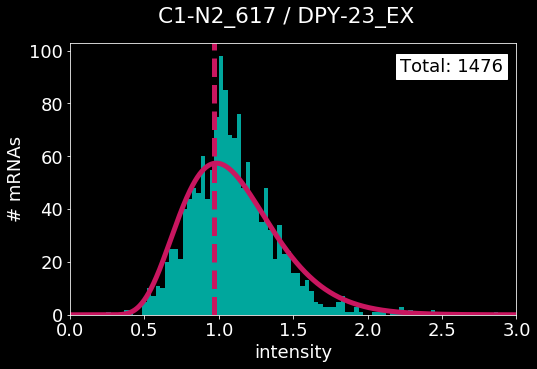

error: L1, L2 [2.977382869615036, 5.913182926196617]
peak center: 0.9696969696969697


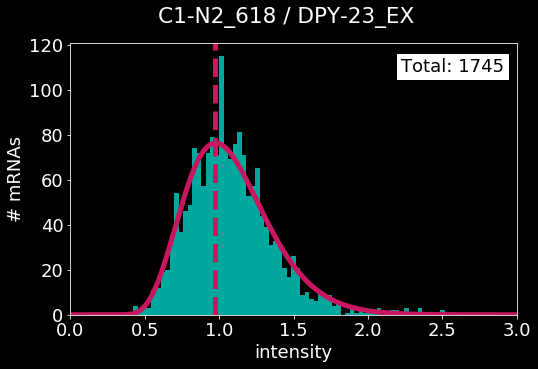

error: L1, L2 [9.487439617979485, 22.843326386108533]
peak center: 0.6363636363636364


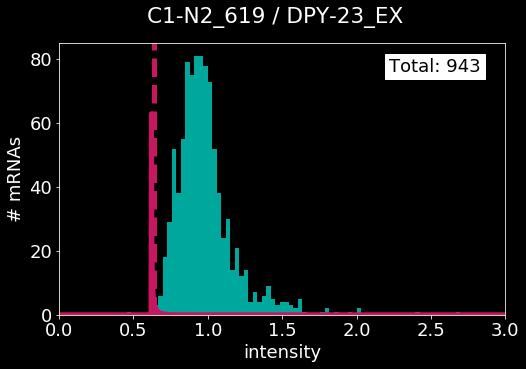

error: L1, L2 [2.4561616055575723, 4.230200199546818]
peak center: 1.0303030303030303


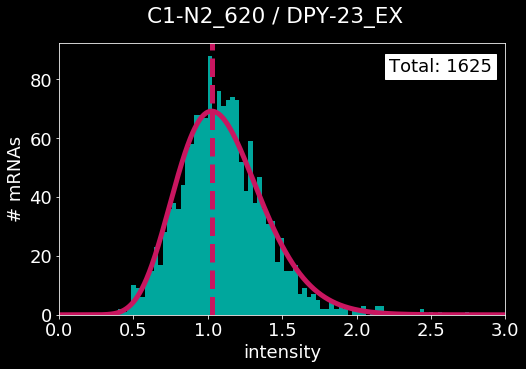

error: L1, L2 [5.234440213506669, 9.024547861657092]
peak center: 1.0303030303030303


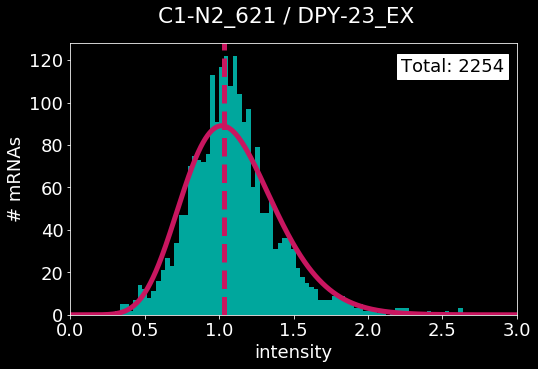

error: L1, L2 [2.7906564690370974, 5.107285613874395]
peak center: 0.9696969696969697


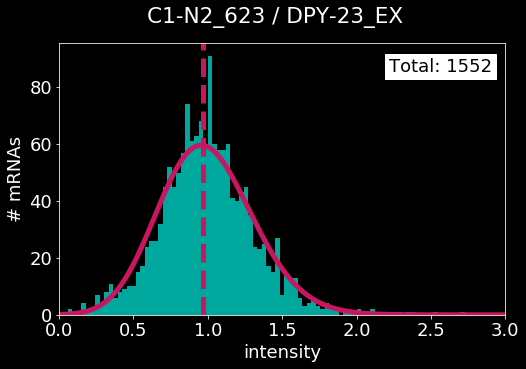

error: L1, L2 [3.8658314781509446, 6.854992496960343]
peak center: 0.9090909090909092


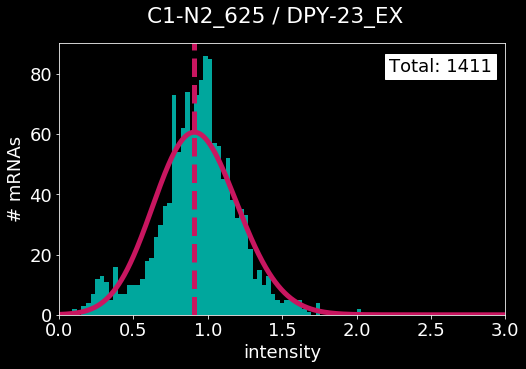

error: L1, L2 [4.371320014560338, 8.165503117477186]
peak center: 1.0303030303030303


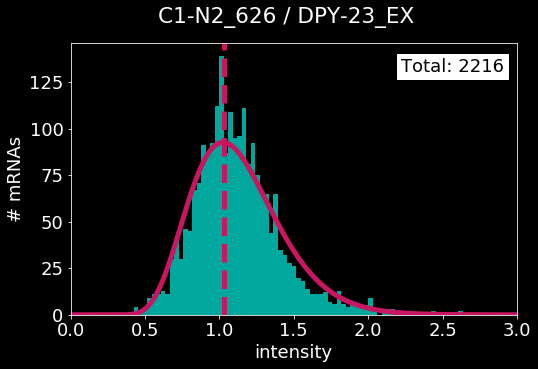

error: L1, L2 [1.7968998329150283, 3.415935294748671]
peak center: 0.9696969696969697


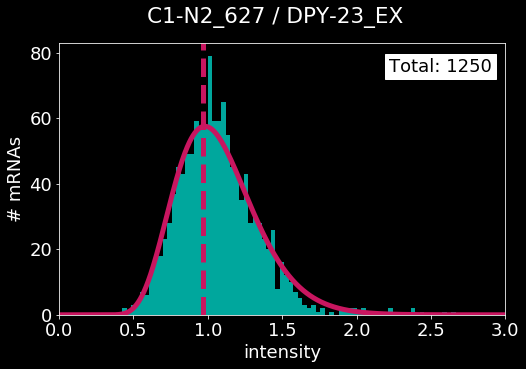

error: L1, L2 [3.9526656986091044, 8.112034910356803]
peak center: 1.0


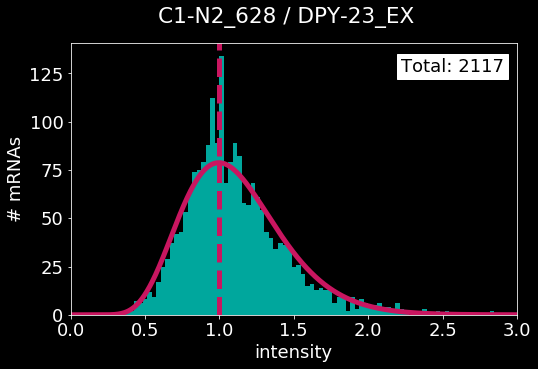

error: L1, L2 [2.168155606976154, 3.276154068020437]
peak center: 1.1212121212121213


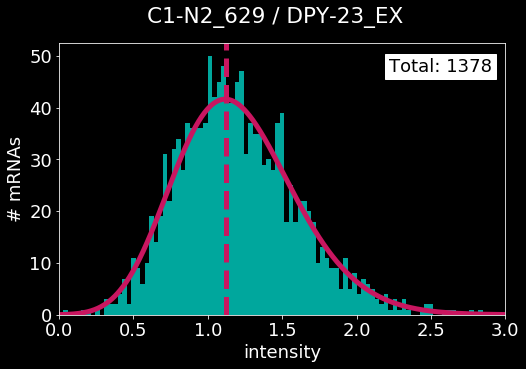

error: L1, L2 [2.792308697248245, 4.39271760611622]
peak center: 0.9696969696969697


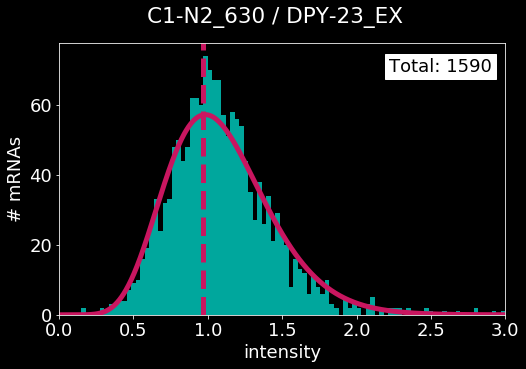

error: L1, L2 [2.54293048694772, 3.816808206707371]
peak center: 1.0303030303030303


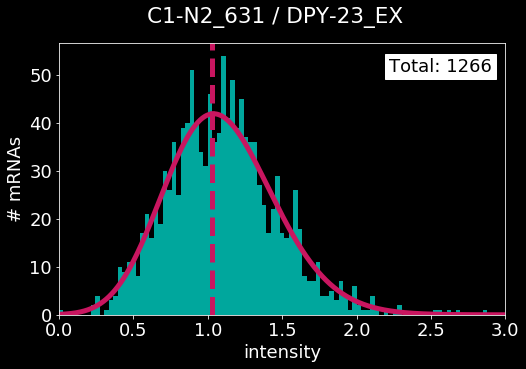

error: L1, L2 [3.9616811531317047, 8.196957355969232]
peak center: 0.9393939393939394


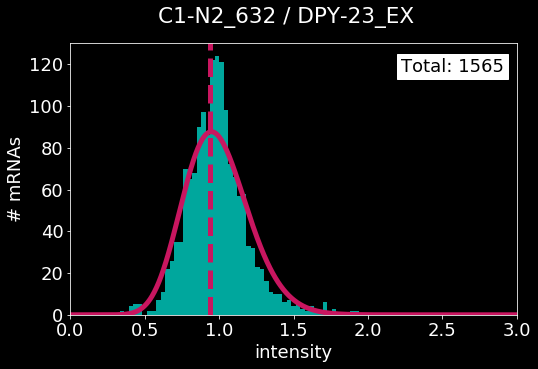

error: L1, L2 [5.524099448224434, 11.127163257845112]
peak center: 1.0


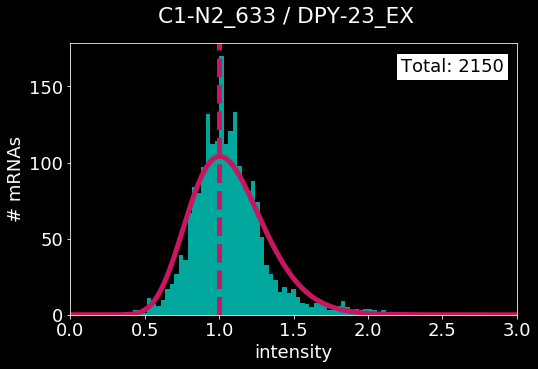

error: L1, L2 [5.081700638450709, 9.811965846500721]
peak center: 0.9393939393939394


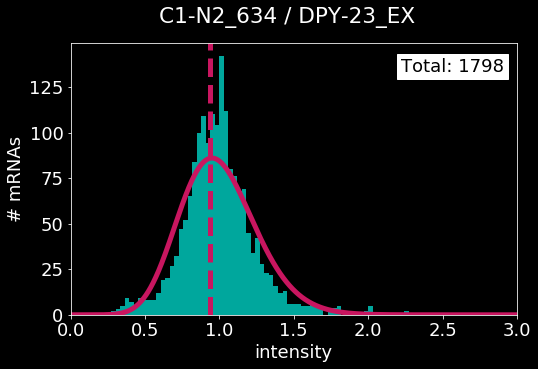

error: L1, L2 [2.880034787893786, 5.1305313476453165]
peak center: 0.9696969696969697


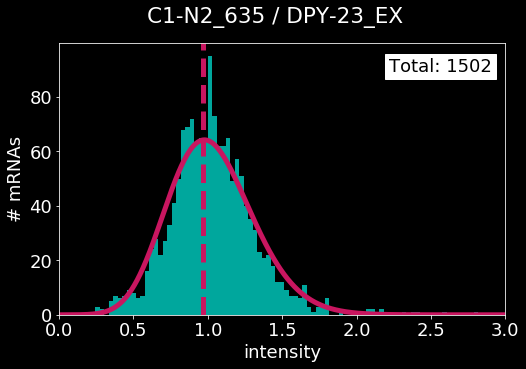

error: L1, L2 [3.203666117012699, 5.804828254189371]
peak center: 0.9696969696969697


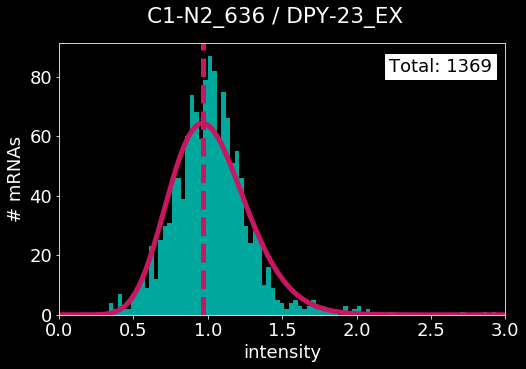

error: L1, L2 [2.668527728664921, 5.279611135553054]
peak center: 1.0


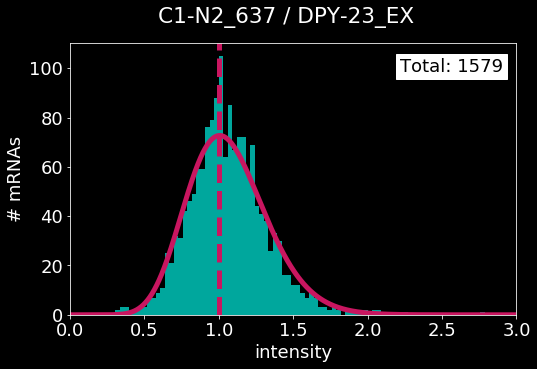

error: L1, L2 [3.4924570649579905, 7.176449276783828]
peak center: 0.9696969696969697


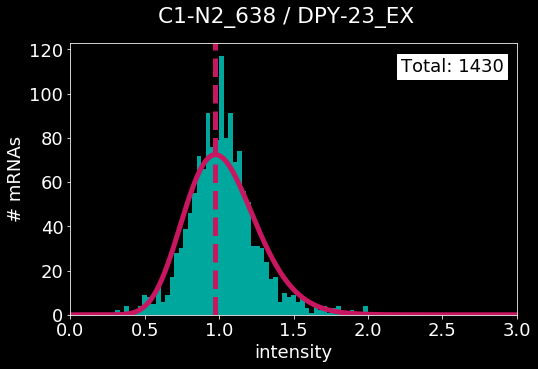

error: L1, L2 [6.056581889384288, 10.469991025625879]
peak center: 1.0


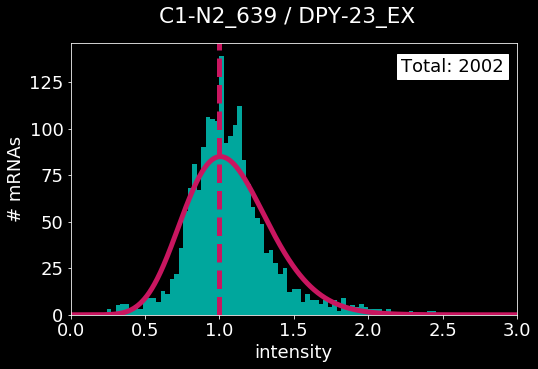

error: L1, L2 [3.8193254359446507, 7.5235276157162625]
peak center: 0.9696969696969697


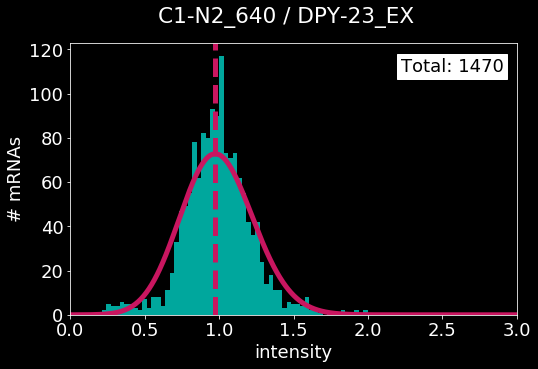

error: L1, L2 [8.221925339691326, 14.896104138656536]
peak center: 1.0


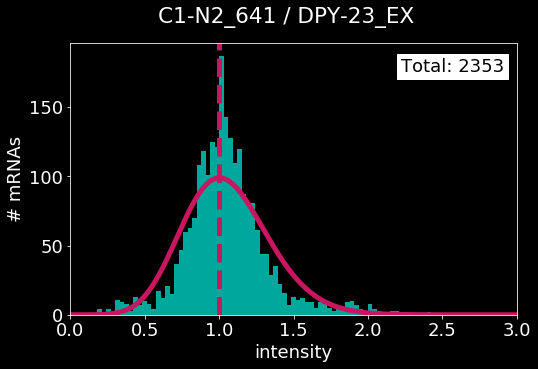

error: L1, L2 [33.72666481703558, 122.54342489527116]
peak center: 0.30303030303030304


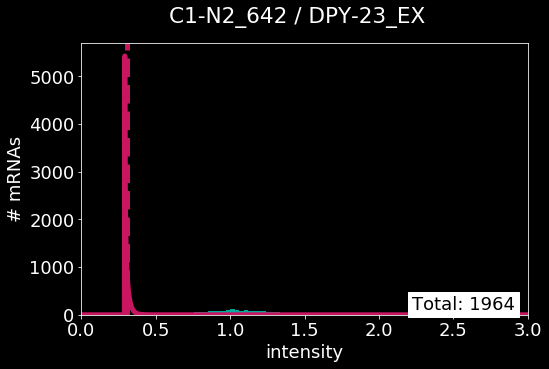

error: L1, L2 [4.126652680294352, 7.581717386761966]
peak center: 1.0


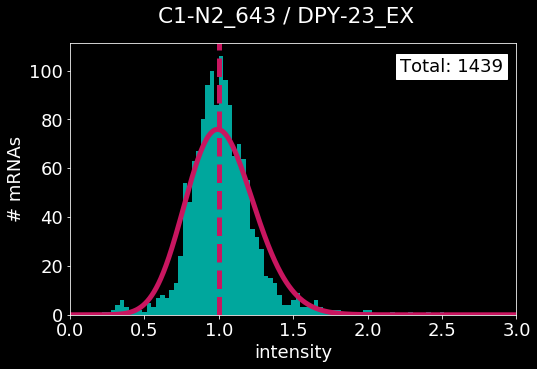

error: L1, L2 [3.9558235668101243, 7.827434415989498]
peak center: 0.9696969696969697


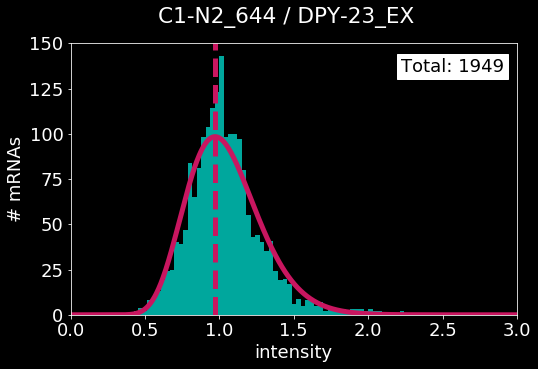

error: L1, L2 [2.3637865123850417, 4.068964672148093]
peak center: 0.9393939393939394


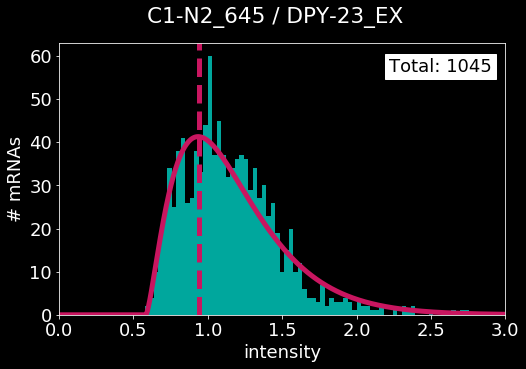

error: L1, L2 [7.882504190999958, 14.005138552560261]
peak center: 1.0


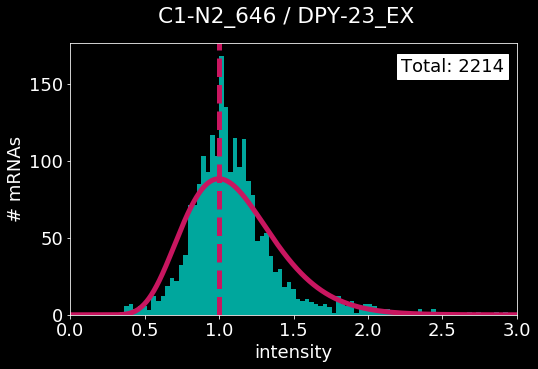

error: L1, L2 [3.508259895975362, 7.432516949037115]
peak center: 0.9090909090909092


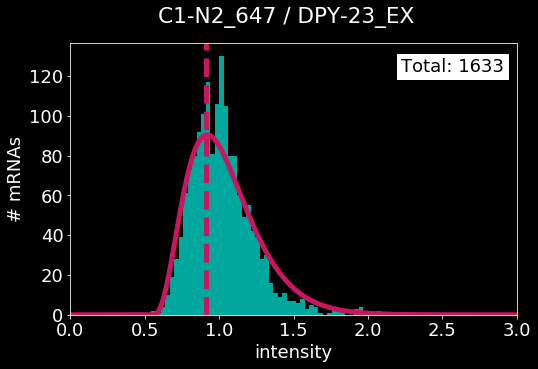

error: L1, L2 [4.58045183653395, 10.029357694846189]
peak center: 0.9696969696969697


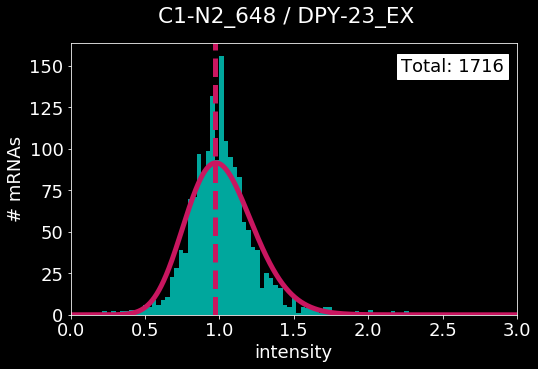

error: L1, L2 [5.4827111538036455, 11.473263168621095]
peak center: 0.9696969696969697


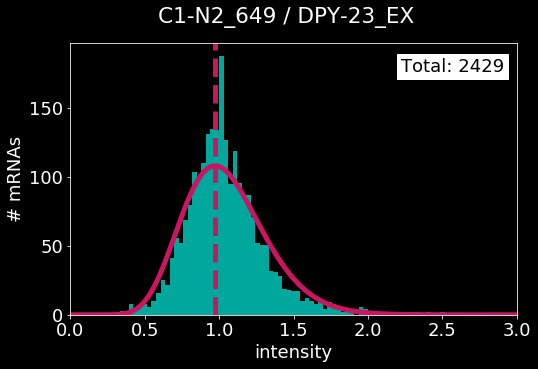

error: L1, L2 [3.0764229496316884, 6.20915979373506]
peak center: 0.9696969696969697


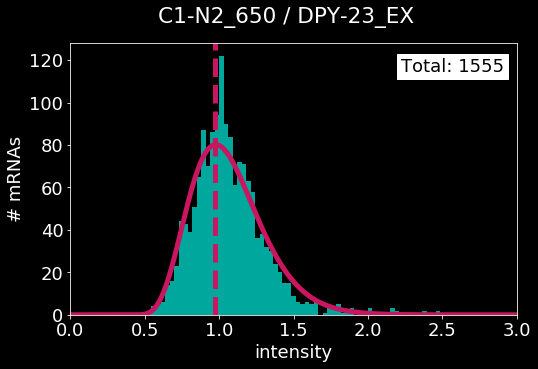

error: L1, L2 [5.805492591405413, 10.441427723740762]
peak center: 0.9393939393939394


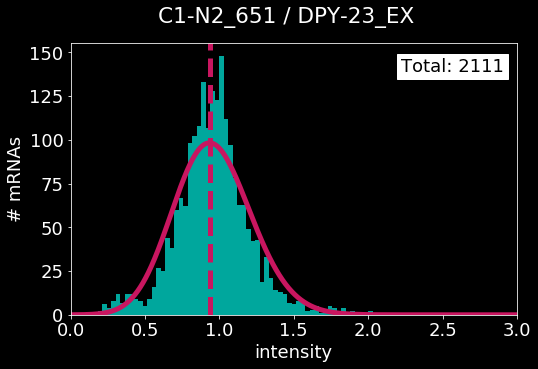

error: L1, L2 [3.740178024780591, 6.917125217934941]
peak center: 1.0


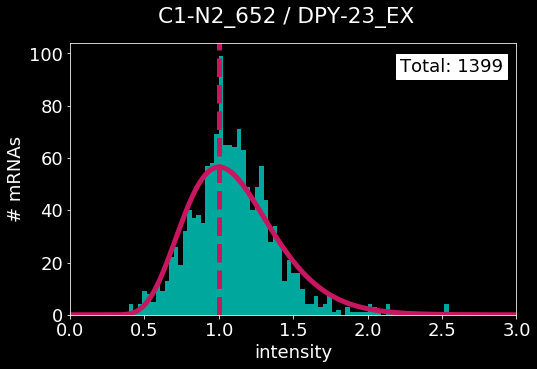

error: L1, L2 [5.376163041729929, 10.228399370617206]
peak center: 0.9696969696969697


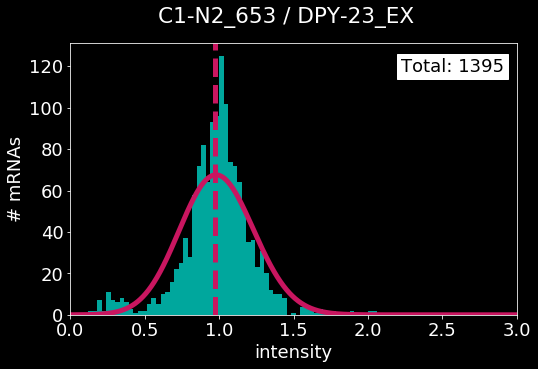

error: L1, L2 [3.2673967437399254, 6.3020192362792296]
peak center: 1.0


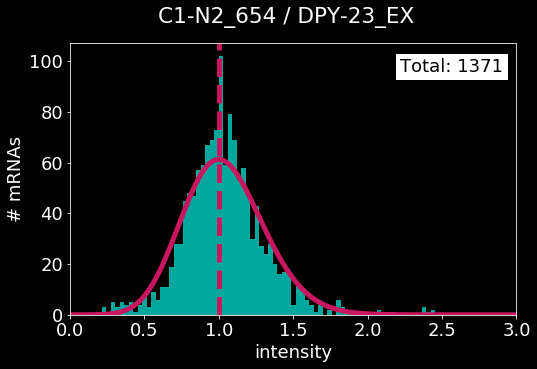

error: L1, L2 [3.1416227954985136, 5.58241443570992]
peak center: 1.0303030303030303


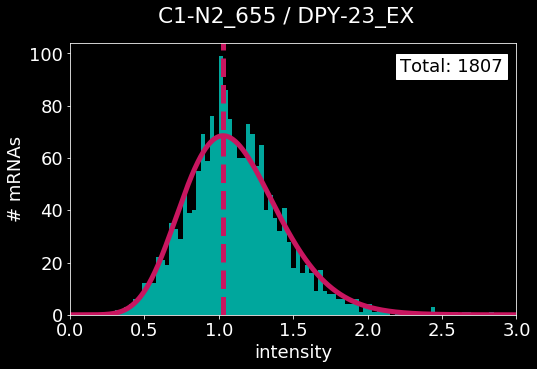

error: L1, L2 [9.753711180206068, 15.343416114372152]
peak center: 0.9393939393939394


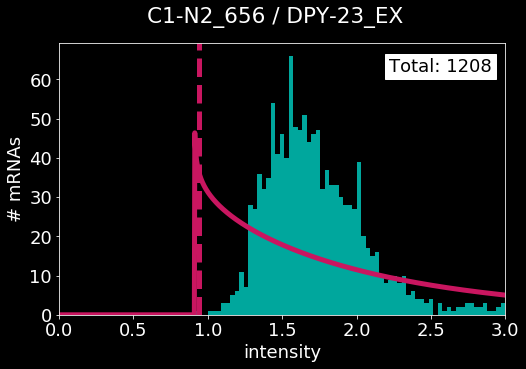

error: L1, L2 [5.263282061618859, 9.63048583997745]
peak center: 1.0303030303030303


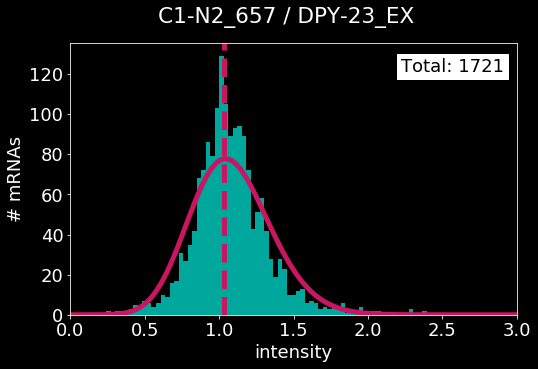

error: L1, L2 [2.5272134889018463, 5.519610472536572]
peak center: 0.9696969696969697


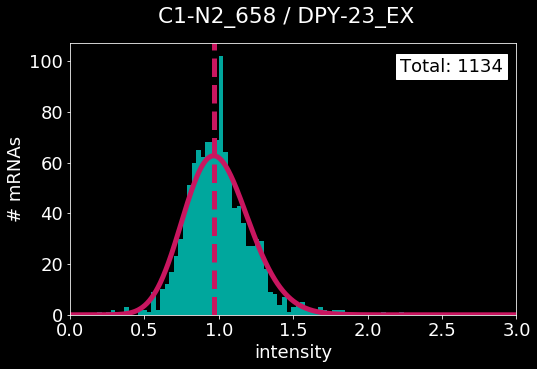

error: L1, L2 [2.9578217114315497, 5.6304320572221185]
peak center: 1.0


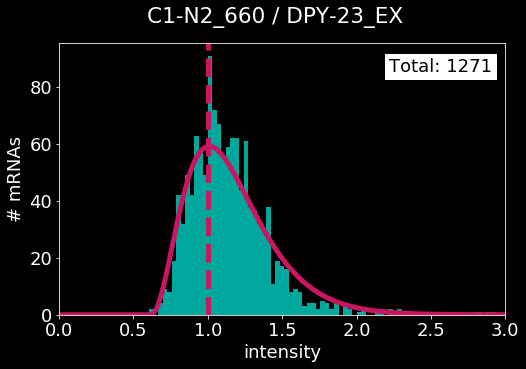

error: L1, L2 [3.5200302073224026, 7.7614344866686364]
peak center: 1.0303030303030303


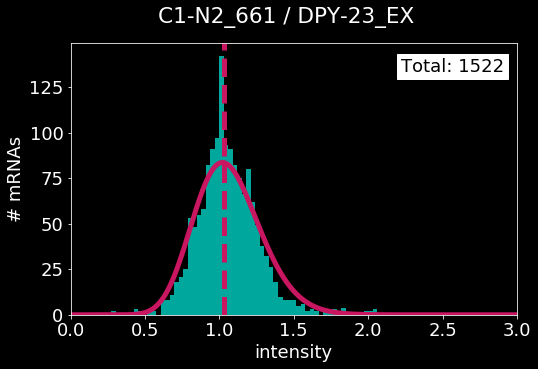

error: L1, L2 [3.5731145458596156, 6.263379666410413]
peak center: 1.0606060606060606


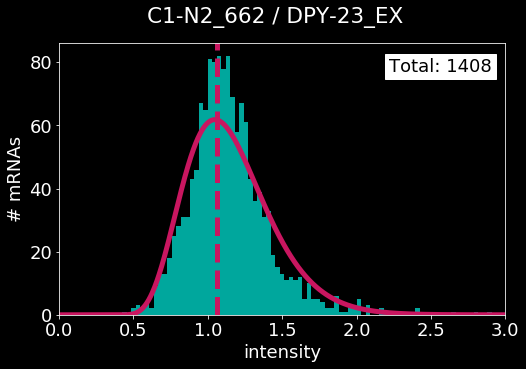

error: L1, L2 [2.662147521058588, 5.625010723000484]
peak center: 0.9696969696969697


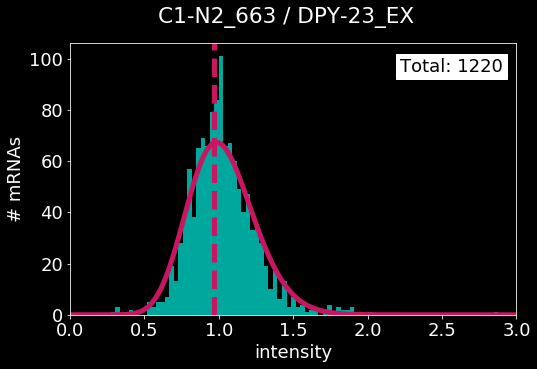

error: L1, L2 [3.498978355528199, 7.111998610183131]
peak center: 1.0303030303030303


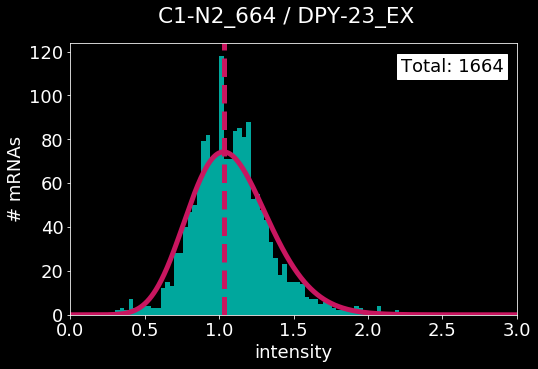

error: L1, L2 [3.2737562019596895, 5.835628219747865]
peak center: 1.0


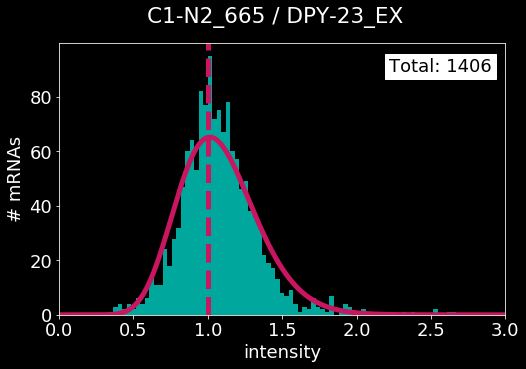

error: L1, L2 [3.2228836429682097, 6.850594508581286]
peak center: 0.9696969696969697


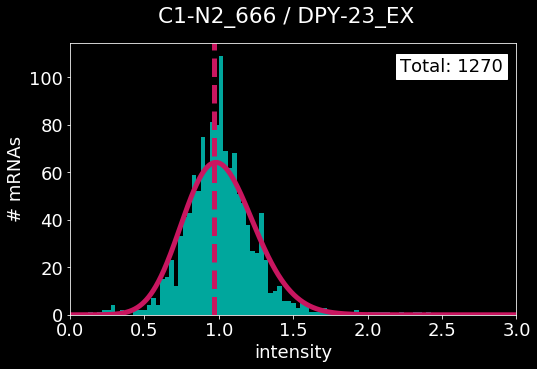

error: L1, L2 [3.2738965844694765, 7.457373541643117]
peak center: 1.0


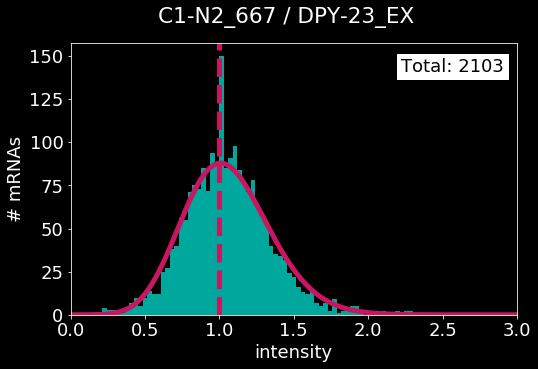

error: L1, L2 [4.949167677654636, 10.263102521666882]
peak center: 1.0


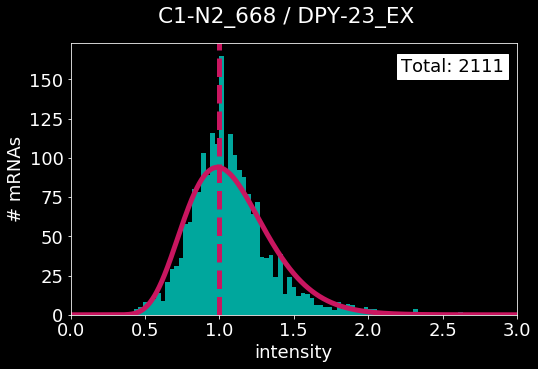

error: L1, L2 [4.429422493973119, 7.989645760623712]
peak center: 1.0303030303030303


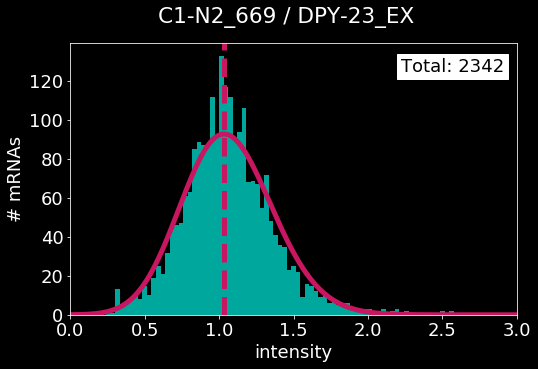

error: L1, L2 [3.671372715544825, 7.027899164854988]
peak center: 1.0


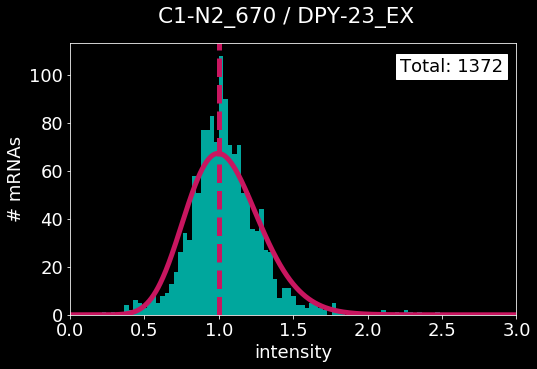

error: L1, L2 [2.909251855195494, 5.563305838610876]
peak center: 0.9696969696969697


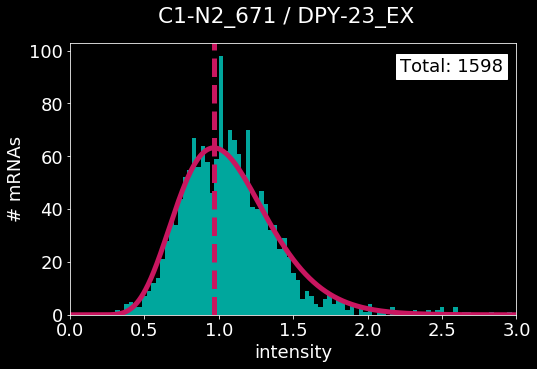

error: L1, L2 [3.78121749016433, 6.267547487531333]
peak center: 0.9696969696969697


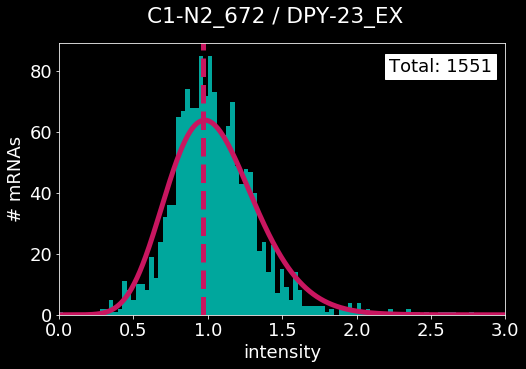

error: L1, L2 [3.354860082624119, 6.257965811515714]
peak center: 0.9090909090909092


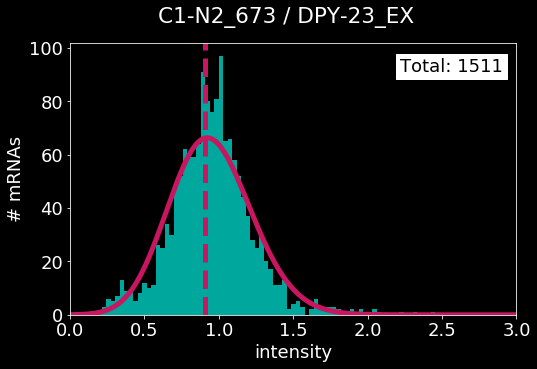

error: L1, L2 [4.641060425185154, 7.59960349757791]
peak center: 1.1212121212121213


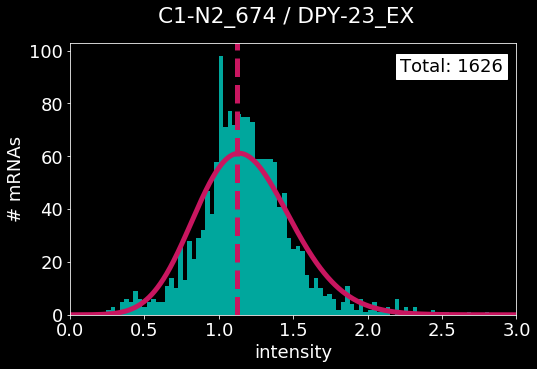

error: L1, L2 [4.060039867394736, 7.2086771787625725]
peak center: 0.9696969696969697


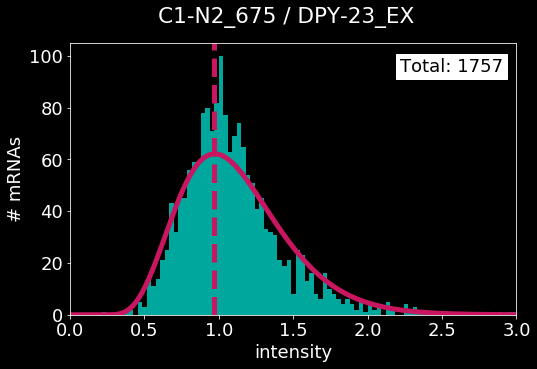

error: L1, L2 [3.3107113289207897, 5.892035689269023]
peak center: 1.0


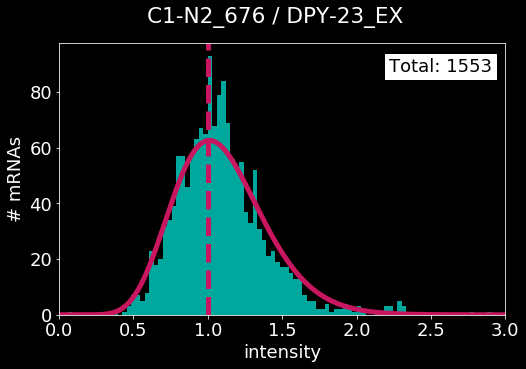

error: L1, L2 [6.231743372507567, 11.728358949149934]
peak center: 0.9696969696969697


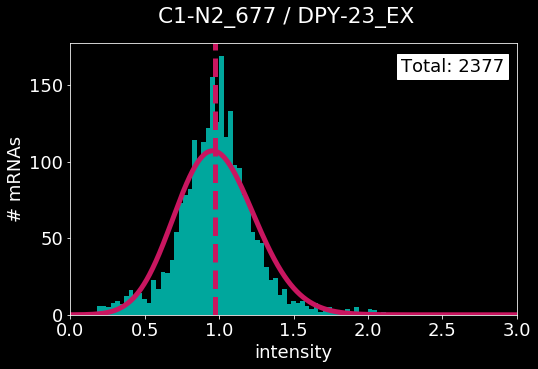

error: L1, L2 [3.5891443220850054, 6.358649448103301]
peak center: 0.9696969696969697


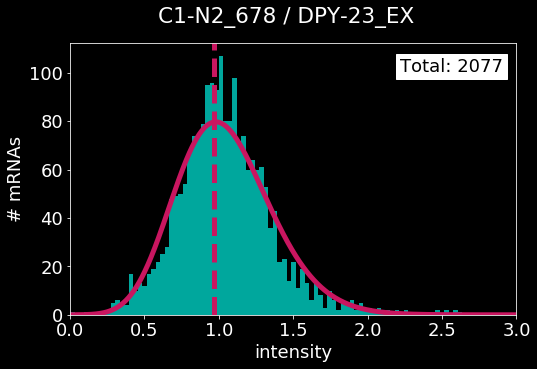

error: L1, L2 [4.872587689445535, 8.591494260397297]
peak center: 0.9393939393939394


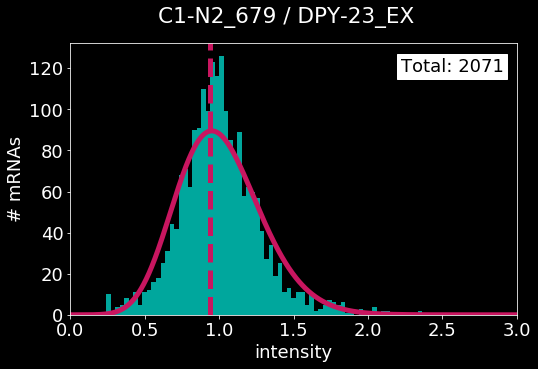

error: L1, L2 [5.722938830607679, 10.861137025845592]
peak center: 0.9393939393939394


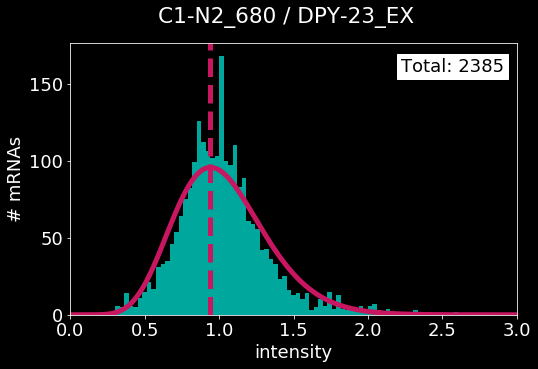

error: L1, L2 [2.865758405758934, 5.738398526583683]
peak center: 3.0


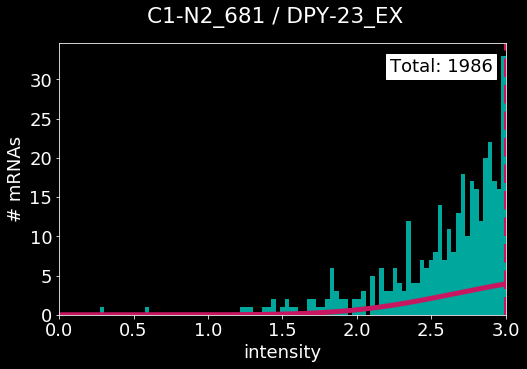

error: L1, L2 [2.6664723439470106, 4.6102369455693655]
peak center: 1.0303030303030303


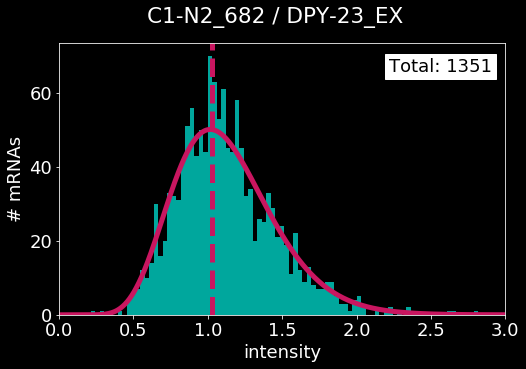

error: L1, L2 [4.451532125998831, 8.182462030681428]
peak center: 0.9090909090909092


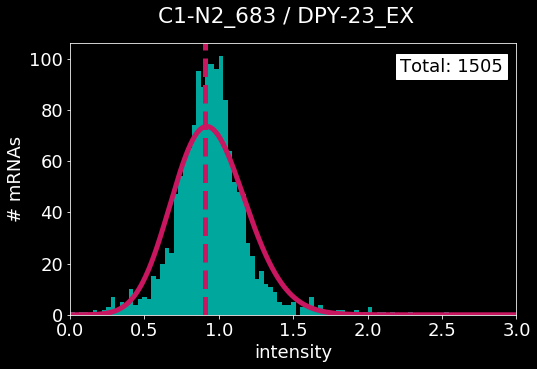

error: L1, L2 [6.107543070064336, 11.882950542877468]
peak center: 1.0


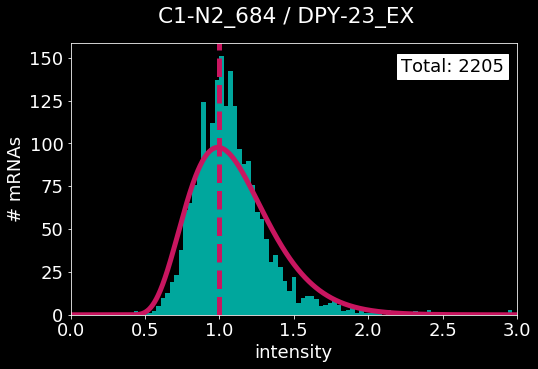

error: L1, L2 [3.4379825895336538, 6.952728067536507]
peak center: 0.9696969696969697


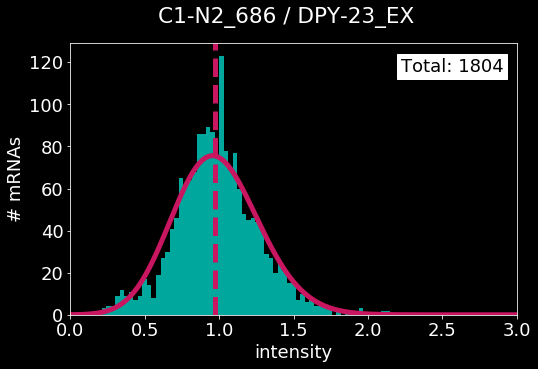

error: L1, L2 [2.2878283439429015, 4.646343584589149]
peak center: 1.0303030303030303


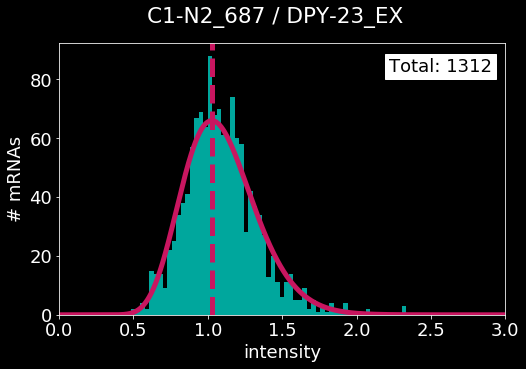

error: L1, L2 [3.4649567440635227, 5.717585189339387]
peak center: 1.1818181818181819


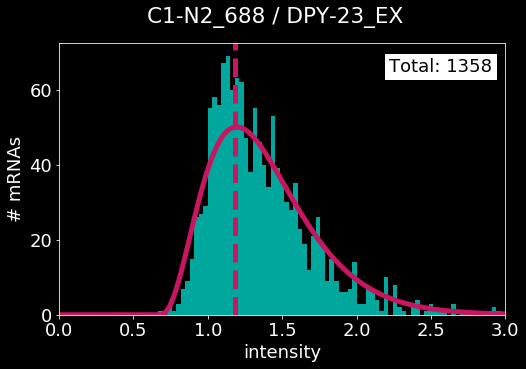

error: L1, L2 [2.6739876727792287, 5.362662882480356]
peak center: 1.0303030303030303


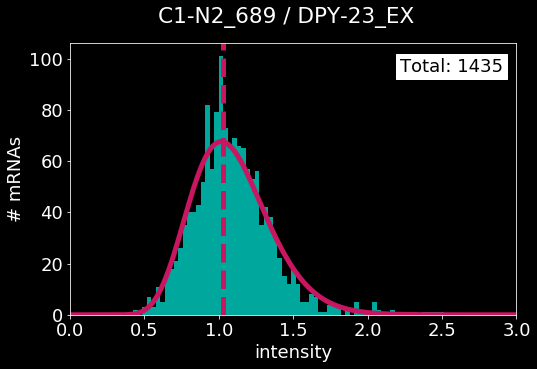

error: L1, L2 [3.2805745894292944, 6.260448363380291]
peak center: 1.0303030303030303


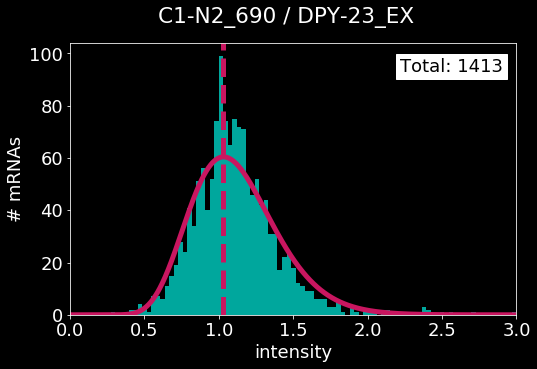

error: L1, L2 [2.8663484431344974, 5.203385780409971]
peak center: 0.9696969696969697


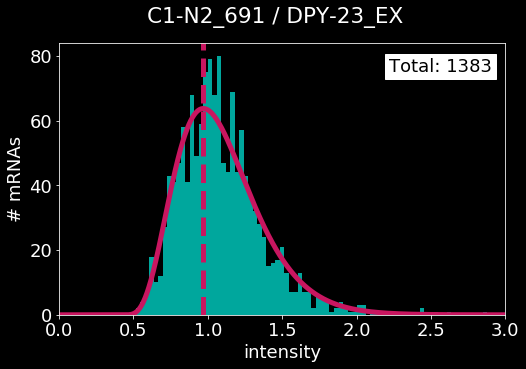

error: L1, L2 [2.6230330851166435, 5.112376472119967]
peak center: 1.0


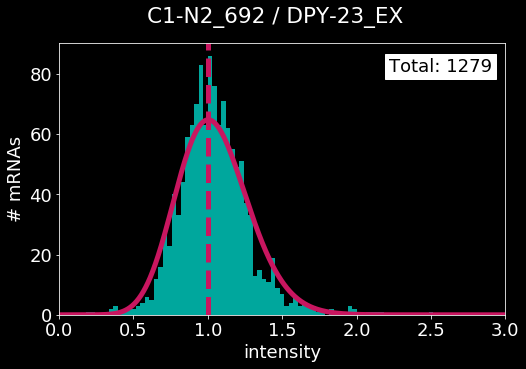

error: L1, L2 [1.8889831652137954, 4.044369873666839]
peak center: 0.9393939393939394


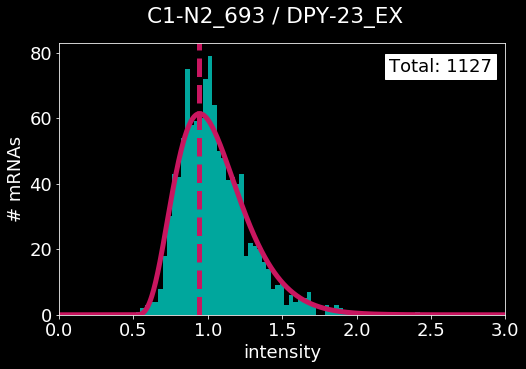

error: L1, L2 [8.252358025814225, 15.947810760680223]
peak center: 0.9696969696969697


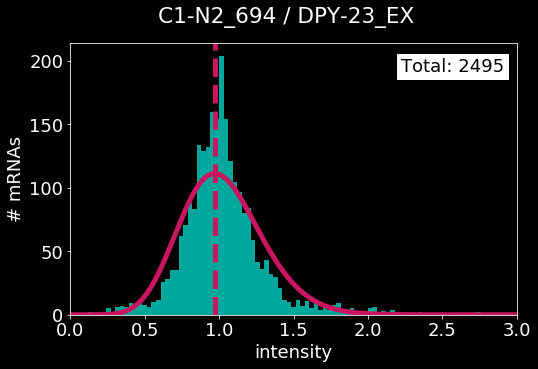

error: L1, L2 [4.587777072396157, 8.857808581770776]
peak center: 1.0


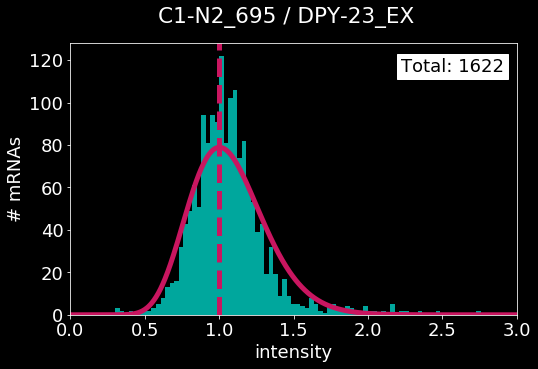

error: L1, L2 [2.7965895777569005, 4.894097729008027]
peak center: 1.0


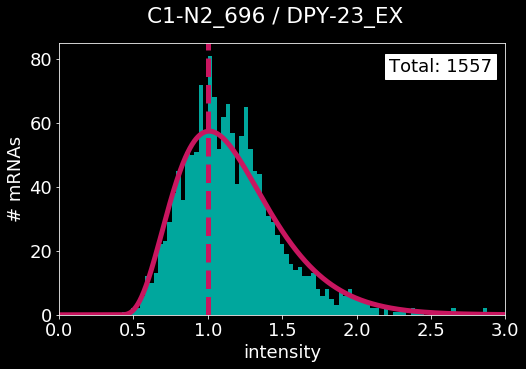

error: L1, L2 [5.394080738565153, 9.681370316037254]
peak center: 1.0


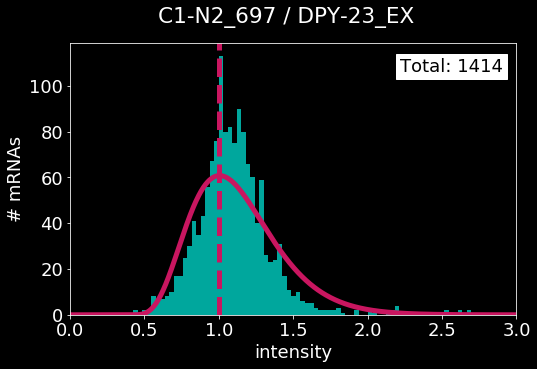

error: L1, L2 [4.297680075548901, 7.690325975930778]
peak center: 1.0


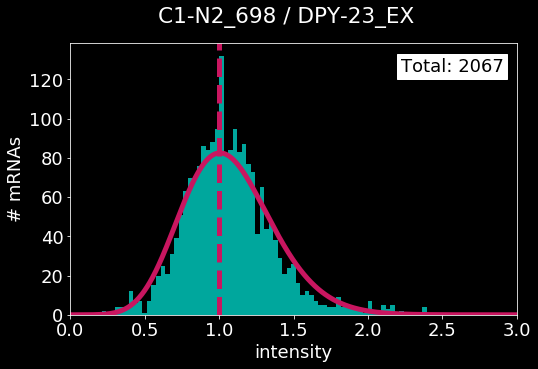

error: L1, L2 [4.24004750351249, 7.876746786413104]
peak center: 1.0


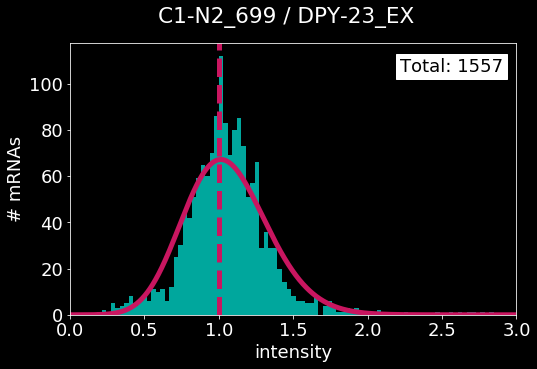

error: L1, L2 [3.777390668703443, 7.215044017194305]
peak center: 1.0


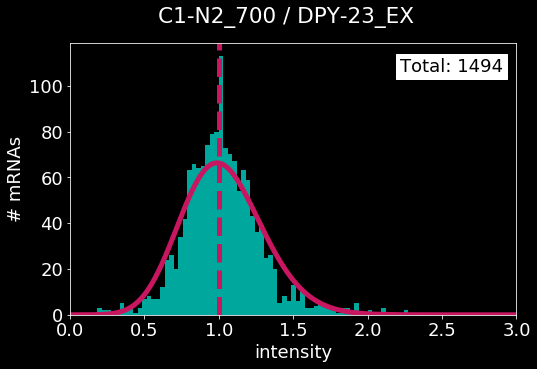

error: L1, L2 [3.827225050233935, 7.483515406155703]
peak center: 1.0


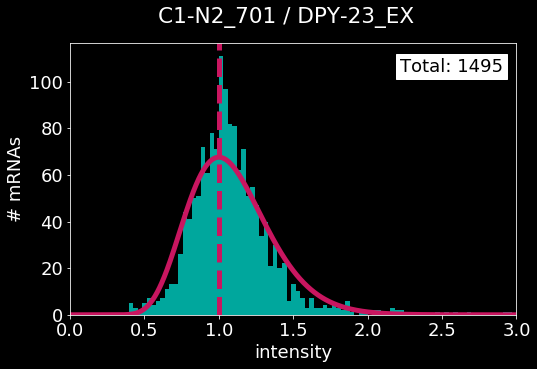

error: L1, L2 [3.7205122150307024, 7.5977228700782184]
peak center: 1.0303030303030303


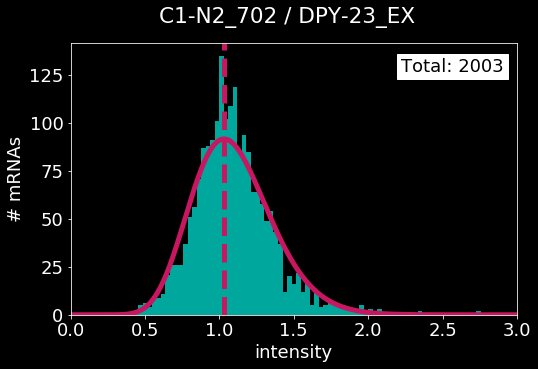

error: L1, L2 [3.2155559530094924, 6.236536481720349]
peak center: 0.9393939393939394


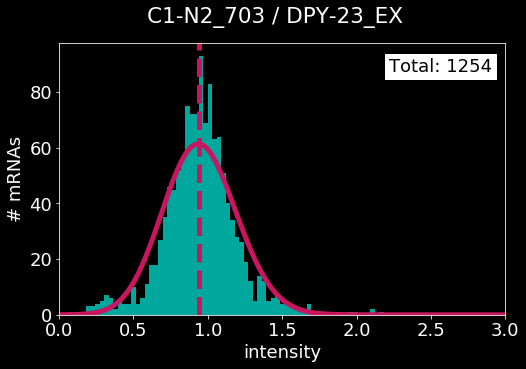

error: L1, L2 [3.199104759727745, 6.268334219810293]
peak center: 1.0303030303030303


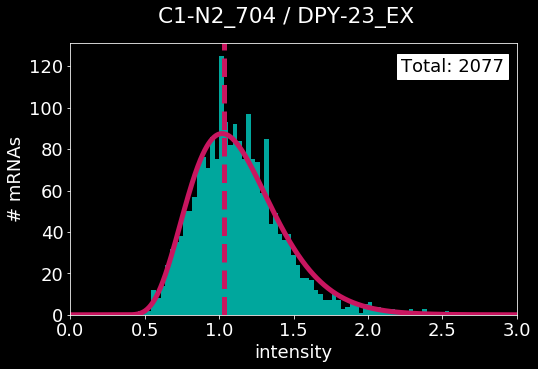

error: L1, L2 [5.630989982483138, 12.370033762449873]
peak center: 0.9696969696969697


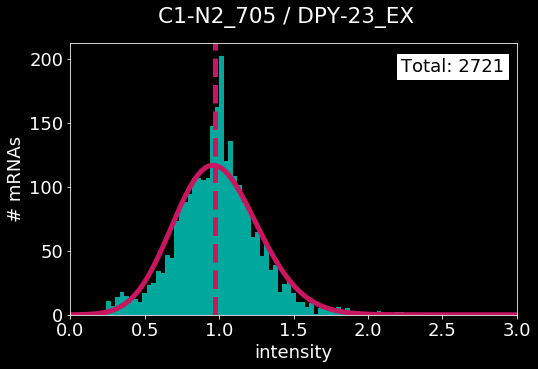

error: L1, L2 [4.0520982779487635, 8.639456310633914]
peak center: 1.0


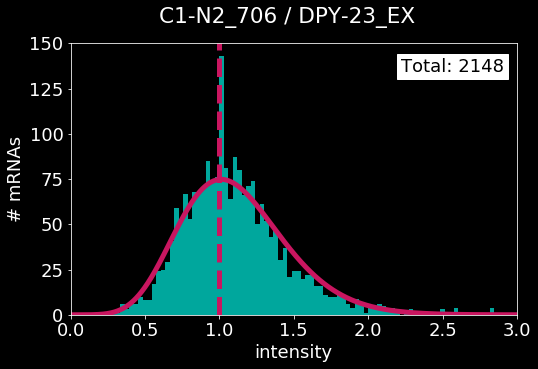

error: L1, L2 [3.812996910475922, 7.361220672596851]
peak center: 0.8787878787878788


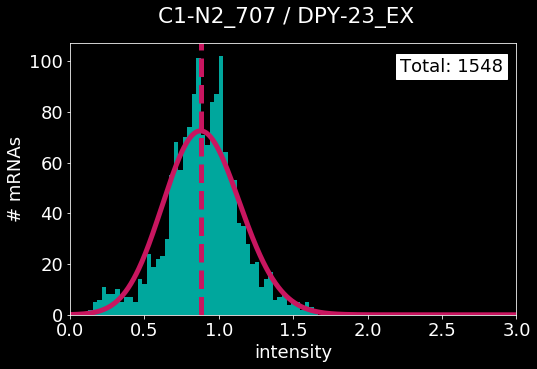

error: L1, L2 [3.2008520082687353, 6.308012300407251]
peak center: 1.0


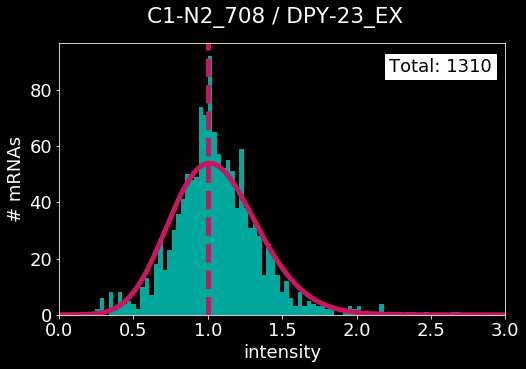

error: L1, L2 [3.4972569124660575, 6.661549708393894]
peak center: 1.0303030303030303


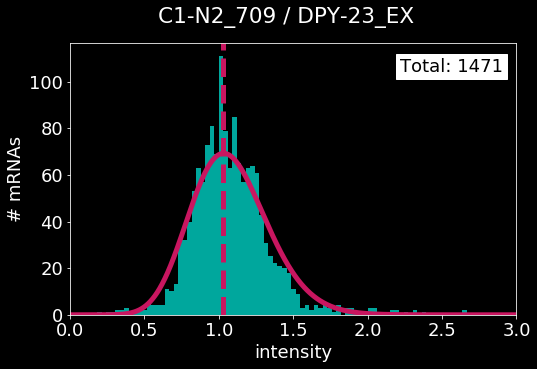

error: L1, L2 [2.835413539099319, 6.228810608714757]
peak center: 1.0


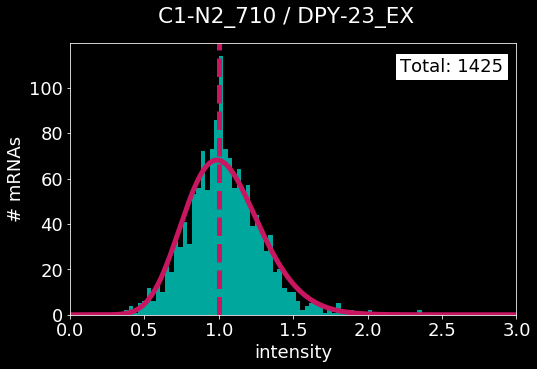

error: L1, L2 [3.630543284071738, 6.922849953519766]
peak center: 1.0303030303030303


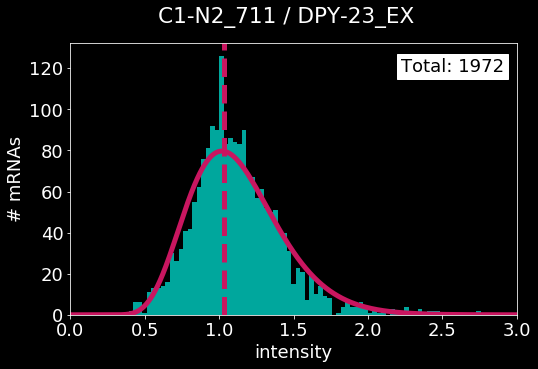

error: L1, L2 [22.933141651223252, 44.272925222796715]
peak center: 0.06060606060606061


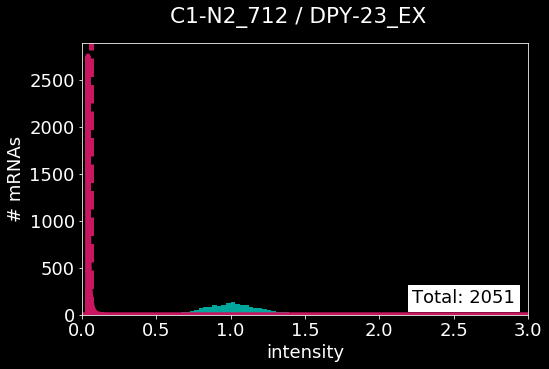

error: L1, L2 [5.321138089265894, 9.286737328780033]
peak center: 1.0


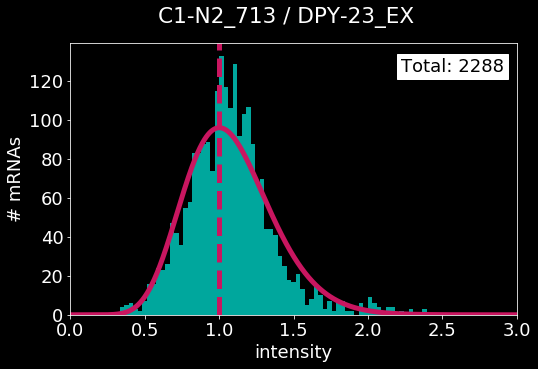

error: L1, L2 [7.268401441561761, 12.0642371848354]
peak center: 1.0


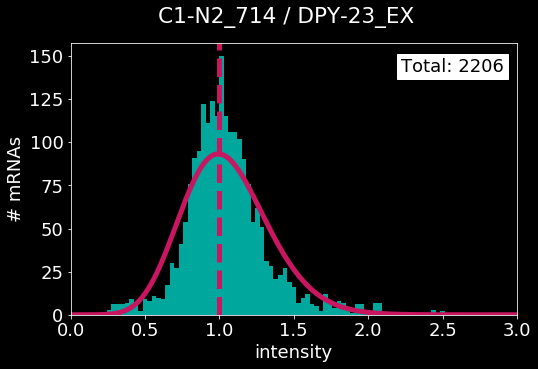

error: L1, L2 [2.9228559272454366, 5.676805124597962]
peak center: 1.0


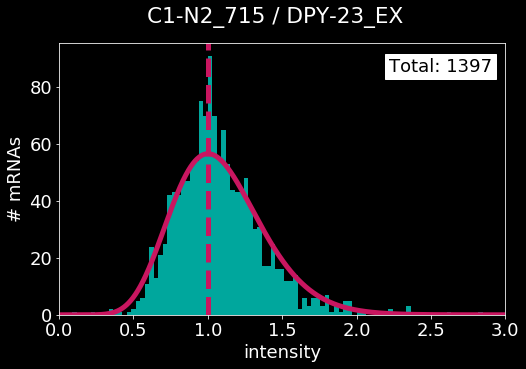

error: L1, L2 [3.321445796707967, 6.2120860151789685]
peak center: 1.0


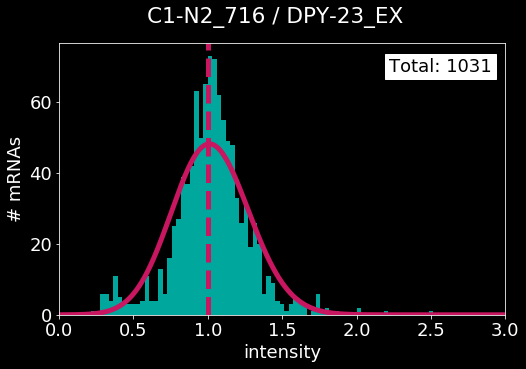

error: L1, L2 [3.3245679130444223, 7.941774263377532]
peak center: 1.0


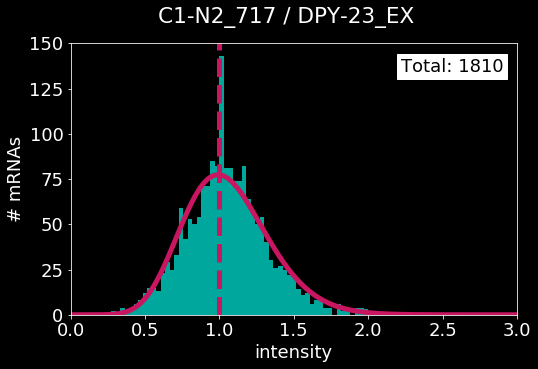

error: L1, L2 [3.8302358845616693, 5.300377293822137]
peak center: 1.0303030303030303


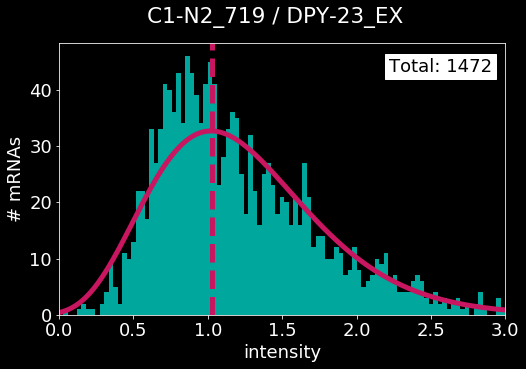

error: L1, L2 [6.6727616206668445, 11.750289701709807]
peak center: 0.9696969696969697


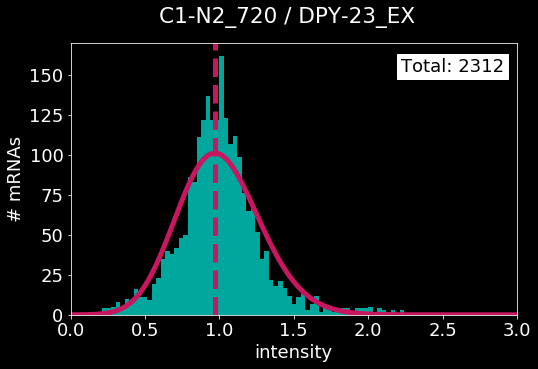

error: L1, L2 [2.439101348913818, 4.806867881696595]
peak center: 1.0


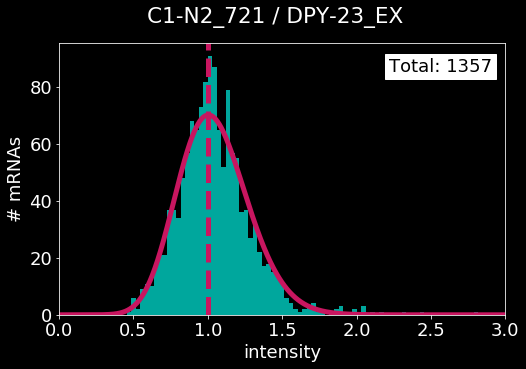

error: L1, L2 [15.229372220340936, 23.668823981105238]
peak center: 0.5151515151515151


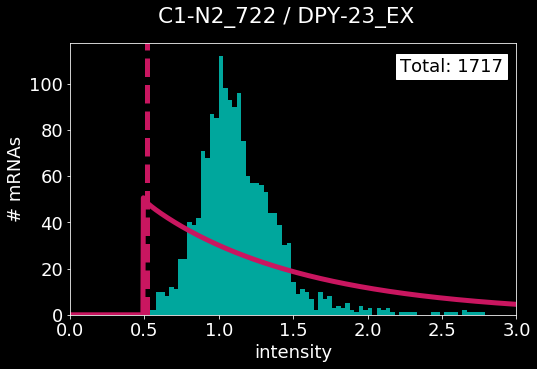

error: L1, L2 [5.630799485682273, 9.781754547544022]
peak center: 1.0


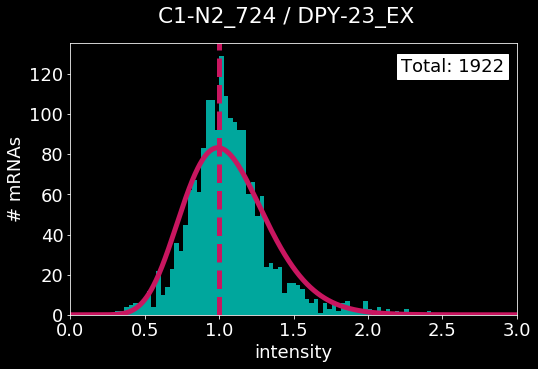

error: L1, L2 [2.3856562319485097, 5.059920386145621]
peak center: 1.0303030303030303


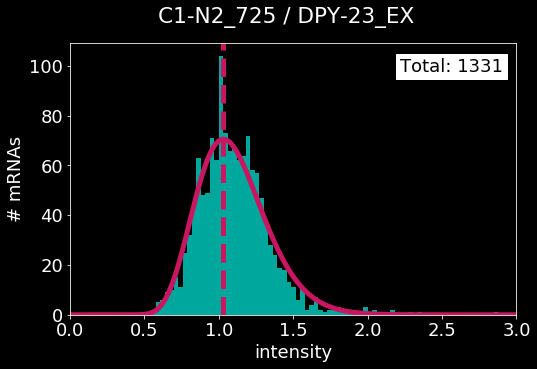

error: L1, L2 [3.3128872856877054, 5.643754299967305]
peak center: 0.9090909090909092


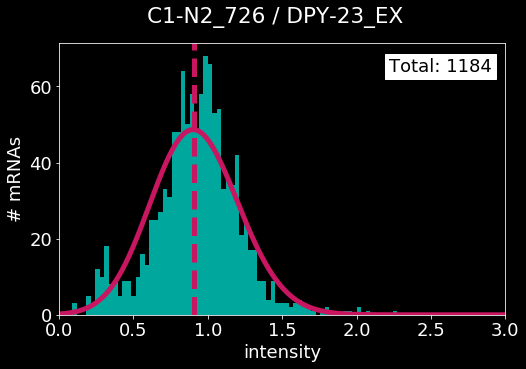

error: L1, L2 [4.2077845607640585, 8.297231905192746]
peak center: 0.9696969696969697


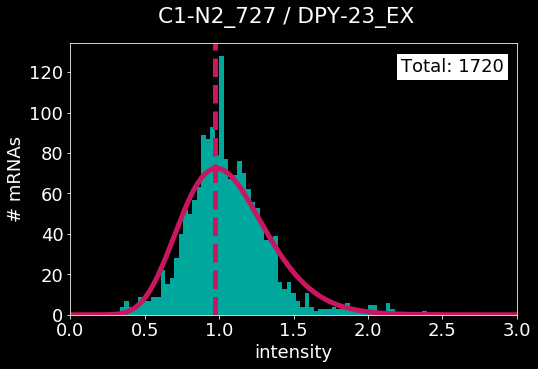

error: L1, L2 [3.024072673318785, 6.276698933377263]
peak center: 0.9696969696969697


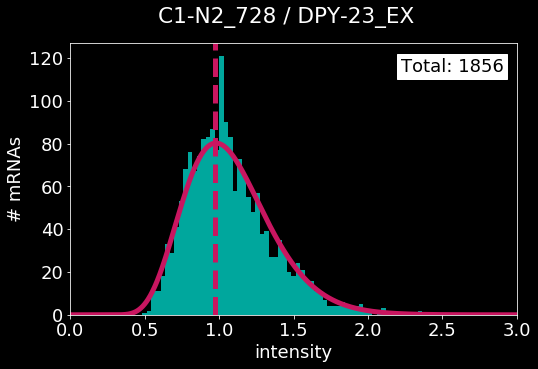

error: L1, L2 [2.5996211434417154, 4.513448554497682]
peak center: 1.0303030303030303


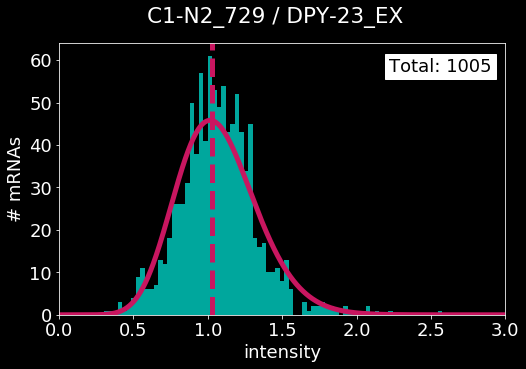

error: L1, L2 [5.185182763642482, 10.105147148677515]
peak center: 1.0


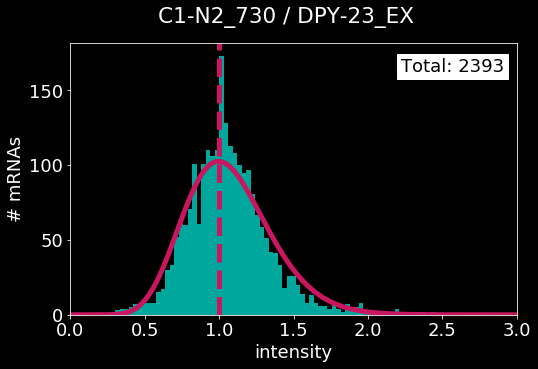

error: L1, L2 [5.145377484899193, 9.729869061267294]
peak center: 1.0


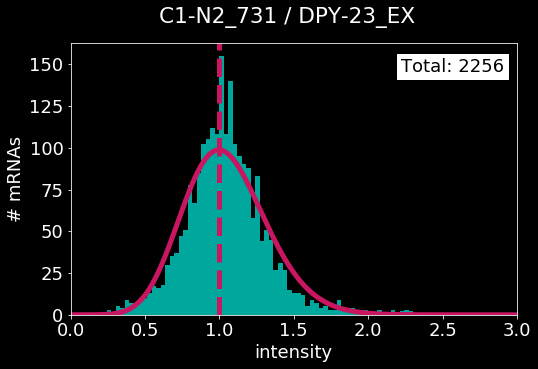

error: L1, L2 [2.4758294062775192, 4.984080385572672]
peak center: 1.0


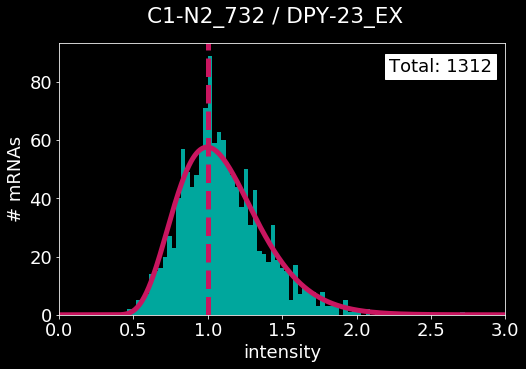

error: L1, L2 [3.6386010061902523, 7.885658255782351]
peak center: 0.8181818181818182


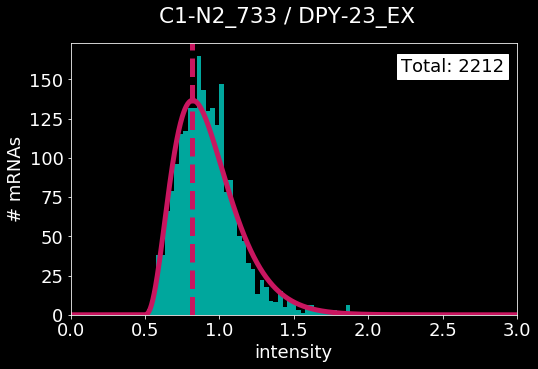

error: L1, L2 [4.185005211717811, 8.677089601884301]
peak center: 1.0


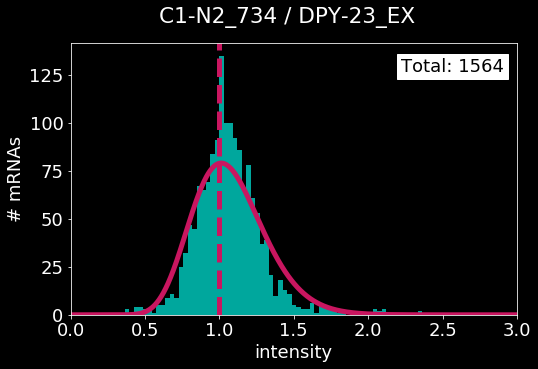

error: L1, L2 [13.646124368812409, 30.458120211777416]
peak center: 0.6666666666666667


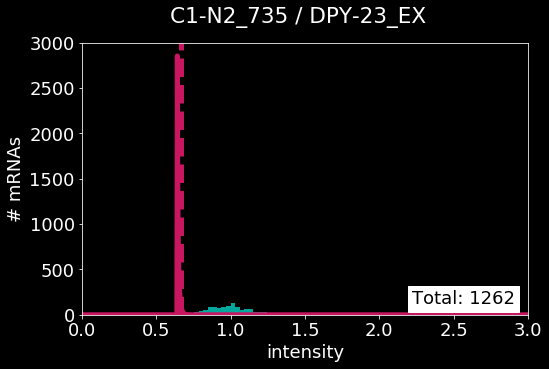

error: L1, L2 [3.8765067857620146, 7.438679148118105]
peak center: 1.0


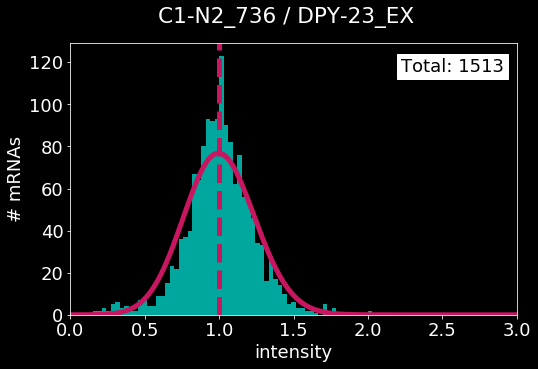

error: L1, L2 [6.042992345215214, 10.510994800842028]
peak center: 1.1212121212121213


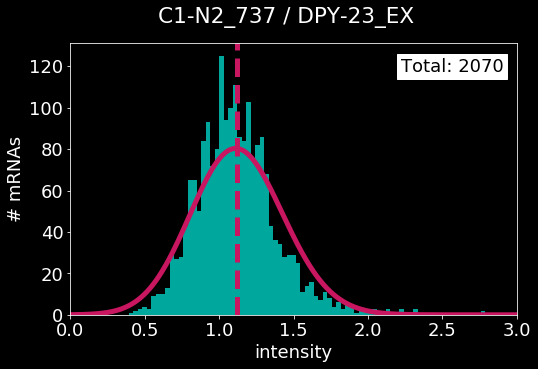

error: L1, L2 [3.381920271743393, 6.157178745680174]
peak center: 1.0303030303030303


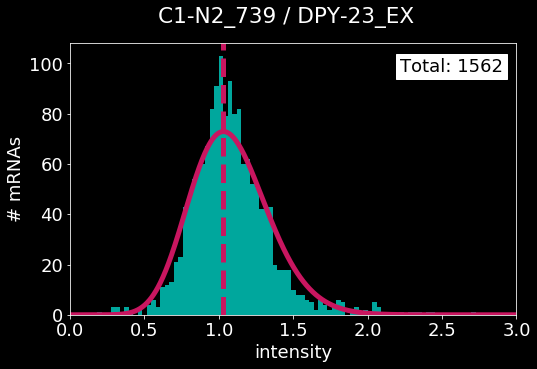

error: L1, L2 [4.616267722554762, 7.578029304466757]
peak center: 0.9696969696969697


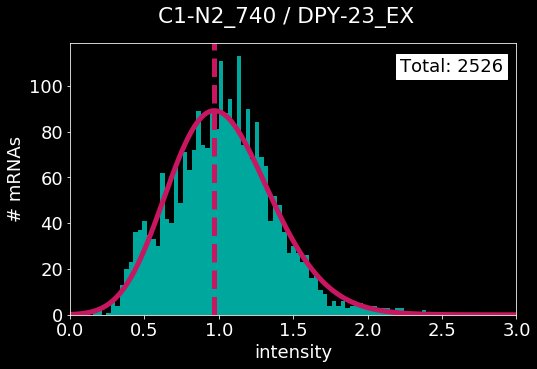

error: L1, L2 [3.3276177411006076, 5.695775293735833]
peak center: 1.0


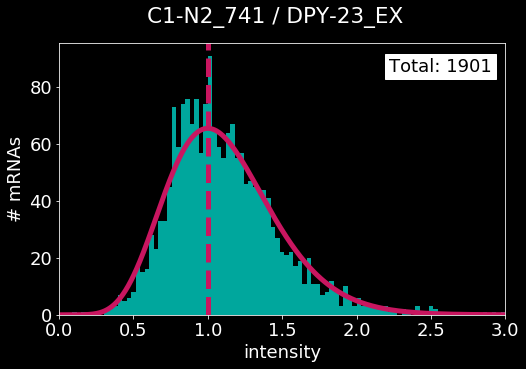

error: L1, L2 [3.7946405373429553, 7.875836476322152]
peak center: 1.0


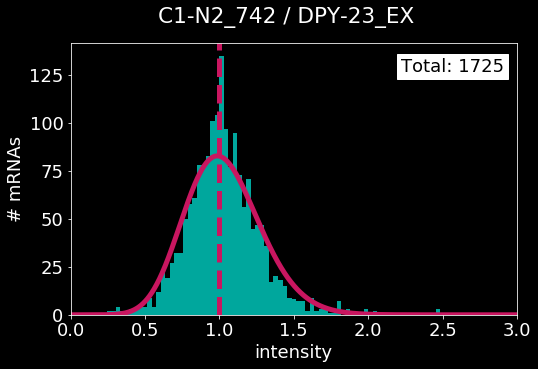

error: L1, L2 [3.711309752338776, 7.111582145224291]
peak center: 1.0


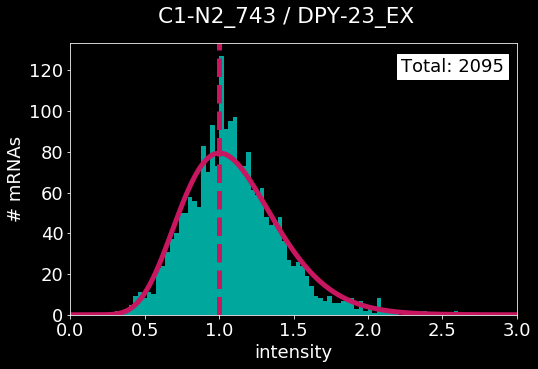

error: L1, L2 [5.345020868597761, 10.03199681924718]
peak center: 1.0


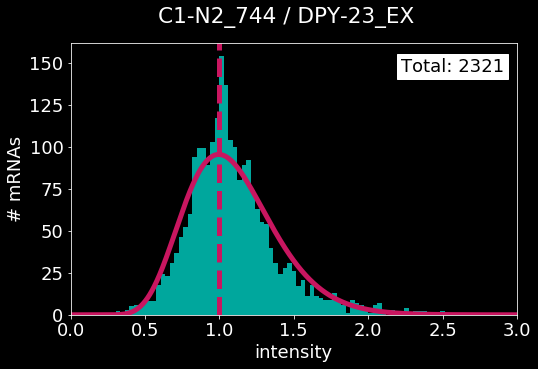

error: L1, L2 [3.5760356283332047, 7.676690880066697]
peak center: 0.9393939393939394


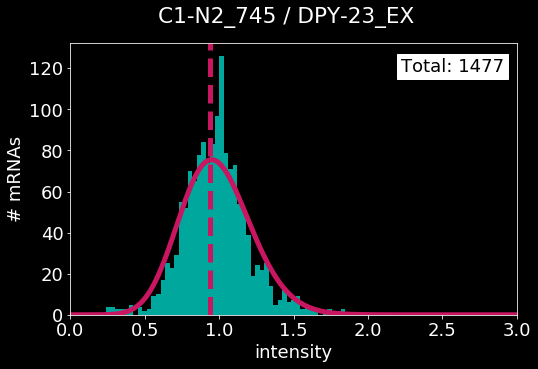

error: L1, L2 [5.9669522517622315, 9.880112776404804]
peak center: 1.0303030303030303


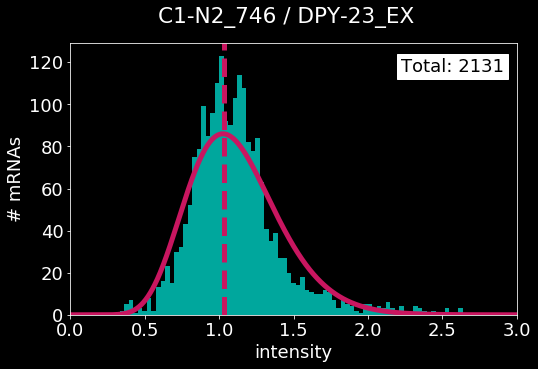

error: L1, L2 [4.266620500333517, 8.167768522095228]
peak center: 1.0303030303030303


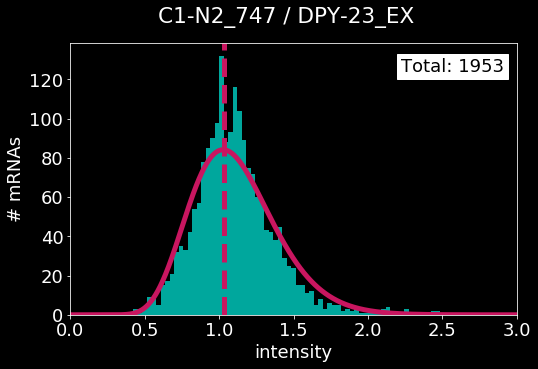

error: L1, L2 [3.5843724243315354, 7.9793474552243495]
peak center: 0.9696969696969697


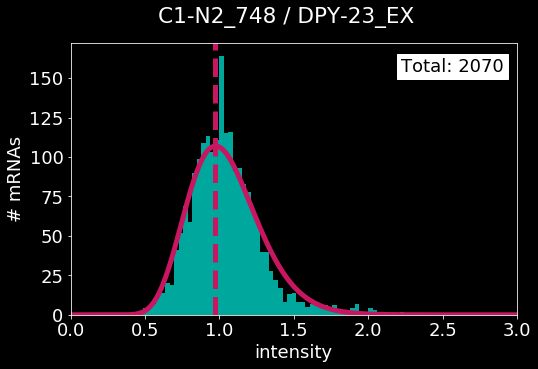

error: L1, L2 [6.887049351550555, 12.582835211324623]
peak center: 1.0


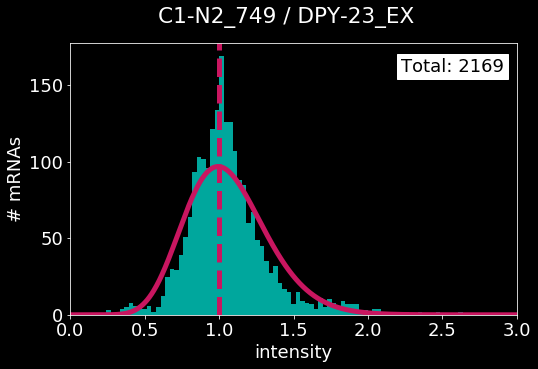

error: L1, L2 [3.4001261821861366, 6.116794270631412]
peak center: 1.0303030303030303


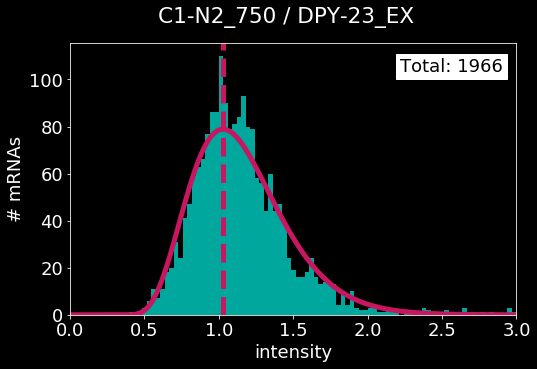

error: L1, L2 [5.345184401664997, 10.02381949212525]
peak center: 1.0


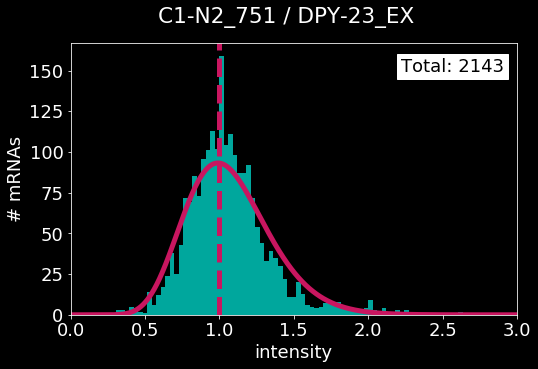

error: L1, L2 [5.52961520157581, 11.66742055632171]
peak center: 1.0


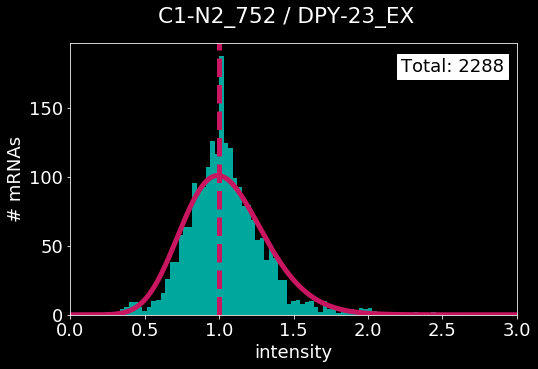

error: L1, L2 [2.4372918622149697, 4.428715429791301]
peak center: 1.0303030303030303


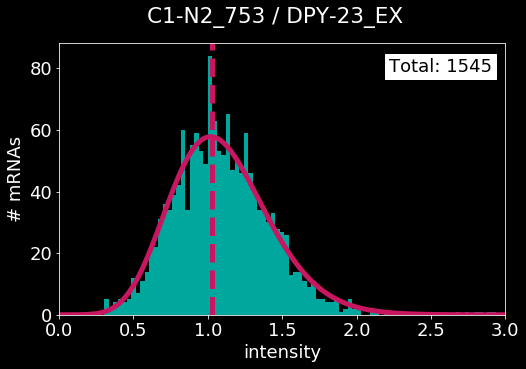

error: L1, L2 [2.252527813777927, 3.726357008151953]
peak center: 1.0606060606060606


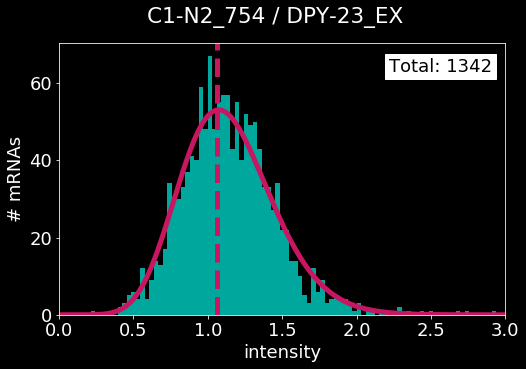

error: L1, L2 [3.622459101148011, 6.657393336808278]
peak center: 1.0


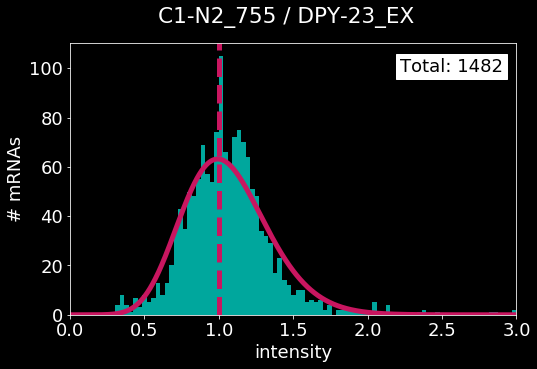

error: L1, L2 [2.9288587213445245, 5.387010336192627]
peak center: 1.0


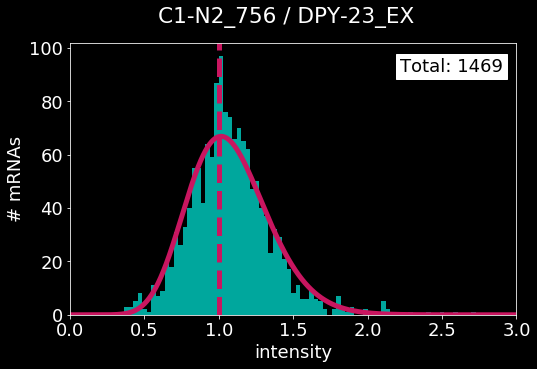

error: L1, L2 [4.572627464278882, 7.629630887783146]
peak center: 1.0303030303030303


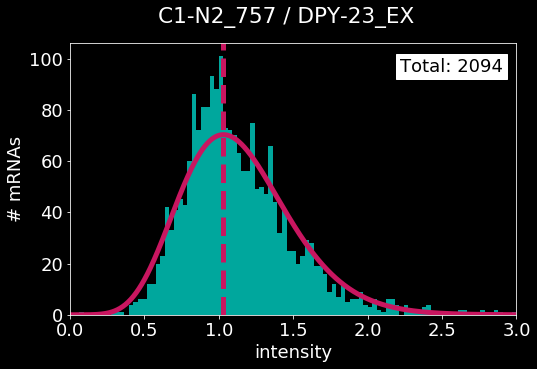

error: L1, L2 [2.941142794254059, 6.361682818782136]
peak center: 1.0


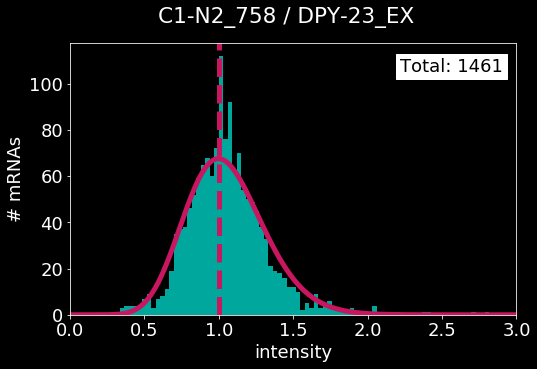

error: L1, L2 [4.19013675924341, 8.87202622598036]
peak center: 0.9393939393939394


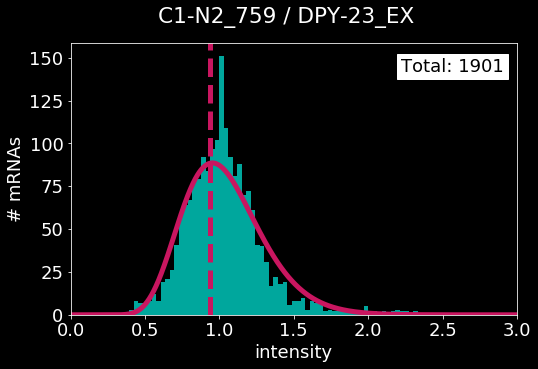

error: L1, L2 [5.1872291535740525, 10.294440043888882]
peak center: 0.9696969696969697


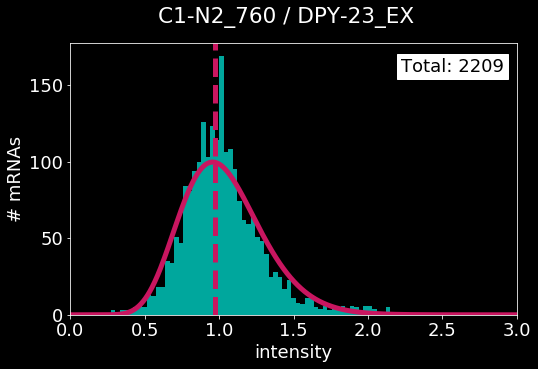

error: L1, L2 [1.9546409510426446, 3.63493144546178]
peak center: 1.0


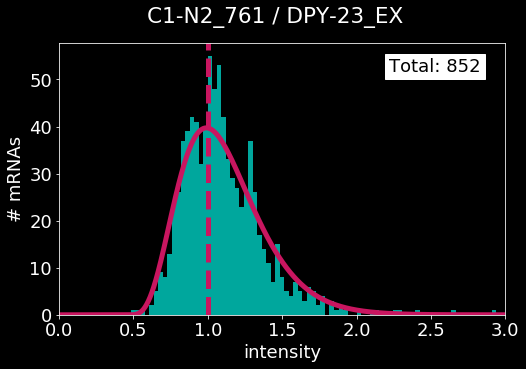

error: L1, L2 [2.196497133509303, 3.877614475546589]
peak center: 0.9393939393939394


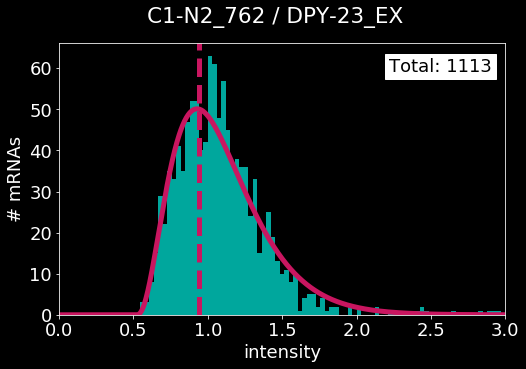

error: L1, L2 [2.57019351452781, 4.347380056049511]
peak center: 1.0


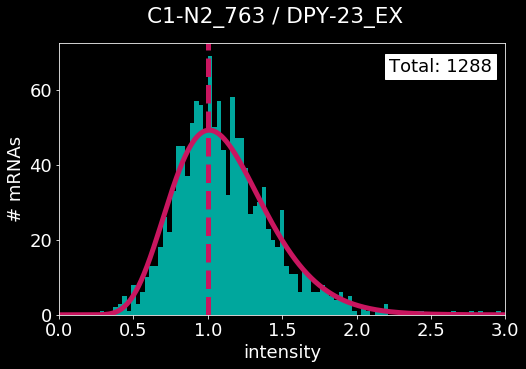

error: L1, L2 [3.5718257195269154, 6.710064152913526]
peak center: 0.9696969696969697


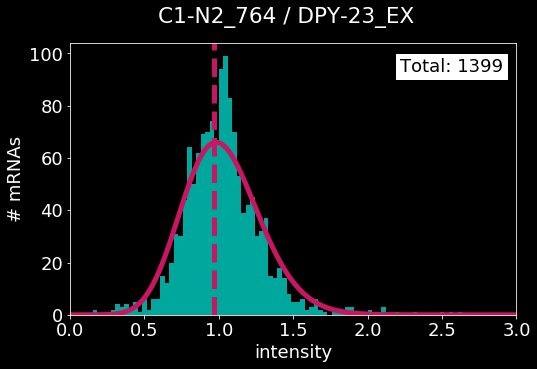

error: L1, L2 [13.002482386925848, 20.28598267522002]
peak center: 0.4545454545454546


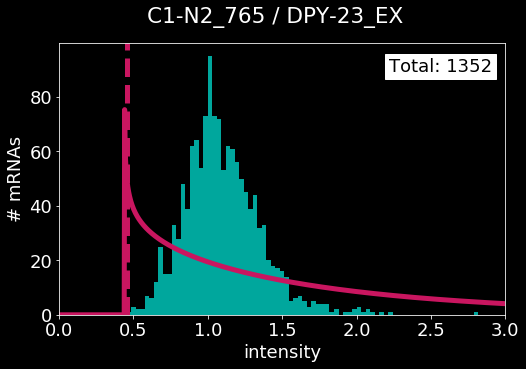

error: L1, L2 [3.546863035342695, 6.210802705832125]
peak center: 1.0303030303030303


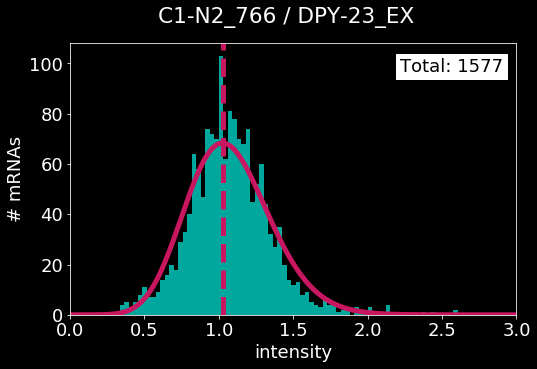

error: L1, L2 [2.936995258843707, 6.4472864467739175]
peak center: 0.9696969696969697


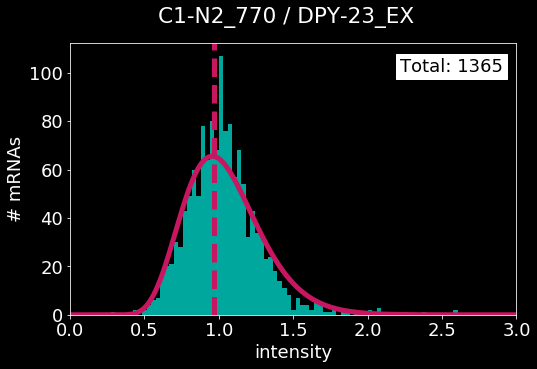

error: L1, L2 [5.096289006210678, 9.342135259276361]
peak center: 1.0303030303030303


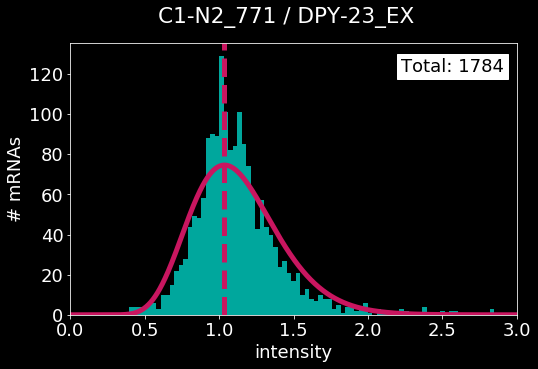

error: L1, L2 [3.8639543909002936, 6.718373776200207]
peak center: 1.0


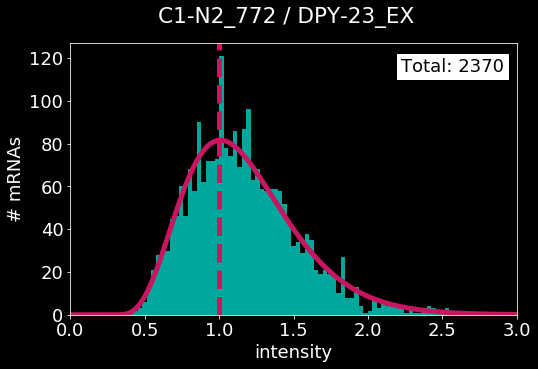

error: L1, L2 [2.9738454972665855, 5.894894150511046]
peak center: 0.9696969696969697


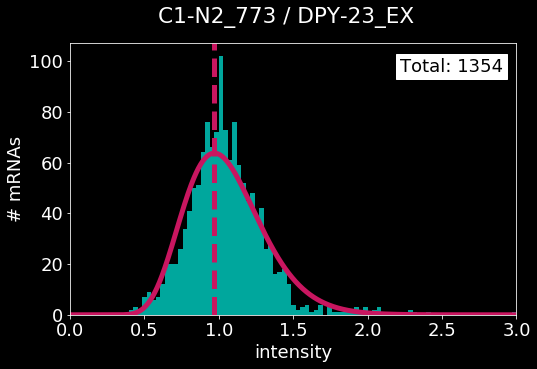

error: L1, L2 [3.1541772687973157, 4.778552282723021]
peak center: 1.0


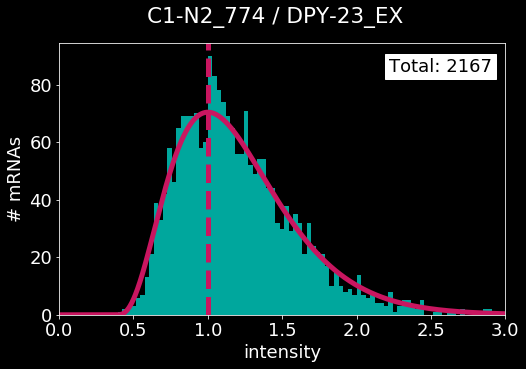

error: L1, L2 [5.379463839171049, 9.24145543107518]
peak center: 0.9696969696969697


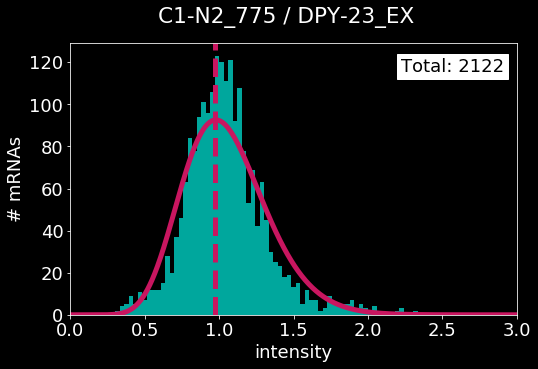

error: L1, L2 [3.680389591006913, 6.281549659265042]
peak center: 1.0303030303030303


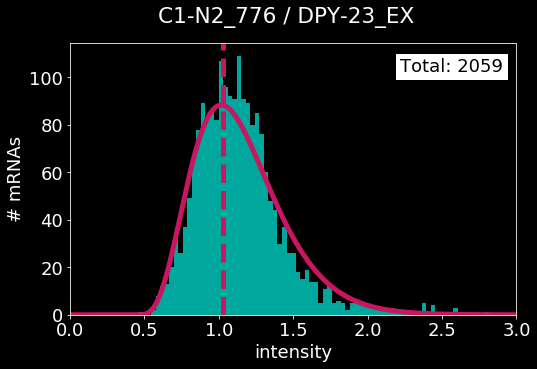

error: L1, L2 [4.229597903320328, 7.610382257695701]
peak center: 1.0


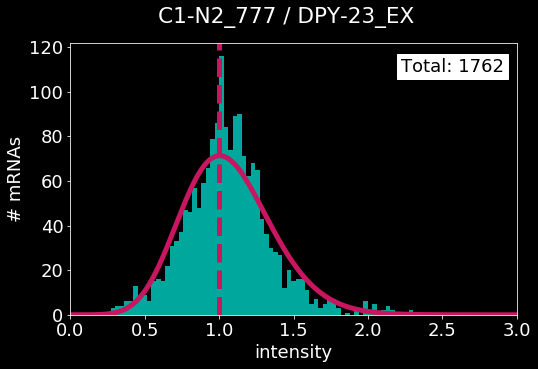

error: L1, L2 [3.3837232990209727, 5.8746018537297315]
peak center: 1.0


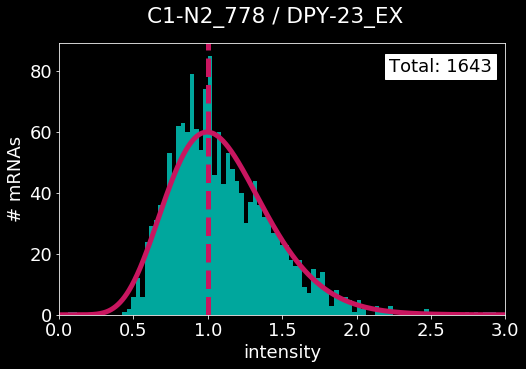

error: L1, L2 [3.031999219074317, 6.180955500684568]
peak center: 1.0303030303030303


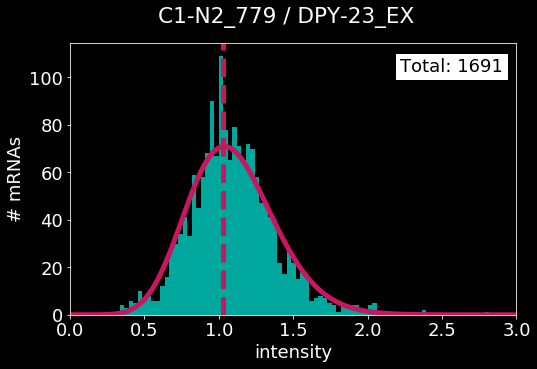

error: L1, L2 [3.381495563925361, 4.930522510124161]
peak center: 1.0303030303030303


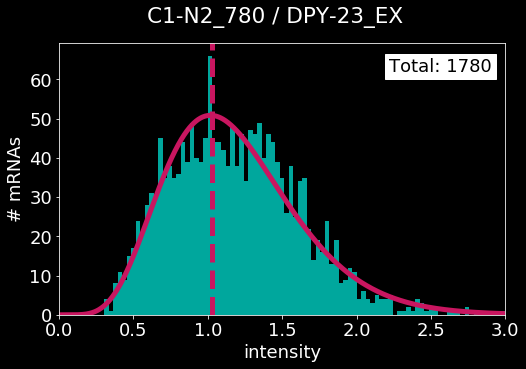

error: L1, L2 [1.8360183532063783, 4.213603550156109]
peak center: 0.696969696969697


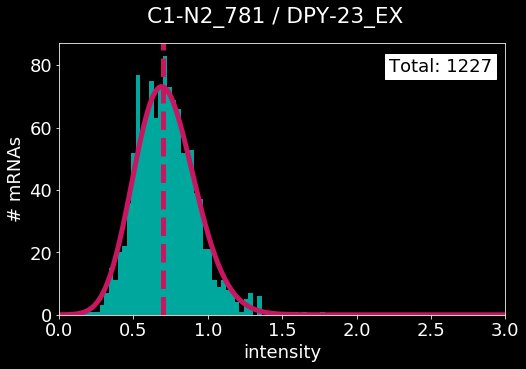

error: L1, L2 [3.0068645097937257, 5.091802430205048]
peak center: 0.9696969696969697


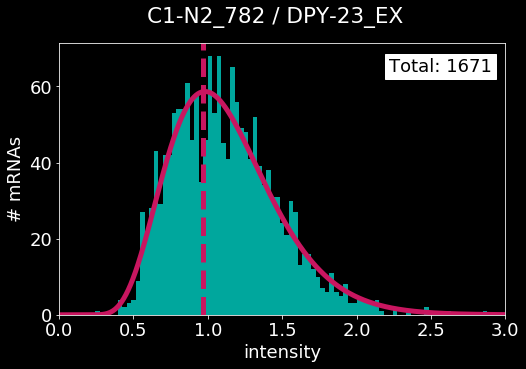

error: L1, L2 [2.391460679194604, 4.206628193174094]
peak center: 1.0


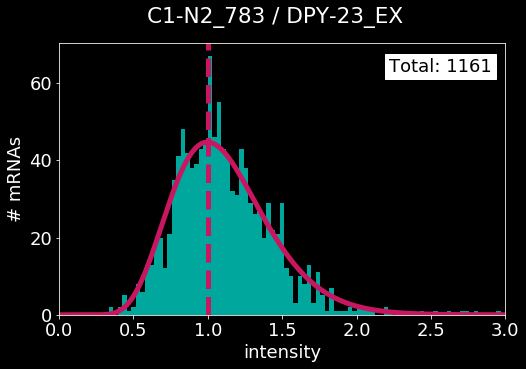

error: L1, L2 [2.796802544528667, 5.015444176258232]
peak center: 1.0606060606060606


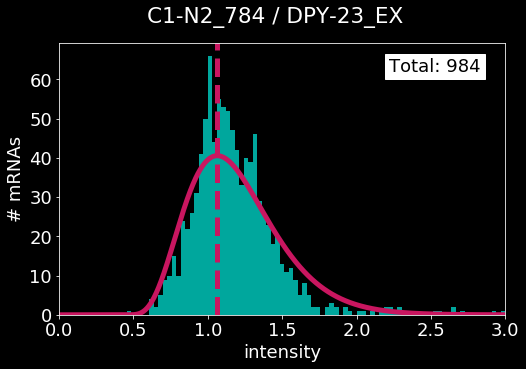

error: L1, L2 [3.024292118174034, 5.905948696124774]
peak center: 1.0303030303030303


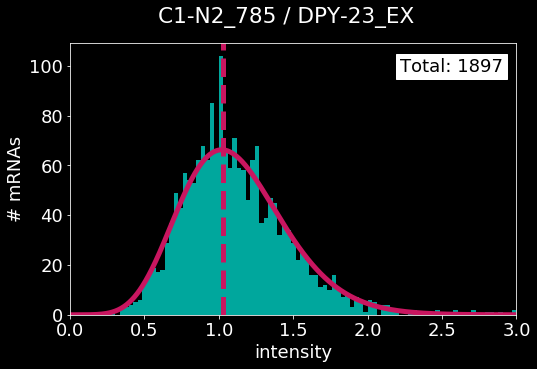

error: L1, L2 [4.787983568617141, 9.009564977835405]
peak center: 0.9696969696969697


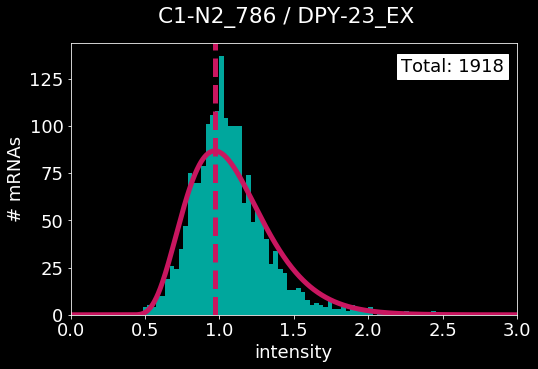

error: L1, L2 [2.0165979111514716, 3.6999299840788797]
peak center: 1.0303030303030303


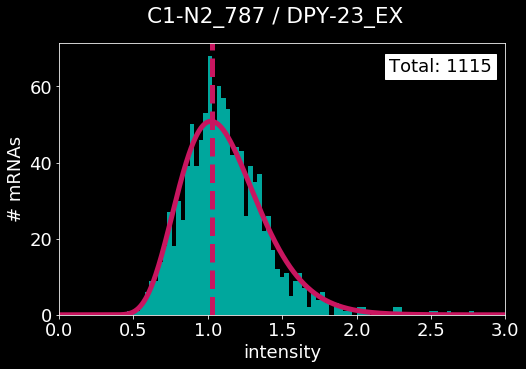

error: L1, L2 [2.7510895363201406, 5.153540362520982]
peak center: 1.0606060606060606


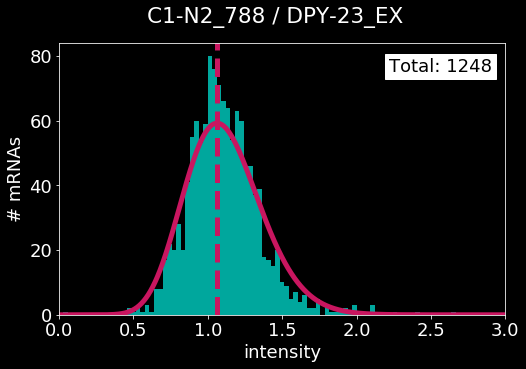

error: L1, L2 [3.120483055429988, 6.094006288431001]
peak center: 1.0


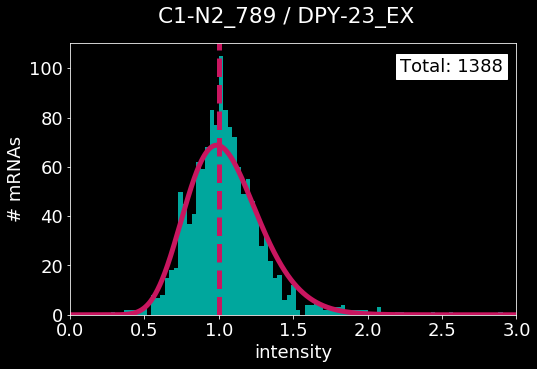

error: L1, L2 [3.6315183683708288, 6.581699402863688]
peak center: 1.0


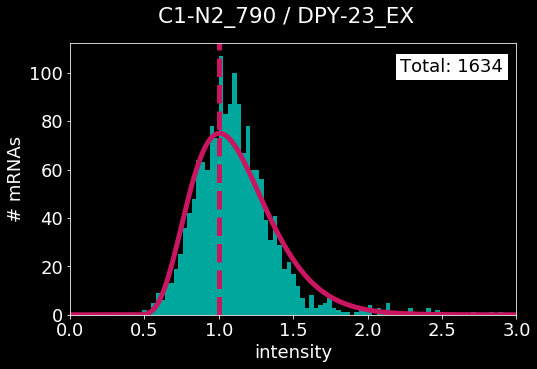

error: L1, L2 [8.34903278768286, 13.092942505570885]
peak center: 0.7575757575757576


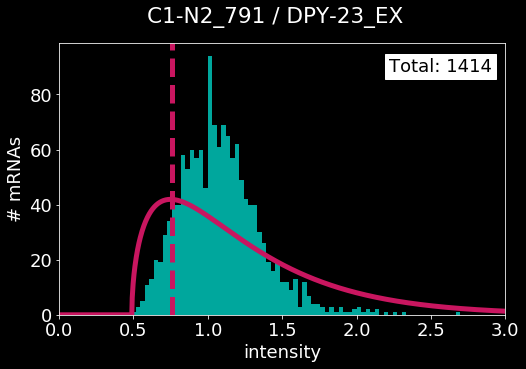

error: L1, L2 [2.7163408577872006, 4.6958736120159426]
peak center: 0.9090909090909092


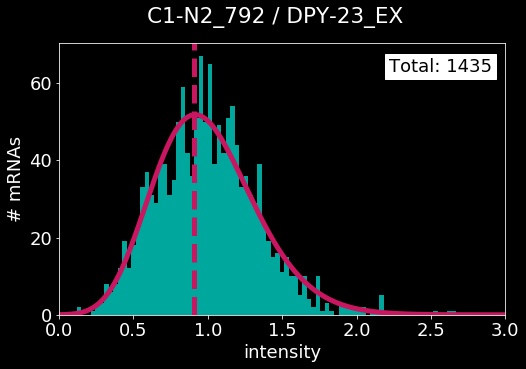

error: L1, L2 [3.751032006204265, 6.66191063539114]
peak center: 1.0


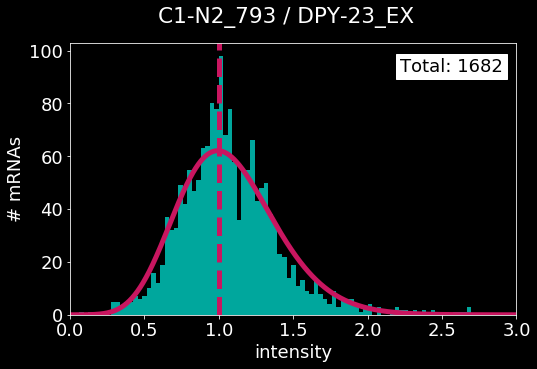

error: L1, L2 [2.5230482848887568, 4.872833269056464]
peak center: 0.9696969696969697


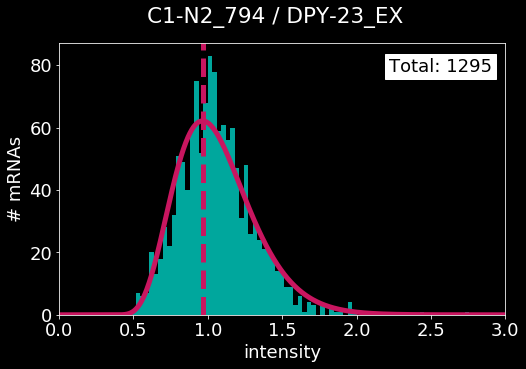

error: L1, L2 [3.6849786598527694, 6.363403168728011]
peak center: 1.0303030303030303


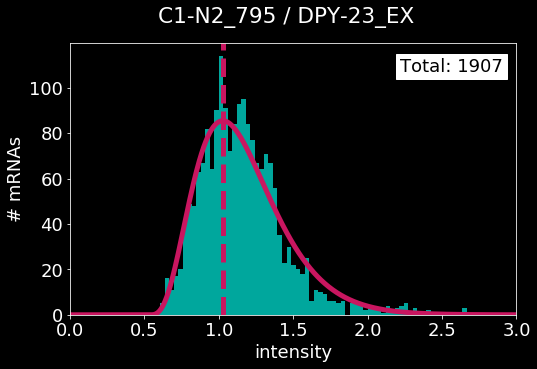

error: L1, L2 [3.550085402691612, 7.388368447930028]
peak center: 1.0


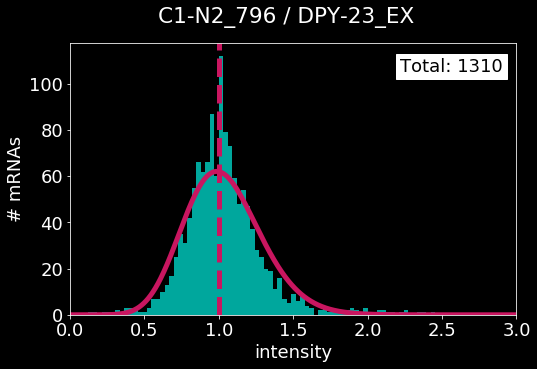

error: L1, L2 [4.792560444744962, 8.519090300427028]
peak center: 1.0


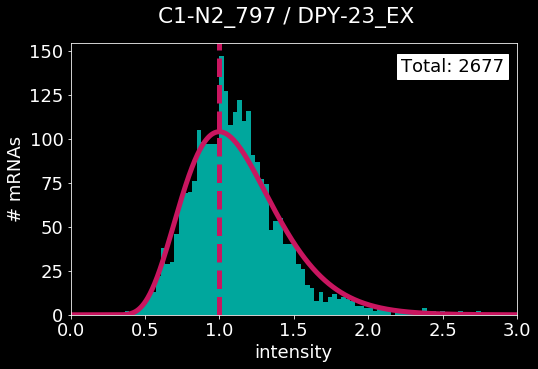

error: L1, L2 [3.454987906112897, 7.036459428168243]
peak center: 0.9696969696969697


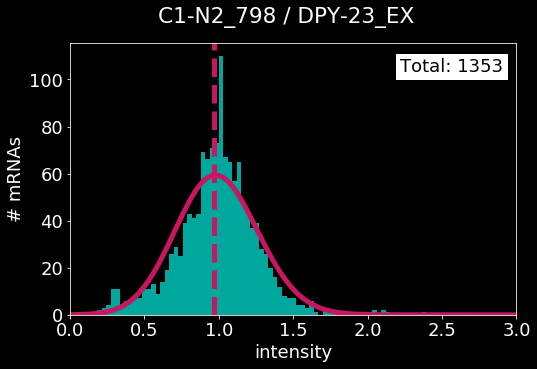

error: L1, L2 [3.503730095440622, 6.870401514080224]
peak center: 1.0


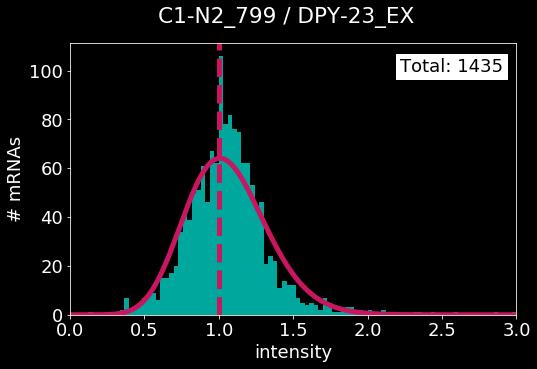

error: L1, L2 [4.441015186382303, 9.06574965596323]
peak center: 0.9696969696969697


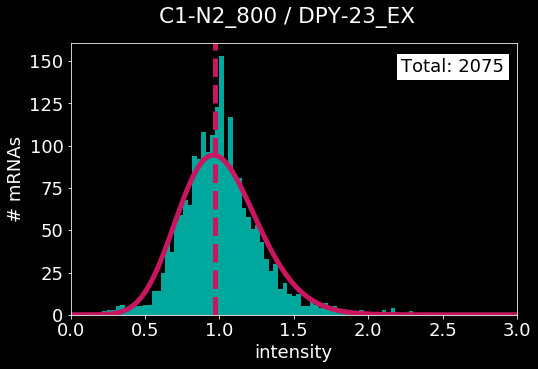

error: L1, L2 [2.7170618971933482, 5.115739278545344]
peak center: 0.9696969696969697


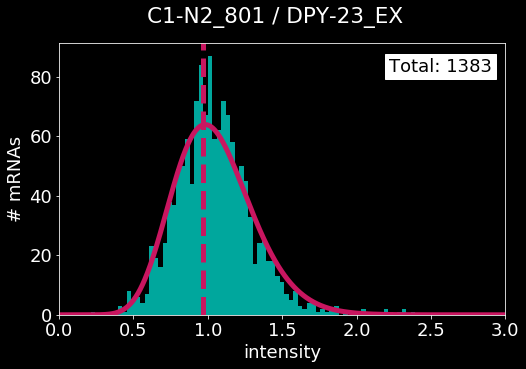

error: L1, L2 [2.8134576327101535e+22, 2.7993549993783336e+23]
peak center: 0.0


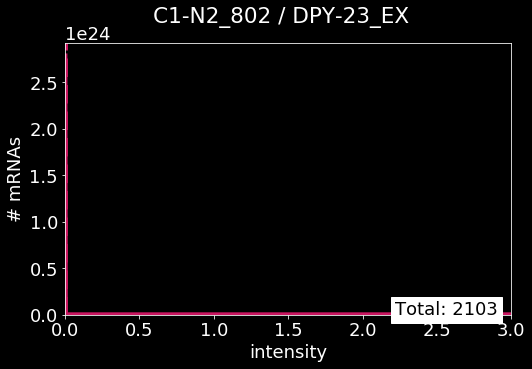

error: L1, L2 [2.0751790492559827, 3.442949988402291]
peak center: 0.9393939393939394


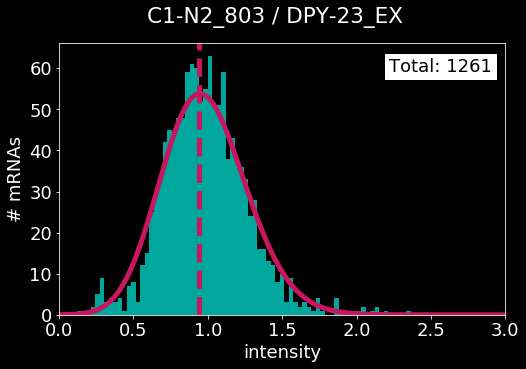

error: L1, L2 [5.0973877072895455, 10.498778048381434]
peak center: 0.9696969696969697


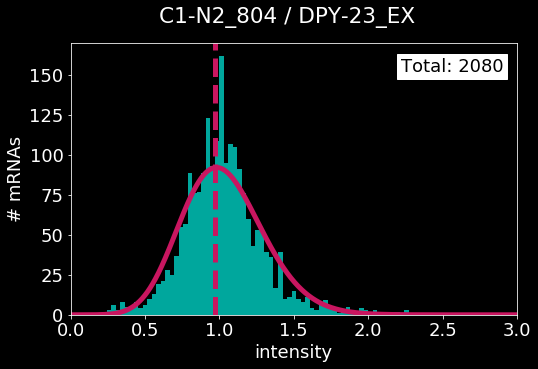

error: L1, L2 [3.310915646110429, 7.392173828104494]
peak center: 0.9696969696969697


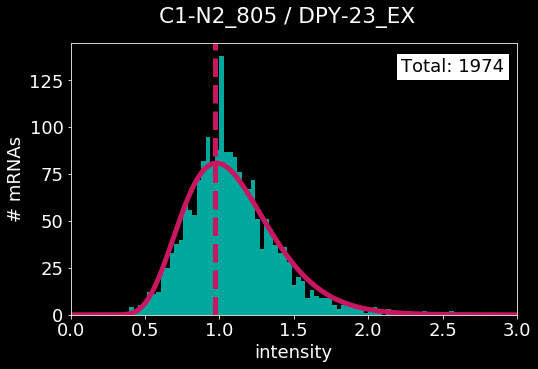

error: L1, L2 [3.0280242347773387, 5.071571354932831]
peak center: 1.0


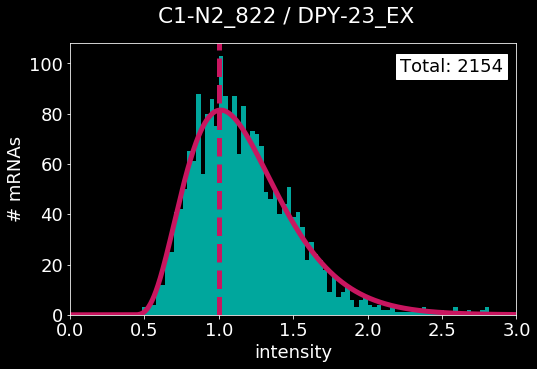

error: L1, L2 [1.661865533652374, 3.217632347022833]
peak center: 1.0


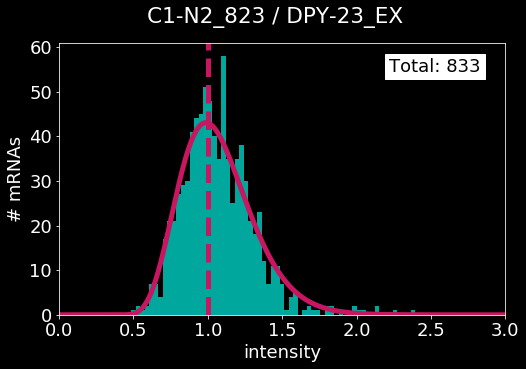

error: L1, L2 [2.9371941332896836, 6.506636118155348]
peak center: 0.9393939393939394


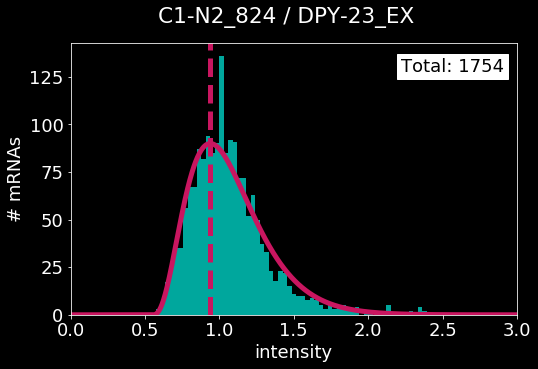

error: L1, L2 [3.618665182358237, 6.928065782602308]
peak center: 1.0


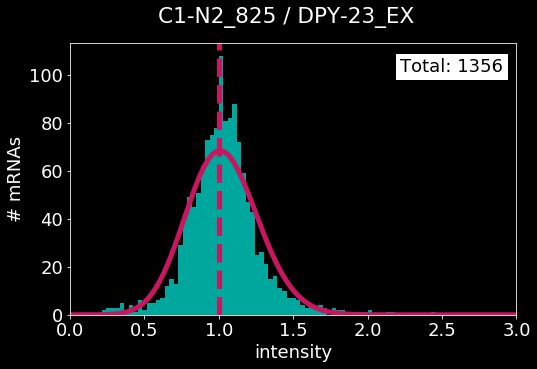

error: L1, L2 [4.1831508813468385, 7.952044158473798]
peak center: 1.0


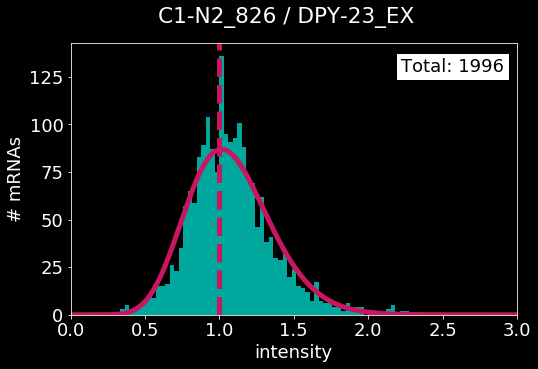

error: L1, L2 [20.254181188371167, 53.33234761230966]
peak center: 0.15151515151515152


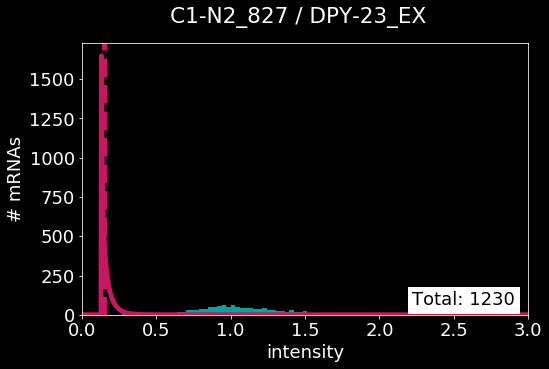

error: L1, L2 [3.56066527638853, 7.461094470271066]
peak center: 0.9696969696969697


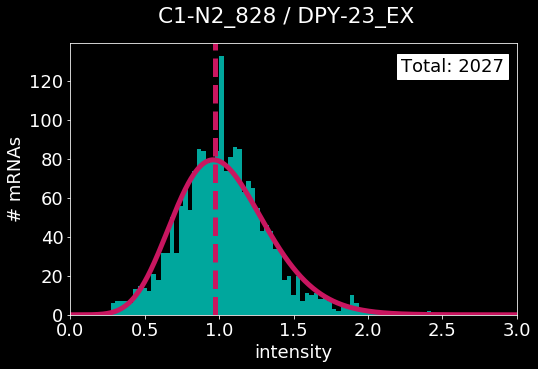

error: L1, L2 [3.814327993049427, 7.591530160207412]
peak center: 0.9696969696969697


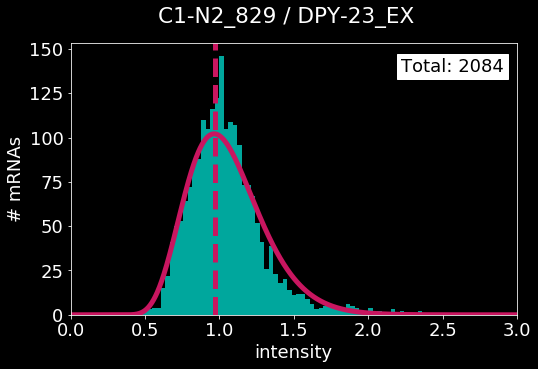

In [54]:
# have to perform this step multiple times and choose the best one 
# perform n_fits with different initial parameters
# n_fits = 10

folder_path = folder + "histograms-2/" + labels[0] + "/"

plt.rcParams.update({'font.size': 18})
plt.style.use('dark_background')

# actual plotting 
for idx in range(0, len(dataset)):    
    if(not os.path.exists(dataset[idx])):
        # print("doesn't exist")
        continue
        
    try:
        # create the canvas
        fig = plt.figure(figsize=(8,5))
        title = create_title(dataset[idx], name_id=5)
        fig.suptitle(title + " / " + labels[0])

        # load the data and scale it accordingly
        I = load_data(dataset[idx], skiprows_=0)

        # some const params for all graphs
        # num_bins = 100; 
        # graph [xmin, xmax]
        # xmin = np.min(I)
        # xmax = np.max(I)
        # binwidth = (xmax - xmin)/(num_bins - 1)
        # bins = np.arange(xmin, xmax + binwidth, binwidth)

        I_res = I
        # calculate the params for gauss fit
        binned_values, real_bins = np.histogram(I, bins)
        use_median = np.median(I_res)
        # inititally there was use_median/2 
        fit_alpha, fit_loc, fit_beta = gamma.fit(I_res, loc=use_median/2, scale=1/np.max(binned_values))
        # normalization factor
        factor = np.sum(binned_values*np.diff(real_bins))

        plt.hist(I, bins=bins, color=color, label=labels, density=False)

        x = np.linspace(xmin, xmax, 1000)
        y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)*factor
        plt.plot(x,y, linewidth=5, color='#C91660')
        yhat = gamma.pdf(real_bins, fit_alpha, fit_loc, fit_beta)*factor

        # vertical line for center
        plt.axvline(x=real_bins[np.argmax(yhat)], linestyle="--", linewidth=5, color='#C91660')

        if (np.any(np.isnan(yhat))):
            continue

        error = fitter_meter(binned_values, yhat[:-1])

        print("error: L1, L2", error)
        print("peak center:", real_bins[np.argmax(yhat)])

        # reasonable adjustments to make the data look nicer
        plt.xlabel('intensity')
        plt.ylabel('# mRNAs')

        # info_text = "Total: " + str(I.shape[0]) + "\n" + "Peak: " +  str('%.2f' % real_bins[np.argmax(yhat)]) + "\n" + "L1: " + str('%.2f' % error[0]) + "\n" + "L2: " +  str('%.2f' % error[1]) 
        info_text = "Total: " + str(I.shape[0])

        x_limits = [xmin, xmax]
        ymax = np.max(np.histogram(I, bins)[0])
        y_limits = [0, ymax]

        plt.text(x_limits[1] - (x_limits[1] - x_limits[0])*0.26, y_limits[1]*0.94, info_text, color='black', bbox=dict(facecolor='white', alpha=1))
        plt.xlim(x_limits)

        # save the peak values for further 
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
        plt.savefig(folder_path + title + ".pdf") 
        plt.show()
    except(RuntimeError, TypeError, ValueError):
        print("There was an exception but we\'ll fix it for you")
    # break

### ?plt.hist

In [ ]:
# make the plot with the total number of the detections
folder_path = folder + "total-2/" + labels[0] + "/"
print(folder_path)

result_set = {}

# actual plotting 
for idx in range(0, len(dataset)):    
    if(not os.path.exists(dataset[idx])):
        # print("doesn't exist")
        continue
   
    try:
        print(dataset[idx])

        # load the data and scale it accordingly
        I = load_data(dataset[idx])
        I_res = I

        # some const params for all graphs
        num_bins = 100; 
        # graph [xmin, xmax]
        xmin = 0
        xmax = 3
        binwidth = (xmax - xmin)/(num_bins - 1)
        bins = np.arange(xmin, xmax + binwidth, binwidth)

        binned_values, real_bins = np.histogram(I_res, bins)
        use_median = np.median(I_res)
        # inititally there was use_median/2 
        fit_alpha, fit_loc, fit_beta = gamma.fit(I_res, loc=use_median/2, scale=1/np.max(binned_values))
        # normalization factor
        factor = np.sum(binned_values*np.diff(real_bins))
        x = np.linspace(xmin, xmax, 1000)
        y = gamma.pdf(x, fit_alpha, fit_loc, fit_beta)*factor
        yhat = gamma.pdf(real_bins, fit_alpha, fit_loc, fit_beta)*factor

        if (np.any(np.isnan(yhat))):
            continue

        # should be close to 1
        x_center = real_bins[np.argmax(yhat)]

        # error less than 15%
        print ("error:", np.abs(x_center - 1), "; center:", x_center)
        if (np.abs(x_center - 1) < 0.15):    
            title = create_title(dataset[idx], name_id=5)
            result_set[title] = len(I)   
    except(RuntimeError, TypeError, ValueError, StopIteration):
        print("There was an exception but we\'ll fix it for you")
            
print(list(result_set.values()))        
        
# these are subject to change
xmin = 0
xmax = 4000
binwidth = 100
num_bins = (xmax - xmin) / binwidth + 1;
bins = np.arange(xmin, xmax + binwidth, binwidth)
xlimits = [xmin, xmax]

spots_total = list(result_set.values())

fig = plt.figure(figsize=(8,5))
fig.suptitle(labels[0] + ": Total")
plt.hist(spots_total, bins=bins, color=color, label=labels, normed=False)

plt.xlabel("# spots")
plt.ylabel("# embryos")

df_center = pd.DataFrame(list(result_set.items()), columns=['filename', 'total'])
if not os.path.exists(folder_path):
    os.makedirs(folder_path )
df_center.to_csv(folder_path + labels[0] +"-total.csv", index=False, header=True, encoding='utf-8', mode = 'w' )
plt.savefig(folder_path + labels[0] + "-total.pdf") 
plt.show()
        
print ("DOGE!")  